# Setup environment

In [1]:
import os
import numpy as np
import pandas as pd
pd.set_option('display.precision', 10)
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone
import copy
import pathlib

from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split

from src.lightgbm_wrapper.feature_engineer import add_time_features, add_lag_features, add_rolling_features
from src.lightgbm_wrapper.station_embedding import learn_station_embeddings, attach_station_embedding
from src.lightgbm_wrapper.plot import plot_1_data, plot_2_data
from src.lightgbm_wrapper.model import build_supervised_for_horizon, train_test_validation_split, train_lgbm_for_horizon, plot_timeseries_example


try:
    import lightgbm as lgb
except:
    print("lightgbm is not installed")

DATA_DIR = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"
STATION_IDS = [211, 212, 213, 214, 215, 216]

BASE_FEATURE_COLS = [
    "NO2_quantrac",
    "PM25_quantrac",
    "O3_quantrac",
    "CO_quantrac",
    "Temperature_quantrac",
    "Humid_quantrac",
]

# Define lag and rolling windows for feature engineering
LAG_STEPS = [3, 6, 12, 24, 48, 72]
ROLL_WINDOWS = [3, 6, 12, 24, 48, 72]

# Define horizon (= n_past = n_future)
HORIZONS = [1, 24, 48, 72]

'''
# Directory to save the results and meta data
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/{datetime.now(timezone('Asia/Saigon')).strftime('%Y_%m_%d-%H_%M_%S')}"
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")
'''

# Store the results in one directory only, for testing API purpose
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/no2_o3_co_testing_model"
if os.path.isdir(LIGHTGBM_DIR):
    import shutil
    shutil.rmtree(LIGHTGBM_DIR)
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")

/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/no2_o3_co_testing_model


# Load dataset

In [2]:
def load_station_csv(station_id, data_dir=DATA_DIR):
    csv_path = os.path.join(data_dir, f"{station_id}.csv")
    df = pd.read_csv(csv_path)

    # Convert to datetime
    df["date"] = pd.to_datetime(df["date"])
    df = df.sort_values("date").reset_index(drop=True)

    # Remove unncessary column
    if "Unnamed: 0" in df.columns:
        df = df.drop(columns=["Unnamed: 0"])

    # Add station_id column
    df["station_id"] = station_id
    return df

# Load dataset
dfs = []
for sid in STATION_IDS:
    df_sid = load_station_csv(sid, DATA_DIR)
    dfs.append(df_sid)
df_all = pd.concat(dfs, ignore_index=True)

# Sort data by station then date
df_all = df_all.sort_values(["station_id", "date"]).reset_index(drop=True)

# Remove uncessary features
df_all = df_all.loc[:, ["date"] + BASE_FEATURE_COLS + ["station_id"]]

print(df_all.shape)
print(df_all.columns)
df_all

(92966, 8)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
92961,2022-12-31 19:00:00,0.0882333333,41.4500000000,75.9166666667,2.0871666667,27.6900000000,67.2900000000,216
92962,2022-12-31 20:00:00,0.0832166667,50.5300000000,66.1166666667,2.0065000000,27.4016666667,68.0266666667,216
92963,2022-12-31 21:00:00,0.0843000000,55.0550000000,55.1333333333,2.4188333333,27.6033333333,66.9650000000,216
92964,2022-12-31 22:00:00,0.0666500000,26.0783333333,46.7500000000,1.4815000000,27.0366666667,63.3616666667,216


In [3]:
df_all.isnull().sum()

date                        0
NO2_quantrac            43684
PM25_quantrac           43043
O3_quantrac             47797
CO_quantrac             43760
Temperature_quantrac    52890
Humid_quantrac          52890
station_id                  0
dtype: int64

# Data preparation

## Drop missing

Output: df_dropped

In [4]:
df_dropped_na = df_all.dropna().reset_index(drop=True)

df_dropped = df_dropped_na.reset_index(drop=True)
df_dropped

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,0.0882333333,41.4500000000,75.9166666667,2.0871666667,27.6900000000,67.2900000000,216
38705,2022-12-31 20:00:00,0.0832166667,50.5300000000,66.1166666667,2.0065000000,27.4016666667,68.0266666667,216
38706,2022-12-31 21:00:00,0.0843000000,55.0550000000,55.1333333333,2.4188333333,27.6033333333,66.9650000000,216
38707,2022-12-31 22:00:00,0.0666500000,26.0783333333,46.7500000000,1.4815000000,27.0366666667,63.3616666667,216


## Visualization

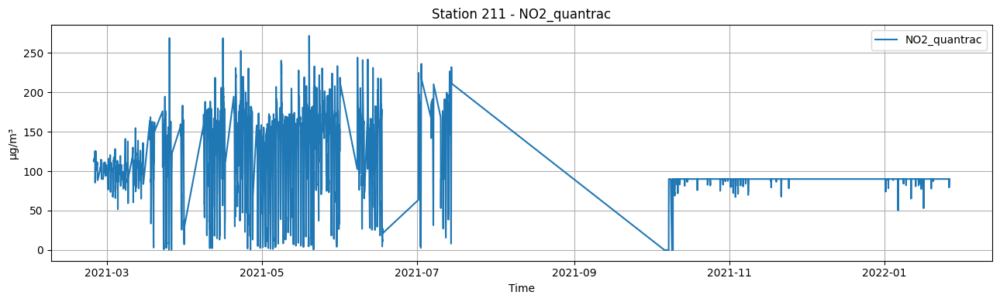

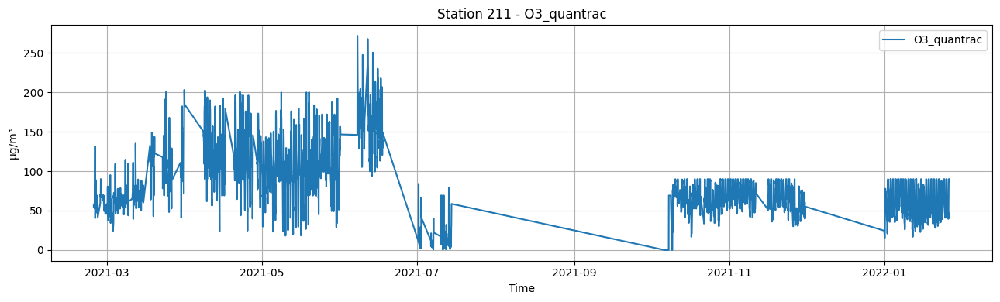

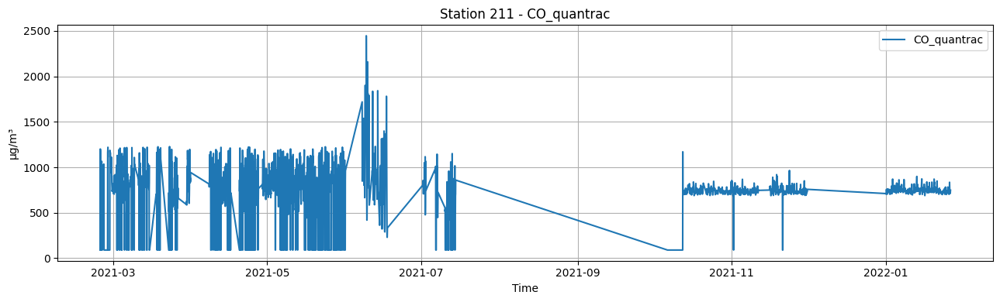

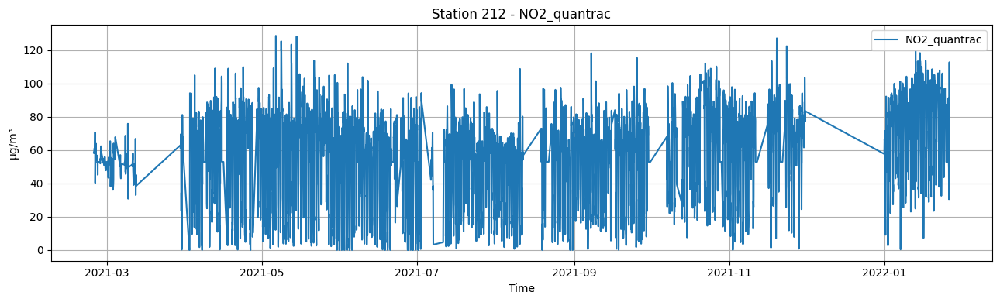

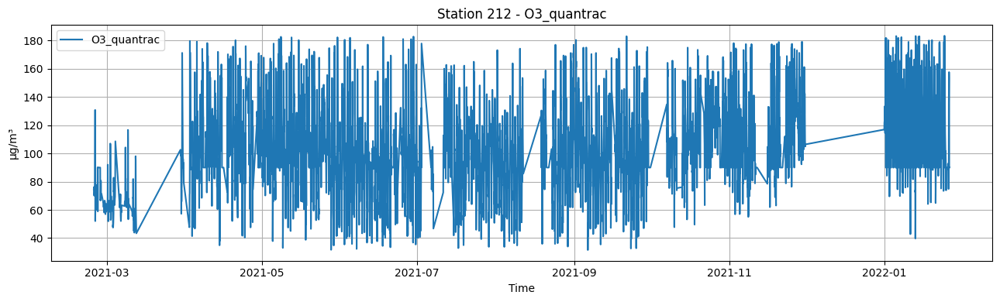

...

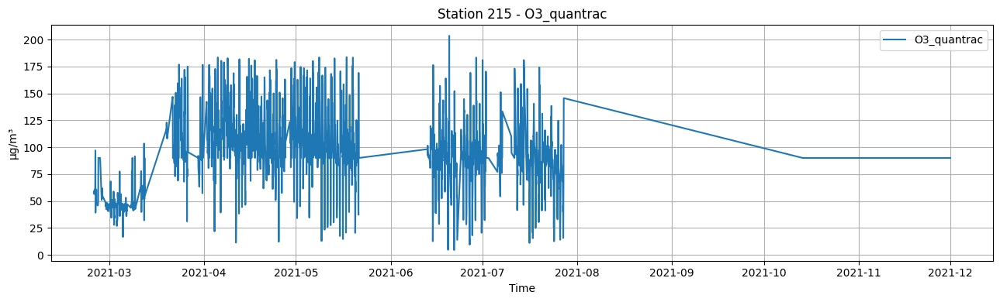

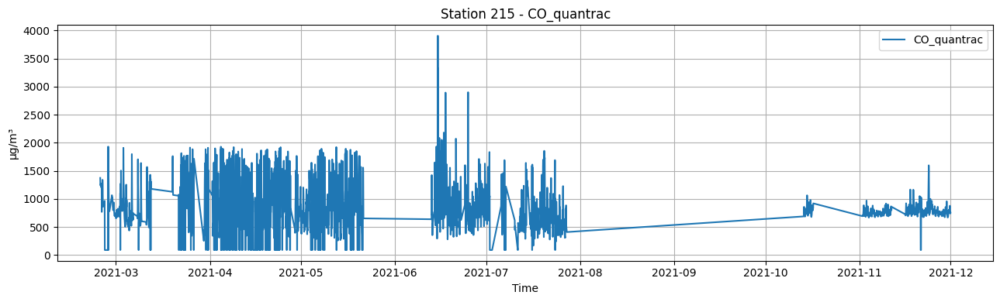

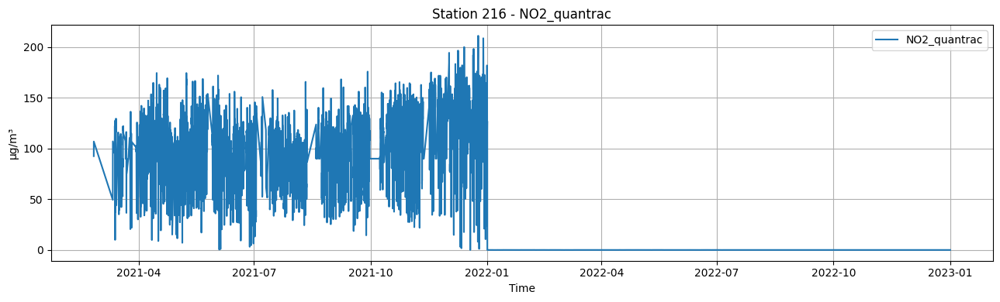

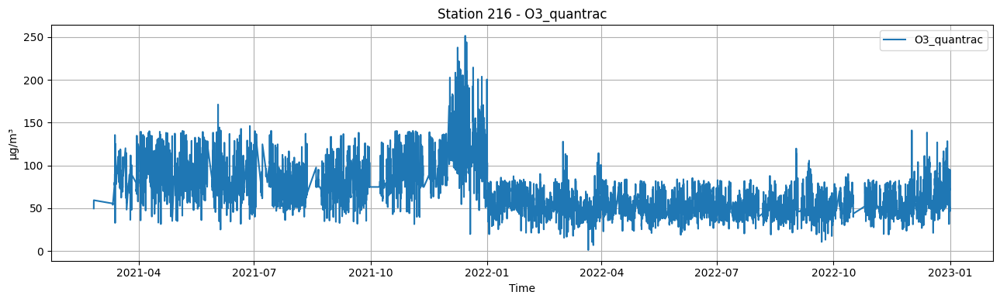

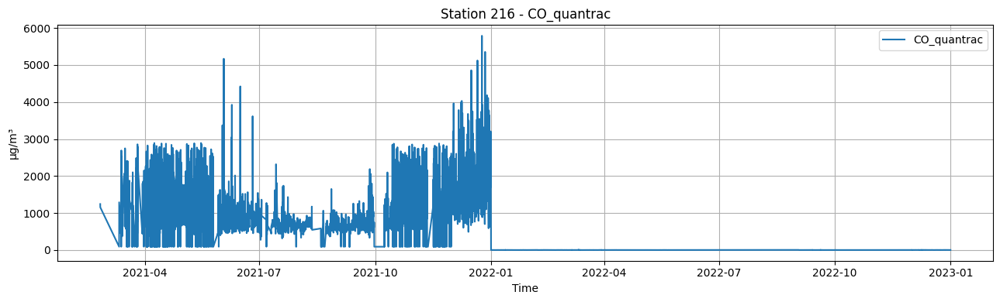

In [5]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, target_col, df_station["date"], f"Station {station} - {target_col}")
            #plot_1_data(df_station, target_col, target_col, df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Convert ppm to ug/m3

Apply only to station 216, year 2022 on NO2, CO columns

Output: df_converted

In [6]:
df_converted = copy.deepcopy(df_dropped)
mask = (df_converted["station_id"] == 216) & (df_converted["date"] >= "2022-01-01")
df_converted.loc[mask, "NO2_quantrac"] = df_converted.loc[mask, "NO2_quantrac"].apply(lambda x: x * 1883.2)
df_converted.loc[mask, "CO_quantrac"] = df_converted.loc[mask, "CO_quantrac"].apply(lambda x: x * 1146.8)
df_converted

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216
38705,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216
38706,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216
38707,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216


## Visualization after converting unit

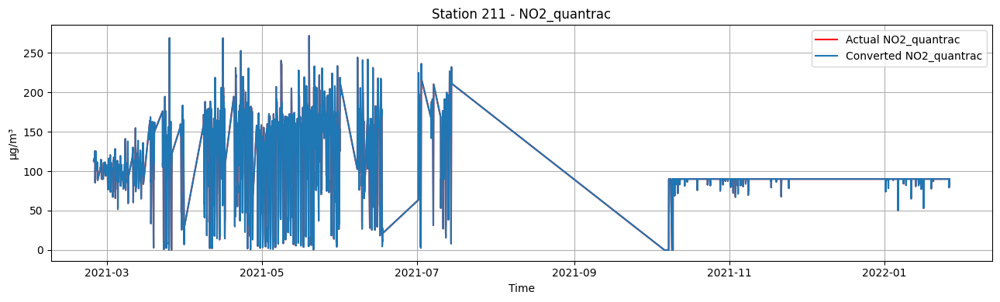

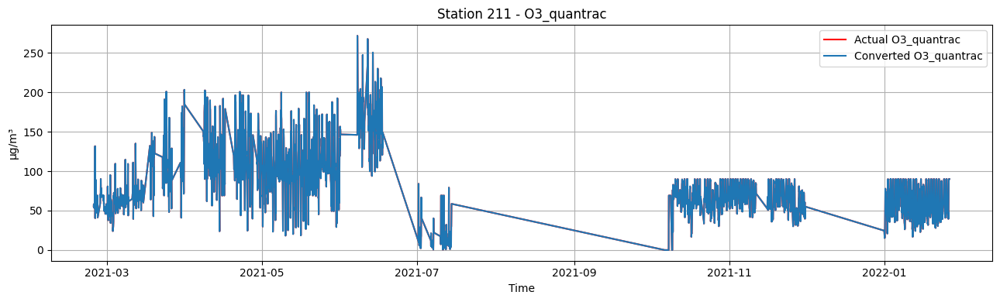

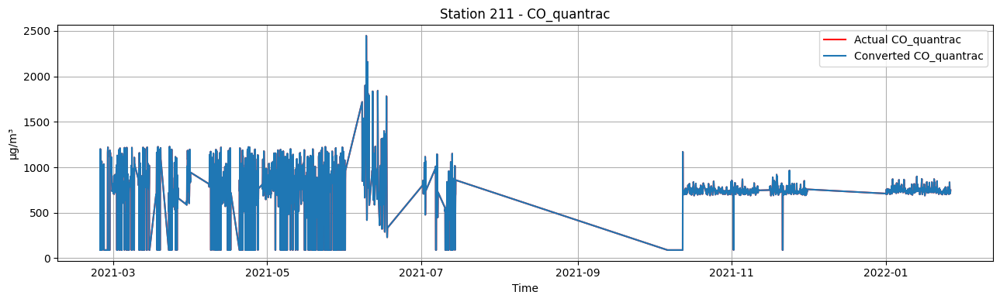

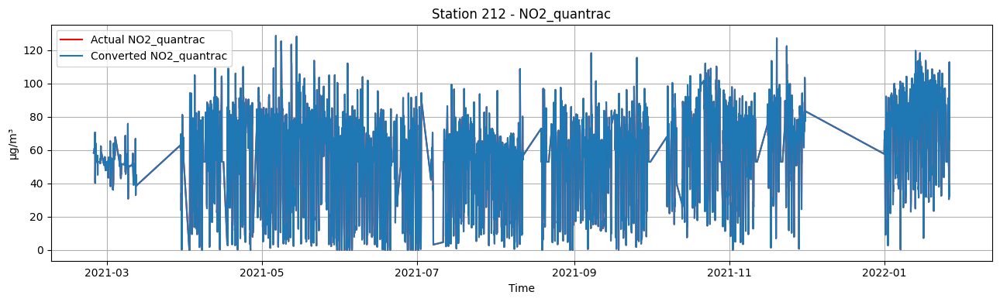

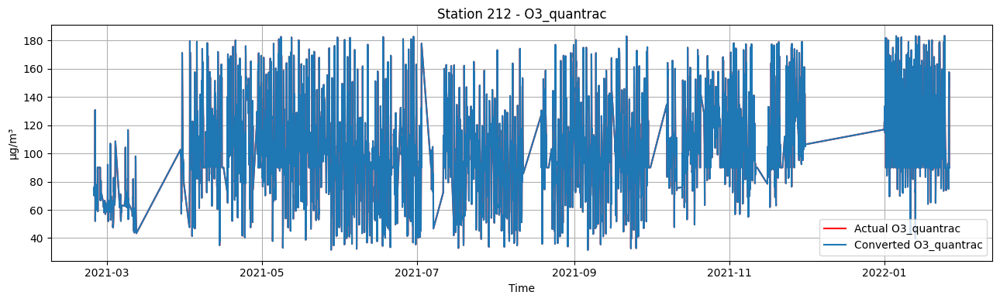

...

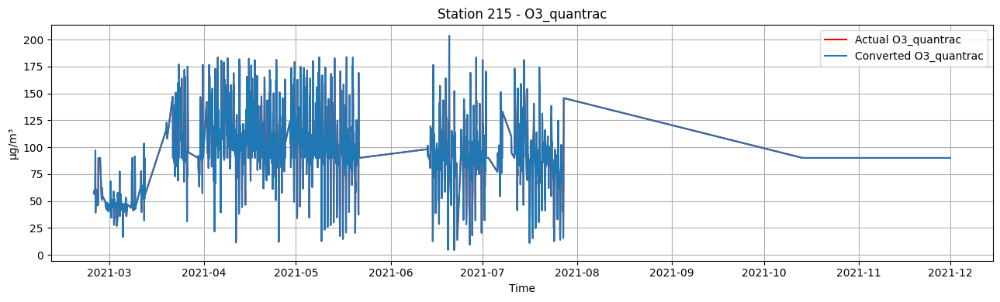

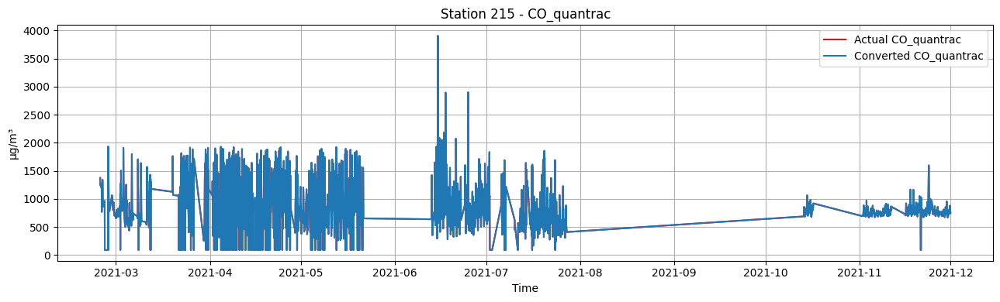

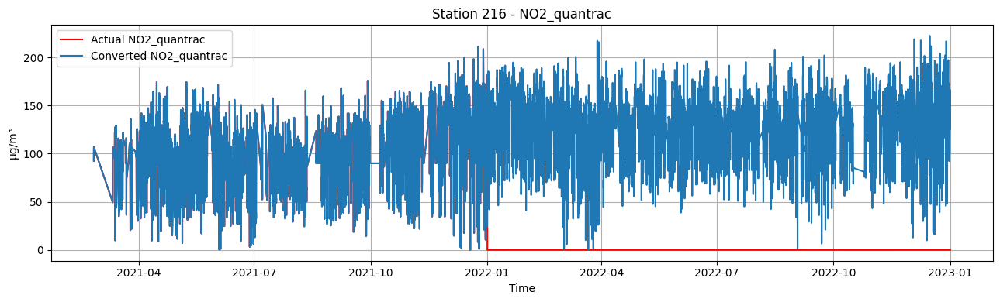

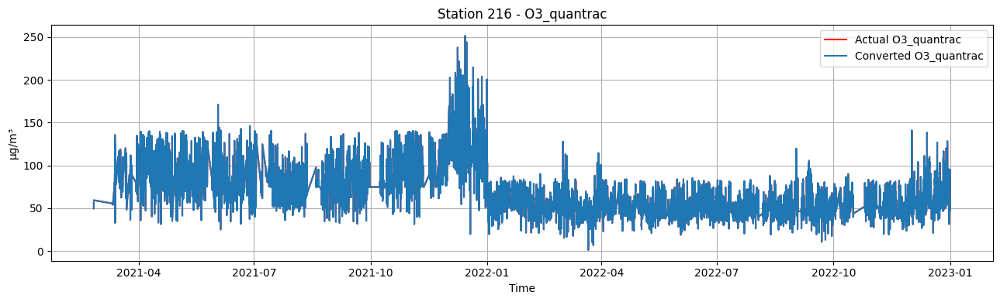

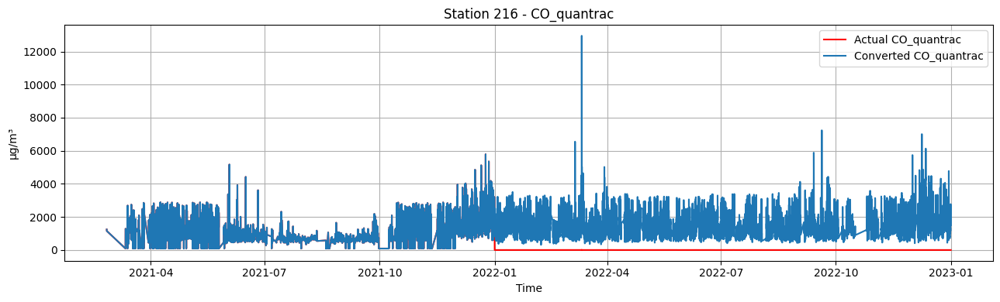

In [7]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    df_station_converted = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_2_data(df_station, target_col, f"Actual {target_col}",
                        df_station_converted, target_col, f"Converted {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Ugly hack to remove outliers

In [8]:
test = copy.deepcopy(df_converted)

lenbefore = len(test)
print(f"Before: {lenbefore} records")

# 212 CO quantrac
test212 = test[test["station_id"] == 212]
test = test.drop(index=test212[test212["CO_quantrac"] > 4000].index)

# 213 CO quantrac
test213 = test[test["station_id"] == 213]
test = test.drop(index=test213[test213["CO_quantrac"] > 4000].index)

# 214 CO quantrac
test214 = test[test["station_id"] == 214]
test = test.drop(index=test214[test214["CO_quantrac"] > 4000].index)

# 215 NO2 quantrac
# 215 CO quantrac
test215 = test[test["station_id"] == 215]
test = test.drop(index=test215[test215["NO2_quantrac"] > 140].index)
test = test.drop(index=test215[test215["CO_quantrac"] > 2500].index)

# 216 CO quantrac
test216 = test[test["station_id"] == 216]
test = test.drop(index=test216[test216["CO_quantrac"] > 10000].index)

lenafter = len(test)
print(f"After: {lenafter} records")
print(f"Removed {lenbefore - lenafter} records")

df_converted = test.reset_index(drop=True)

Before: 38709 records
After: 38692 records
Removed 17 records


## Visualization after removing outliers

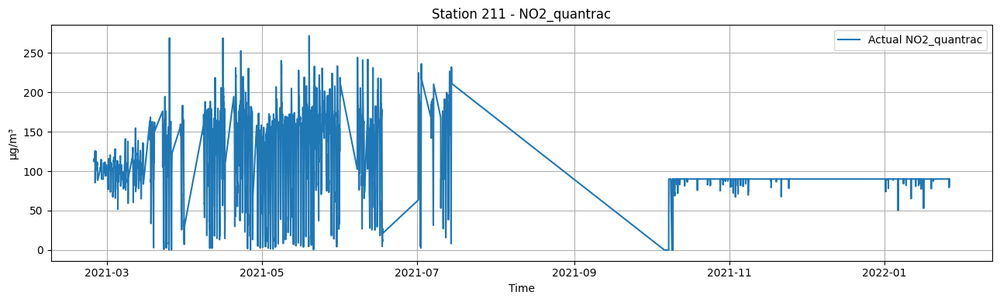

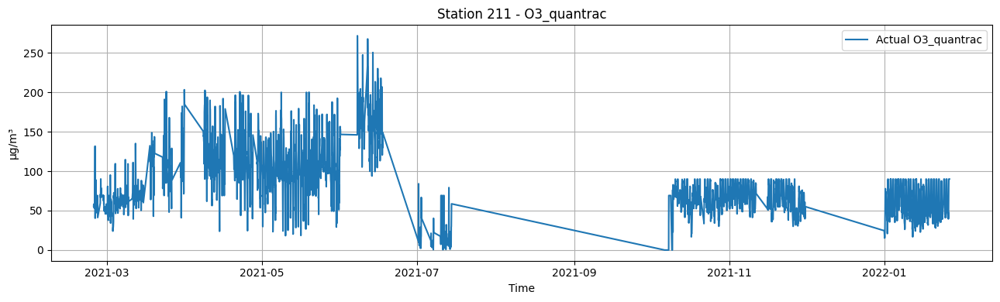

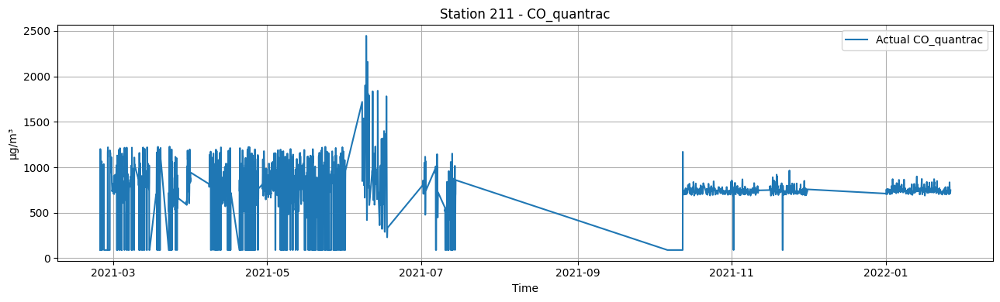

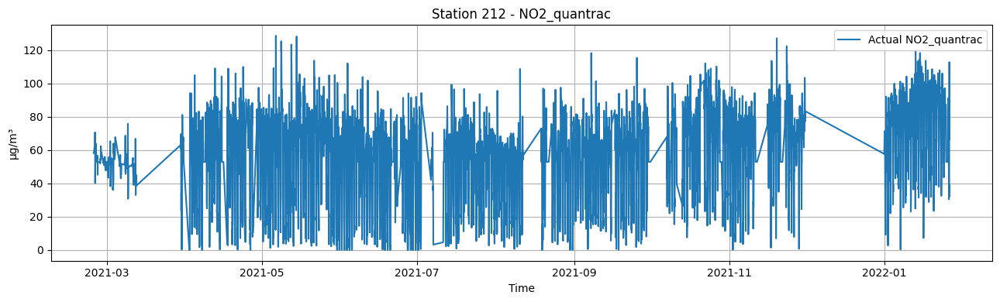

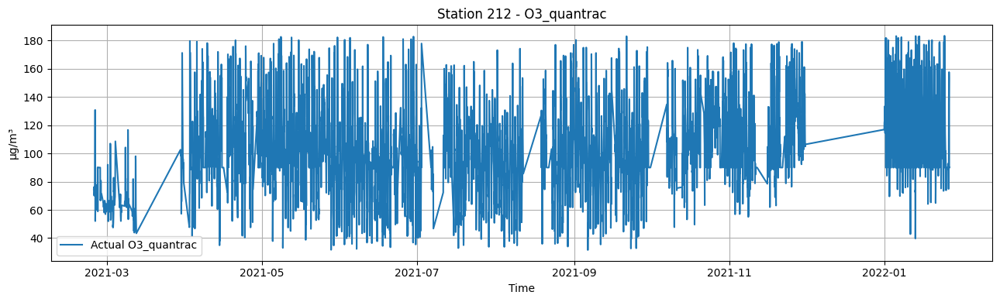

...

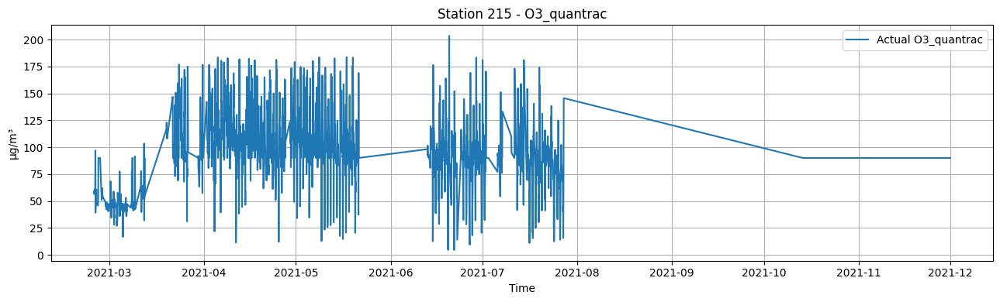

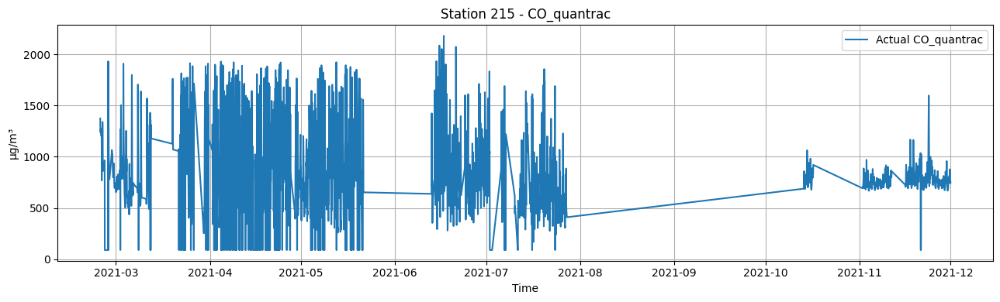

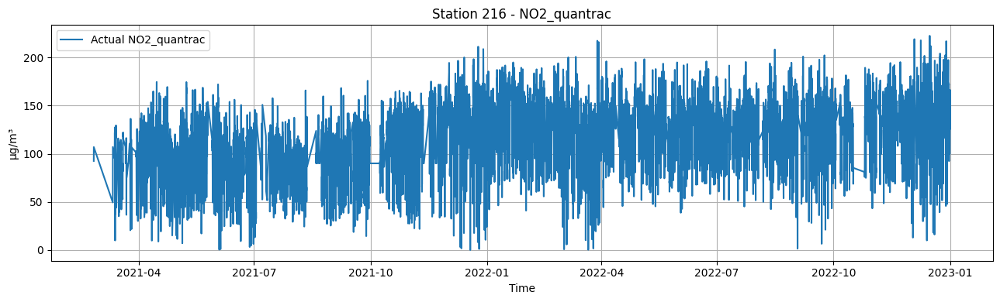

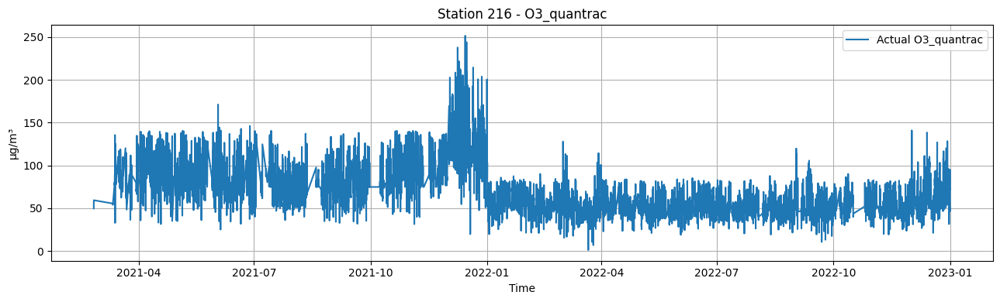

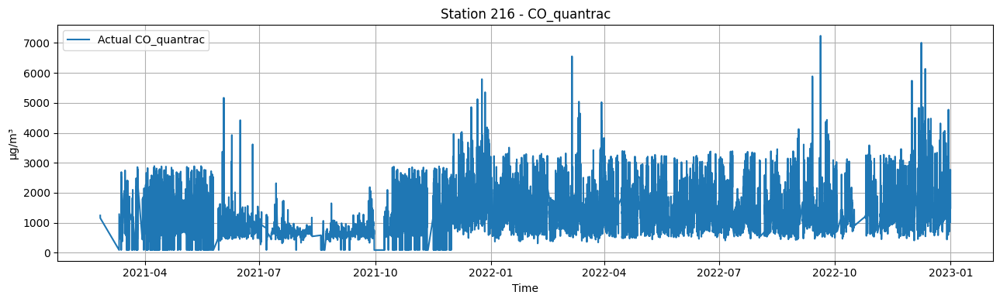

In [9]:
for station in STATION_IDS:
    df_station = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, f"Actual {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Feature engineering

### Time features

In [10]:
# Add time features and lag feature for all gases
dftestno2 = add_time_features(df_converted)
dftestno2 = add_lag_features(dftestno2, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=[3, 6, 12, 24])
dftestno2 = add_rolling_features(dftestno2, group_col="station_id", target_cols=["NO2_quantrac"], windows=[3, 6, 12, 24])
print(dftestno2.shape)
print(dftestno2.columns)
dftestno2

(38692, 43)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id', 'hour',
       'dayofweek', 'month', 'NO2_quantrac_lag3', 'NO2_quantrac_lag6',
       'NO2_quantrac_lag12', 'NO2_quantrac_lag24', 'PM25_quantrac_lag3',
       'PM25_quantrac_lag6', 'PM25_quantrac_lag12', 'PM25_quantrac_lag24',
       'O3_quantrac_lag3', 'O3_quantrac_lag6', 'O3_quantrac_lag12',
       'O3_quantrac_lag24', 'CO_quantrac_lag3', 'CO_quantrac_lag6',
       'CO_quantrac_lag12', 'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_quantrac

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,Humid_quantrac_lag12,Humid_quantrac_lag24,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,NaN,NaN,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,NaN,NaN,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,NaN,NaN,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,NaN,NaN,112.5159235333,0.1697189071,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,68.0600000000,71.9266666667,147.2034666667,18.8622115885,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,66.5483333333,72.9183333333,160.5741866667,6.5995644704,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,64.6833333333,78.1200000000,161.7145688889,4.7480395477,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,61.6400000000,82.1033333333,160.5428000000,4.9712952838,153.8731333333,14.3380635114,135.2451466667,23.8597941057,135.8343141013,22.5466882334


### Station embedding

In [11]:
test_station_to_embedding, _ = learn_station_embeddings(dftestno2, target_col="NO2_quantrac", station_col="station_id", embed_dim=4, LIGHTGBM_DIR=LIGHTGBM_DIR)
print(test_station_to_embedding)

dftestno2, _ = attach_station_embedding(dftestno2, test_station_to_embedding, station_col="station_id")
display(dftestno2)

[Embed] epoch 001 | train MSE=8945.3569 | val MSE=8836.1859
[Embed] epoch 010 | train MSE=6346.3705 | val MSE=5962.2047
[Embed] epoch 020 | train MSE=1944.6327 | val MSE=1794.4738
[Embed] epoch 030 | train MSE=1023.6253 | val MSE=1017.0699
[Embed] epoch 040 | train MSE=974.4662 | val MSE=987.2691
[Embed] epoch 050 | train MSE=974.0785 | val MSE=987.6006
{211: array([ 7.782829 , -4.09747  , -4.5961213,  3.8078797], dtype=float32), 212: array([ 3.5855365, -3.9908829, -2.4162335,  1.0250082], dtype=float32), 213: array([ 2.9658248, -3.1664917, -2.539614 ,  2.5171337], dtype=float32), 214: array([ 1.5897979, -2.4742687, -4.4660373,  2.1730874], dtype=float32), 215: array([ 2.984351 , -3.522223 , -1.998513 ,  2.4715588], dtype=float32), 216: array([ 5.107183 , -5.4918914, -6.1699085,  6.0908666], dtype=float32)}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,153.8731333333,14.3380635114,135.2451466667,23.8597941057,135.8343141013,22.5466882334,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657


## Build supervised from time-series

In [12]:
# Example
Xdummy, ydummy = build_supervised_for_horizon(dftestno2, horizon_h=1, target_col="NO2_quantrac")
print("Horizon 1h:", Xdummy.shape, ydummy.shape)
print(Xdummy.columns)
print(ydummy.columns)
display(Xdummy)
display(ydummy)

Horizon 1h: (38542, 46) (38542, 3)
Index(['date', 'station_id', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'hour', 'dayofweek', 'month',
       'NO2_quantrac_lag3', 'NO2_quantrac_lag6', 'NO2_quantrac_lag12',
       'NO2_quantrac_lag24', 'PM25_quantrac_lag3', 'PM25_quantrac_lag6',
       'PM25_quantrac_lag12', 'PM25_quantrac_lag24', 'O3_quantrac_lag3',
       'O3_quantrac_lag6', 'O3_quantrac_lag12', 'O3_quantrac_lag24',
       'CO_quantrac_lag3', 'CO_quantrac_lag6', 'CO_quantrac_lag12',
       'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_q

,date,station_id,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,hour,dayofweek,month,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-24 21:00:00,211,15.7116666700,55.9127833300,896.5540000000,27.8000000000,66.0550000000,21,2,2,...,110.9782539833,8.7910802916,108.7458061667,11.6703996987,111.2911683250,8.5276176290,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
1,2021-02-24 22:00:00,211,15.6533333300,53.4917500000,931.1250000000,27.8000000000,66.2716666700,22,2,2,...,112.9722778000,7.1361384153,108.1629089417,11.2547508374,111.2790324125,8.5256720042,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
2,2021-02-24 23:00:00,211,15.5950000000,50.6454000000,934.5630000000,27.8000000000,66.2166666700,23,2,2,...,114.2321722333,5.4976888124,106.9186978250,9.9132556170,111.2027683583,8.5237078586,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3,2021-02-25 00:00:00,211,15.1866666700,51.4960333300,1004.0870000000,27.7966666700,66.3783333300,0,3,2,...,111.8796722333,1.2625489371,109.0581658833,7.2617421674,111.1348072500,8.5177478315,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
4,2021-02-25 01:00:00,211,15.3450000000,51.6269000000,1024.5240000000,27.7800000000,66.4683333300,1,3,2,...,111.4353111167,1.4959850529,110.0305325500,6.3819593962,111.0197961375,8.5174176826,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38537,2022-12-31 18:00:00,216,36.6416666667,85.6000000000,1687.5162000000,28.1816666667,64.2983333333,18,5,12,...,118.6259066667,19.0129302674,128.6670244444,17.1541920845,136.7144485457,23.9144727000,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38538,2022-12-31 19:00:00,216,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,19,5,12,...,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38539,2022-12-31 20:00:00,216,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,20,5,12,...,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38540,2022-12-31 21:00:00,216,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,21,5,12,...,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657


,date,station_id,NO2_quantrac_t_plus_1h
0,2021-02-24 21:00:00,211,110.5361333000
1,2021-02-24 22:00:00,211,111.0693667000
2,2021-02-24 23:00:00,211,109.7206000000
3,2021-02-25 00:00:00,211,108.5600333000
4,2021-02-25 01:00:00,211,110.3479333000
...,...,...,...
38537,2022-12-31 18:00:00,216,166.1610133333
38538,2022-12-31 19:00:00,216,156.7136266667
38539,2022-12-31 20:00:00,216,158.7537600000
38540,2022-12-31 21:00:00,216,125.5152800000


## Split train/validation/test for each station

In [13]:
# Example
(X_train_dummy, y_train_dummy, meta_train_dummy,
 X_val_dummy, y_val_dummy, meta_val_dummy,
 X_test_dummy, y_test_dummy, meta_test_dummy) = train_test_validation_split(Xdummy, ydummy)
display(X_test_dummy)
display(y_test_dummy)

,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,hour,dayofweek,month,NO2_quantrac_lag3,NO2_quantrac_lag6,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
3329,26.1833333300,35.8462000004,741.5384000000,24.0700000000,81.9216666700,4,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,89.4493298596,1.9075773226,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3330,14.0833333300,20.8097354148,725.9719000000,23.6400000000,80.2966666700,5,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3331,15.4000000000,21.1161272138,738.6734000000,23.5500000000,79.6700000000,6,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3332,20.7166666700,30.0598503566,757.8498000000,23.9883333300,80.2866666700,7,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3333,21.9166666700,51.8978718504,749.9997000000,26.6766666700,72.2516666700,8,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38537,36.6416666667,85.6000000000,1687.5162000000,28.1816666667,64.2983333333,18,5,12,112.6153600000,111.9562400000,...,118.6259066667,19.0129302674,128.6670244444,17.1541920845,136.7144485457,23.9144727000,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38538,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,19,5,12,126.0488533333,99.5898933333,...,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38539,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,20,5,12,153.2924800000,108.2526133333,...,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38540,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,21,5,12,162.2690666667,112.6153600000,...,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657


,NO2_quantrac_t_plus_1h
3329,90.0000000000
3330,90.0000000000
3331,90.0000000000
3332,90.0000000000
3333,90.0000000000
...,...
38537,166.1610133333
38538,156.7136266667
38539,158.7537600000
38540,125.5152800000


# LightGBM model

## Add time and lags features

In [14]:
# Add time features and lag feature for all gases
df_time_feats = add_time_features(df_converted)
df_lag_feats = add_lag_features(df_time_feats, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=LAG_STEPS)

## Training for NO2

In [15]:
label = "NO2_quantrac"

# Add rolling features for LABEL
df_no2 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
no2_station_to_embedding, _ = learn_station_embeddings(df_no2, target_col=label, station_col="station_id", embed_dim=4, LIGHTGBM_DIR=LIGHTGBM_DIR)
df_no2, _ = attach_station_embedding(df_no2, no2_station_to_embedding, station_col="station_id")

# Print dataset
display(df_no2)

# Start running model
no2_all_metrics = []
no2_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_no2, horizon_h=h, target_col=label)
    no2_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    no2_all_metrics.append(metrics_by_station)

# Metrics table
no2_df_metrics_all = pd.concat(no2_all_metrics, ignore_index=True)
no2_df_metrics_all = no2_df_metrics_all.sort_values(["station", "horizon_h"]).reset_index(drop=True)
no2_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
no2_df_metrics_all

[Embed] epoch 001 | train MSE=8945.3569 | val MSE=8836.1859
[Embed] epoch 010 | train MSE=6346.3705 | val MSE=5962.2047
[Embed] epoch 020 | train MSE=1944.6327 | val MSE=1794.4738
[Embed] epoch 030 | train MSE=1023.6253 | val MSE=1017.0699
[Embed] epoch 040 | train MSE=974.4662 | val MSE=987.2691
[Embed] epoch 050 | train MSE=974.0785 | val MSE=987.6006


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,NO2_quantrac_roll48_mean,NO2_quantrac_roll48_std,NO2_quantrac_roll72_mean,NO2_quantrac_roll72_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,137.2270974346,24.3389891274,149.0162092153,26.2871324723,150.0269925480,33.5195438146,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,137.0636252124,24.1209076873,148.8579681042,26.1575760067,149.8578532887,33.4051994474,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,136.3835807679,23.2780210582,148.3289719931,25.7240543085,149.0230551405,32.4454992401,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,135.8343141013,22.5466882334,147.7620503264,25.1708505476,148.2789295850,31.5758393774,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657



===== Training LightGBM for horizon = 1h, target_col = NO2_quantrac =====

X.shape = (38254, 62)
y.shape = (38254, 3)

Number of features: 62

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
Humid_quantrac_lag48
Humid_quantrac_lag72
NO2_quant

,date,target
0,2022-01-02,88.7008178222
1,2022-01-03,90.0000000000
2,2022-01-04,89.9384786957
3,2022-01-05,90.0000000000
4,2022-01-06,88.2903867585
5,2022-01-07,90.0000000000
6,2022-01-08,89.5619537858
7,2022-01-09,89.3604280386
8,2022-01-10,90.0000000000
9,2022-01-11,87.7334059784


,date,target
0,2022-01-02,89.0836739398
1,2022-01-03,91.3800056133
2,2022-01-04,92.0041389268
3,2022-01-05,92.2412150551
4,2022-01-06,92.9320017011
5,2022-01-07,91.1054788792
6,2022-01-08,91.4171901429
7,2022-01-09,89.8827515603
8,2022-01-10,92.6977566972
9,2022-01-11,90.0272774839


sid = 212, grp =                     date  station_id          y_true         y_pred
8781 2021-11-19 17:00:00         212   96.4211333300  80.8925729002
8782 2021-11-19 18:00:00         212   71.0141333300  94.7963378192
8783 2021-11-19 19:00:00         212   71.1082333300  86.8174640486
8784 2021-11-19 20:00:00         212   71.2023333300  84.8266003707
8785 2021-11-19 21:00:00         212   84.1881333300  81.6948492090
...                  ...         ...             ...            ...
9643 2022-01-26 11:00:00         212   39.4906333300  30.5887143332
9644 2022-01-26 12:00:00         212   32.0881000000  34.3213045913
9645 2022-01-26 13:00:00         212   55.1739666700  38.3895844994
9646 2022-01-26 14:00:00         212  112.7631667000  44.0531370474
9647 2022-01-26 15:00:00         212   66.4261521997  93.1255125553

[867 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(

,date,target
0,2021-11-20,80.6267998571
1,2021-11-21,56.9423845343
2,2021-11-23,76.9806051246
3,2021-11-24,67.7291059379
4,2021-11-25,67.7936699283
5,2021-11-26,54.1290871168
6,2021-11-27,64.9021400388
7,2021-11-28,62.9656089087
8,2021-11-29,69.5948367342
9,2021-11-30,76.3476834750


,date,target
0,2021-11-20,71.5417570683
1,2021-11-21,60.4839154472
2,2021-11-23,69.7985508934
3,2021-11-24,62.7910616981
4,2021-11-25,64.2144692413
5,2021-11-26,63.2827616042
6,2021-11-27,64.6377887449
7,2021-11-28,62.9269414923
8,2021-11-29,65.8446334916
9,2021-11-30,68.0073316517


sid = 213, grp =                      date  station_id         y_true         y_pred
14631 2021-12-20 20:00:00         213   79.451766670  83.2408711515
14632 2021-12-20 21:00:00         213   79.294933330  85.9799948806
14633 2021-12-20 22:00:00         213   89.928233330  79.3892941153
14634 2021-12-20 23:00:00         213  102.976766700  76.6365995779
14635 2021-12-21 00:00:00         213  139.268000000  88.9007117697
...                   ...         ...            ...            ...
15506 2022-01-26 11:00:00         213   12.515300000  24.3841640666
15507 2022-01-26 12:00:00         213    8.249433333  22.2194354026
15508 2022-01-26 13:00:00         213   10.100066670  32.6915791816
15509 2022-01-26 14:00:00         213   52.727366670  42.9621717187
15510 2022-01-26 15:00:00         213   81.060428570  73.9653737853

[880 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), datetime.date(

,date,target
0,2021-12-21,71.0710407932
1,2021-12-22,74.7910255633
2,2021-12-23,52.4447122413
3,2021-12-24,60.1148074675
4,2021-12-25,69.1498324612
5,2021-12-26,63.1175085451
6,2021-12-27,70.2495448313
7,2021-12-28,83.7546399952
8,2021-12-29,69.7778303471
9,2021-12-30,46.9945102408


,date,target
0,2021-12-21,63.7541972576
1,2021-12-22,72.3868771333
2,2021-12-23,59.7233455918
3,2021-12-24,59.0268650269
4,2021-12-25,63.0734971742
5,2021-12-26,64.7239590308
6,2021-12-27,65.8151770686
7,2021-12-28,74.2970778730
8,2021-12-29,74.4051145241
9,2021-12-30,55.8386905356


sid = 214, grp =                      date  station_id          y_true          y_pred
20640 2021-11-23 16:00:00         214  121.1743860000  100.4355394413
20641 2021-11-23 17:00:00         214  125.3412000000   97.9604687894
20642 2021-11-23 18:00:00         214   74.8802630052  104.0299638091
20643 2021-11-23 19:00:00         214  132.6496333000  101.1502140343
20644 2021-11-23 20:00:00         214  123.3337333000   97.5340718673
...                   ...         ...             ...             ...
21541 2021-12-31 18:00:00         214  121.6713000000   84.2384354579
21542 2021-12-31 19:00:00         214  106.3016333000   88.1437651122
21543 2021-12-31 20:00:00         214   53.2187777800   92.5223834461
21544 2021-12-31 21:00:00         214   62.2628333300   66.0477660778
21545 2021-12-31 22:00:00         214   69.4771666700   66.5355220429

[906 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021,

,date,target
0,2021-11-24,72.2917524911
1,2021-11-25,64.5454832237
2,2021-11-26,60.9871078221
3,2021-11-27,68.8999328696
4,2021-11-28,68.1493118003
5,2021-11-29,71.4217673629
6,2021-11-30,74.2305357700
7,2021-12-01,62.9133549792
8,2021-12-02,64.5000287675
9,2021-12-03,61.9790598150


,date,target
0,2021-11-24,74.2812029985
1,2021-11-25,68.6275936343
2,2021-11-26,70.1611059143
3,2021-11-27,64.2603842214
4,2021-11-28,67.2374043358
5,2021-11-29,64.0938315613
6,2021-11-30,65.4554788295
7,2021-12-01,71.4645291723
8,2021-12-02,72.8428406315
9,2021-12-03,71.2031560013


sid = 215, grp =                      date  station_id         y_true         y_pred
24155 2021-11-07 08:00:00         215  64.6299022253  48.8394796171
24156 2021-11-07 09:00:00         215  63.8320549371  51.9217446730
24157 2021-11-07 10:00:00         215  63.4028000782  54.5981779718
24158 2021-11-07 11:00:00         215  62.4885461009  56.2231302016
24159 2021-11-07 12:00:00         215  67.0863711014  56.8979684057
...                   ...         ...            ...            ...
24611 2021-11-30 18:00:00         215  67.9829827990  58.7266404492
24612 2021-11-30 19:00:00         215  67.3664108942  61.3003489001
24613 2021-11-30 20:00:00         215  66.0977312824  60.5107526949
24614 2021-11-30 21:00:00         215  66.7957677654  63.0191385825
24615 2021-11-30 22:00:00         215  67.7804241541  64.2597264206

[461 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(202

,date,target
0,2021-11-07,65.0532398747
1,2021-11-08,65.4881208563
2,2021-11-09,63.8976724264
3,2021-11-10,65.2324574804
4,2021-11-11,63.0959230662
5,2021-11-16,64.9591587684
6,2021-11-17,64.1010187020
7,2021-11-18,63.3239395393
8,2021-11-19,63.5505831102
9,2021-11-20,64.1393349319


,date,target
0,2021-11-07,58.0634302940
1,2021-11-08,61.6414537270
2,2021-11-09,59.2941533839
3,2021-11-10,60.9807178822
4,2021-11-11,59.2937980319
5,2021-11-16,60.9867340435
6,2021-11-17,59.5517639315
7,2021-11-18,60.5729524393
8,2021-11-19,61.0442071195
9,2021-11-20,60.3965374942


sid = 216, grp =                      date  station_id          y_true          y_pred
36208 2022-09-20 19:00:00         216  141.8049600000  144.6028386048
36209 2022-09-20 20:00:00         216  168.6091733333  140.2405813639
36210 2022-09-20 21:00:00         216  154.4851733333  142.5040199102
36211 2022-09-20 22:00:00         216  136.0612000000  148.3619488341
36212 2022-09-20 23:00:00         216  124.6533538462  138.1096303407
...                   ...         ...             ...             ...
38249 2022-12-31 18:00:00         216  166.1610133333  153.6840731137
38250 2022-12-31 19:00:00         216  156.7136266667  154.0579847172
38251 2022-12-31 20:00:00         216  158.7537600000  156.6825523534
38252 2022-12-31 21:00:00         216  125.5152800000  156.6971952029
38253 2022-12-31 22:00:00         216  127.6495733333  147.1280323745

[2046 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(2022, 9

,date,target
0,2022-09-21,116.7549208176
1,2022-09-22,124.7667622851
2,2022-09-23,124.1672665055
3,2022-09-24,118.7239599361
4,2022-09-25,131.5193690521
...,...,...
82,2022-12-27,161.2478151337
83,2022-12-28,157.7714464888
84,2022-12-29,149.2760703243
85,2022-12-30,157.1997776627


,date,target
0,2022-09-21,120.5609501699
1,2022-09-22,121.4131907596
2,2022-09-23,123.4479222787
3,2022-09-24,120.7551016098
4,2022-09-25,125.3976661651
...,...,...
82,2022-12-27,152.9049787070
83,2022-12-28,150.2526743174
84,2022-12-29,140.2461891023
85,2022-12-30,145.7178894145


Overall test metrics: {'rmse': 15.2, 'mae': 11.12, 'mape': 45.32, 'mnbe': -32.7, 'r': 0.93, 'n_samples': 5741}

===== Training LightGBM for horizon = 24h, target_col = NO2_quantrac =====

X.shape = (38116, 62)
y.shape = (38116, 3)

Number of features: 62

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3
H

,date,target
0,2022-01-02,90.0000000000
1,2022-01-03,89.9384786957
2,2022-01-04,90.0000000000
3,2022-01-05,88.2903867585
4,2022-01-06,90.0000000000
5,2022-01-07,89.5619537858
6,2022-01-08,89.3604280386
7,2022-01-09,90.0000000000
8,2022-01-10,87.7334059784
9,2022-01-11,90.0000000000


,date,target
0,2022-01-02,88.7053097080
1,2022-01-03,91.3631440940
2,2022-01-04,91.5357559353
3,2022-01-05,92.1187620117
4,2022-01-06,91.7611641817
5,2022-01-07,90.9324587854
6,2022-01-08,89.2102209268
7,2022-01-09,89.9557447425
8,2022-01-10,91.7691551727
9,2022-01-11,91.5854532355


sid = 212, grp =                     date  station_id          y_true         y_pred
8738 2021-11-18 21:00:00         212   71.2023333300  77.7761766915
8739 2021-11-18 22:00:00         212   84.1881333300  76.8612501957
8740 2021-11-18 23:00:00         212   84.2195000000  75.9213989483
8741 2021-11-19 00:00:00         212   85.8192000000  74.3182405509
8742 2021-11-19 01:00:00         212   81.9318965500  73.2223254578
...                  ...         ...             ...            ...
9597 2022-01-25 12:00:00         212   39.4906333300  43.0830444154
9598 2022-01-25 13:00:00         212   32.0881000000  49.4996943749
9599 2022-01-25 14:00:00         212   55.1739666700  54.8284351608
9600 2022-01-25 15:00:00         212  112.7631667000  62.4633003261
9601 2022-01-25 16:00:00         212   66.4261521997  70.3835580549

[864 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(

,date,target
0,2021-11-19,80.3810943017
1,2021-11-20,57.7121748118
2,2021-11-21,74.6385606804
3,2021-11-23,67.5160739937
4,2021-11-24,68.7555810392
5,2021-11-25,54.3983176726
6,2021-11-26,64.1820136496
7,2021-11-27,63.3772964087
8,2021-11-28,69.6497284008
9,2021-11-29,76.7410737529


,date,target
0,2021-11-19,61.6183423404
1,2021-11-20,61.5202508217
2,2021-11-21,66.8189944872
3,2021-11-23,61.9729229950
4,2021-11-24,62.4097200552
5,2021-11-25,62.8630281750
6,2021-11-26,61.6430956285
7,2021-11-27,56.2611111903
8,2021-11-28,57.8522476931
9,2021-11-29,62.5078044665


sid = 213, grp =                      date  station_id         y_true         y_pred
14566 2021-12-20 01:00:00         213  139.268000000  62.6655387243
14567 2021-12-20 02:00:00         213   57.480745760  67.6978398415
14568 2021-12-20 03:00:00         213   80.267300000  70.8829843103
14569 2021-12-20 04:00:00         213   61.259100000  73.0698910913
14570 2021-12-20 05:00:00         213   93.786333330  74.1109467762
...                   ...         ...            ...            ...
15437 2022-01-25 12:00:00         213   12.515300000  37.0651657218
15438 2022-01-25 13:00:00         213    8.249433333  37.0144651584
15439 2022-01-25 14:00:00         213   10.100066670  48.7156176472
15440 2022-01-25 15:00:00         213   52.727366670  61.3169478210
15441 2022-01-25 16:00:00         213   81.060428570  74.6214780493

[876 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), datetime.date(

,date,target
0,2021-12-20,70.4475454655
1,2021-12-21,74.8681352854
2,2021-12-22,53.4589011300
3,2021-12-23,61.3699786911
4,2021-12-24,66.5046312791
5,2021-12-25,64.0624293772
6,2021-12-26,70.7675860188
7,2021-12-27,83.7546399952
8,2021-12-28,70.4127809417
9,2021-12-29,47.8636282967


,date,target
0,2021-12-20,56.3976871142
1,2021-12-21,62.2638222660
2,2021-12-22,67.0518800822
3,2021-12-23,62.2263357136
4,2021-12-24,57.2381881370
5,2021-12-25,61.2041128018
6,2021-12-26,64.1348964042
7,2021-12-27,65.5143491049
8,2021-12-28,69.1942153687
9,2021-12-29,72.1452152045


sid = 214, grp =                      date  station_id        y_true         y_pred
20552 2021-11-22 21:00:00         214  123.33373330  81.1609563900
20553 2021-11-22 22:00:00         214  104.43324530  77.8484459414
20554 2021-11-22 23:00:00         214   88.58842857  78.5586779613
20555 2021-11-23 00:00:00         214   77.38156667  72.4582272704
20556 2021-11-23 01:00:00         214   78.76170000  73.7255285881
...                   ...         ...           ...            ...
21449 2021-12-30 19:00:00         214  121.67130000  76.7228899057
21450 2021-12-30 20:00:00         214  106.30163330  77.2133875320
21451 2021-12-30 21:00:00         214   53.21877778  72.0964346553
21452 2021-12-30 22:00:00         214   62.26283333  69.2825558420
21453 2021-12-30 23:00:00         214   69.47716667  68.8170575298

[902 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26

,date,target
0,2021-11-23,71.5062788803
1,2021-11-24,65.4799485013
2,2021-11-25,61.5869953221
3,2021-11-26,68.1745787029
4,2021-11-27,68.0996479116
5,2021-11-28,71.9641493075
6,2021-11-29,73.3548829921
7,2021-11-30,63.5981938679
8,2021-12-01,64.0012786608
9,2021-12-02,62.3183626996


,date,target
0,2021-11-23,65.4055896751
1,2021-11-24,66.8914035529
2,2021-11-25,64.4345627946
3,2021-11-26,63.4698009506
4,2021-11-27,59.1937668681
5,2021-11-28,60.0182175176
6,2021-11-29,65.0413596345
7,2021-11-30,66.8523925560
8,2021-12-01,62.8142365786
9,2021-12-02,60.4330668990


sid = 215, grp =                      date  station_id         y_true         y_pred
24043 2021-11-06 12:00:00         215  62.4885461009  59.8433362173
24044 2021-11-06 13:00:00         215  67.0863711014  55.9091170370
24045 2021-11-06 14:00:00         215  66.7117714249  57.0816862175
24046 2021-11-06 15:00:00         215  65.9195778251  58.3201568975
24047 2021-11-06 16:00:00         215  64.5835429055  59.4704769453
...                   ...         ...            ...            ...
24496 2021-11-29 19:00:00         215  67.9829827990  72.5964617565
24497 2021-11-29 20:00:00         215  67.3664108942  72.5211187983
24498 2021-11-29 21:00:00         215  66.0977312824  72.8450103650
24499 2021-11-29 22:00:00         215  66.7957677654  72.5974892337
24500 2021-11-29 23:00:00         215  67.7804241541  72.4419781934

[458 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021

,date,target
0,2021-11-06,65.3056135835
1,2021-11-07,65.4730827661
2,2021-11-08,63.9807921809
3,2021-11-09,65.1698627819
4,2021-11-10,63.5588413339
5,2021-11-11,65.3775538865
6,2021-11-16,64.1816792372
7,2021-11-17,63.7908146387
8,2021-11-18,62.9755479676
9,2021-11-19,64.1848282632


,date,target
0,2021-11-06,65.2391562300
1,2021-11-07,64.1986726565
2,2021-11-08,67.8747694225
3,2021-11-09,64.1724078444
4,2021-11-10,65.9814008876
5,2021-11-11,62.0068513190
6,2021-11-16,64.8981591300
7,2021-11-17,63.7549568165
8,2021-11-18,63.0769696463
9,2021-11-19,62.8364089693


sid = 216, grp =                      date  station_id          y_true          y_pred
36073 2022-09-19 23:00:00         216  136.0612000000  143.0375680489
36074 2022-09-20 00:00:00         216  124.6533538462  137.8743148076
36075 2022-09-20 01:00:00         216  125.9967396226  136.4178178328
36076 2022-09-20 02:00:00         216  126.2057866667  136.8623237627
36077 2022-09-20 03:00:00         216  129.0933600000  137.5882762999
...                   ...         ...             ...             ...
38111 2022-12-30 19:00:00         216  166.1610133333  162.8770946276
38112 2022-12-30 20:00:00         216  156.7136266667  158.4938988982
38113 2022-12-30 21:00:00         216  158.7537600000  161.8224007563
38114 2022-12-30 22:00:00         216  125.5152800000  165.6987501428
38115 2022-12-30 23:00:00         216  127.6495733333  162.8089942097

[2043 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9

,date,target
0,2022-09-20,116.7072372279
1,2022-09-21,124.9250033962
2,2022-09-22,123.3289809500
3,2022-09-23,119.5753232695
4,2022-09-24,130.4653001632
...,...,...
82,2022-12-26,162.6379829114
83,2022-12-27,157.5622020444
84,2022-12-28,148.9517414354
85,2022-12-29,158.3650076627


,date,target
0,2022-09-20,130.4503869432
1,2022-09-21,126.7337967784
2,2022-09-22,125.4515391394
3,2022-09-23,124.5734023277
4,2022-09-24,124.4994858515
...,...,...
82,2022-12-26,139.4580952691
83,2022-12-27,141.6718135613
84,2022-12-28,141.1387556016
85,2022-12-29,139.0118209559


Overall test metrics: {'rmse': 19.49, 'mae': 14.21, 'mape': 61.64, 'mnbe': -44.65, 'r': 0.89, 'n_samples': 5720}

===== Training LightGBM for horizon = 48h, target_col = NO2_quantrac =====

X.shape = (37972, 62)
y.shape = (37972, 3)

Number of features: 62

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3

,date,target
0,2022-01-01,90.0000000000
1,2022-01-02,89.9384786957
2,2022-01-03,90.0000000000
3,2022-01-04,88.2903867585
4,2022-01-05,90.0000000000
5,2022-01-06,89.5619537858
6,2022-01-07,89.3604280386
7,2022-01-08,90.0000000000
8,2022-01-09,87.7334059784
9,2022-01-10,90.0000000000


,date,target
0,2022-01-01,86.4690104488
1,2022-01-02,91.2979079561
2,2022-01-03,88.6890709773
3,2022-01-04,89.7580375413
4,2022-01-05,90.7178918251
5,2022-01-06,88.4744168867
6,2022-01-07,88.3350731208
7,2022-01-08,88.8941259527
8,2022-01-09,90.7476065216
9,2022-01-10,89.9987272520


sid = 212, grp =                     date  station_id          y_true         y_pred
8694 2021-11-18 01:00:00         212   81.9318965500  72.6986928905
8695 2021-11-18 02:00:00         212   77.5384000000  73.4347225298
8696 2021-11-18 03:00:00         212   79.7340666700  72.5763087582
8697 2021-11-18 04:00:00         212   80.7378000000  73.8715653815
8698 2021-11-18 05:00:00         212   74.1821666700  74.0527769630
...                  ...         ...             ...            ...
9549 2022-01-24 12:00:00         212   39.4906333300  41.8312347274
9550 2022-01-24 13:00:00         212   32.0881000000  42.6749898243
9551 2022-01-24 14:00:00         212   55.1739666700  48.0057284083
9552 2022-01-24 15:00:00         212  112.7631667000  58.4666635268
9553 2022-01-24 16:00:00         212   66.4261521997  67.3806372233

[860 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(

,date,target
0,2021-11-18,80.1446549235
1,2021-11-19,57.7121748118
2,2021-11-20,74.6385606804
3,2021-11-21,67.5291434379
4,2021-11-23,68.7555810392
5,2021-11-24,54.3983176726
6,2021-11-25,64.1820136496
7,2021-11-26,63.3772964087
8,2021-11-27,69.6497284008
9,2021-11-28,76.7410737529


,date,target
0,2021-11-18,61.5988047546
1,2021-11-19,61.4360771128
2,2021-11-20,62.4779850374
3,2021-11-21,66.7149785033
4,2021-11-23,61.3976184368
5,2021-11-24,61.5349383262
6,2021-11-25,62.6052701179
7,2021-11-26,58.9356024959
8,2021-11-27,56.4215325607
9,2021-11-28,59.9929564573


sid = 213, grp =                      date  station_id         y_true         y_pred
14497 2021-12-19 04:00:00         213   61.259100000  65.4411470867
14498 2021-12-19 05:00:00         213   93.786333330  63.5820514680
14499 2021-12-19 06:00:00         213   80.235933330  69.2340370642
14500 2021-12-19 07:00:00         213   90.837866670  62.9245005894
14501 2021-12-19 08:00:00         213  100.937933300  53.8105656597
...                   ...         ...            ...            ...
15365 2022-01-24 12:00:00         213   12.515300000  36.4517257217
15366 2022-01-24 13:00:00         213    8.249433333  42.6805271782
15367 2022-01-24 14:00:00         213   10.100066670  41.4555028970
15368 2022-01-24 15:00:00         213   52.727366670  48.5547615363
15369 2022-01-24 16:00:00         213   81.060428570  68.5506407578

[873 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(

,date,target
0,2021-12-19,67.1638749973
1,2021-12-20,74.8681352854
2,2021-12-21,53.4589011300
3,2021-12-22,61.3699786911
4,2021-12-23,68.9983155121
5,2021-12-24,61.1200282229
6,2021-12-25,70.7675860188
7,2021-12-26,84.9844833871
8,2021-12-27,67.8868281274
9,2021-12-28,47.5457874978


,date,target
0,2021-12-19,54.9915174556
1,2021-12-20,54.2783341013
2,2021-12-21,61.8271131096
3,2021-12-22,66.0374498801
4,2021-12-23,62.9015363777
5,2021-12-24,59.8149897195
6,2021-12-25,60.1464032643
7,2021-12-26,63.2189034566
8,2021-12-27,63.2174253401
9,2021-12-28,66.3828104661


sid = 214, grp =                      date  station_id        y_true         y_pred
20459 2021-11-22 00:00:00         214   77.38156667  67.6646459142
20460 2021-11-22 01:00:00         214   78.76170000  68.8757823581
20461 2021-11-22 02:00:00         214   90.58693333  69.1881419550
20462 2021-11-22 03:00:00         214   93.71591837  64.1245437497
20463 2021-11-22 04:00:00         214   89.25145763  64.0168691100
...                   ...         ...           ...            ...
21353 2021-12-29 19:00:00         214  121.67130000  75.3045980541
21354 2021-12-29 20:00:00         214  106.30163330  77.2791199605
21355 2021-12-29 21:00:00         214   53.21877778  77.1151114842
21356 2021-12-29 22:00:00         214   62.26283333  74.9754603822
21357 2021-12-29 23:00:00         214   69.47716667  72.1140771084

[899 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26

,date,target
0,2021-11-22,71.5062788803
1,2021-11-23,65.4799485013
2,2021-11-24,61.5869953221
3,2021-11-25,68.1745787029
4,2021-11-26,68.0996479116
5,2021-11-27,71.9641493075
6,2021-11-28,73.3548829921
7,2021-11-29,63.5981938679
8,2021-11-30,64.0012786608
9,2021-12-01,62.3183626996


,date,target
0,2021-11-22,61.5263343075
1,2021-11-23,62.4499794410
2,2021-11-24,63.6602772370
3,2021-11-25,62.1915789310
4,2021-11-26,59.6527692708
5,2021-11-27,56.5678037814
6,2021-11-28,61.3542286905
7,2021-11-29,64.3739390206
8,2021-11-30,65.0725377911
9,2021-12-01,63.0004122056


sid = 215, grp =                      date  station_id         y_true         y_pred
23927 2021-11-05 16:00:00         215  64.5835429055  63.8377642101
23928 2021-11-05 17:00:00         215  65.2590611496  70.2758763302
23929 2021-11-05 18:00:00         215  66.3112102200  70.5379414237
23930 2021-11-05 19:00:00         215  65.4928432862  70.2121569679
23931 2021-11-05 20:00:00         215  65.1717646690  70.1160644609
...                   ...         ...            ...            ...
24376 2021-11-28 19:00:00         215  67.9829827990  70.9597943298
24377 2021-11-28 20:00:00         215  67.3664108942  70.9615390800
24378 2021-11-28 21:00:00         215  66.0977312824  70.6545442830
24379 2021-11-28 22:00:00         215  66.7957677654  70.3140667805
24380 2021-11-28 23:00:00         215  67.7804241541  70.3129472390

[454 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021

,date,target
0,2021-11-06,65.4730827661
1,2021-11-07,63.9807921809
2,2021-11-08,65.1698627819
3,2021-11-09,63.5588413339
4,2021-11-10,64.7295522778
5,2021-11-11,64.5009570216
6,2021-11-16,63.7908146387
7,2021-11-17,62.9755479676
8,2021-11-18,64.1848282632
9,2021-11-19,63.0263038151


,date,target
0,2021-11-06,63.2970283190
1,2021-11-07,64.0353772046
2,2021-11-08,64.6328395464
3,2021-11-09,63.2242948751
4,2021-11-10,64.3117880439
5,2021-11-11,59.7414618883
6,2021-11-16,63.7992102214
7,2021-11-17,62.3784051997
8,2021-11-18,62.2142165116
9,2021-11-19,62.0095249807


sid = 216, grp =                      date  station_id          y_true          y_pred
35933 2022-09-19 03:00:00         216  129.0933600000  132.9642609603
35934 2022-09-19 04:00:00         216  128.4028533333  133.4411201925
35935 2022-09-19 05:00:00         216  129.5013866667  132.0722714432
35936 2022-09-19 06:00:00         216  128.4028533333  134.6242599756
35937 2022-09-19 07:00:00         216  128.0576000000  137.2049687255
...                   ...         ...             ...             ...
37967 2022-12-29 19:00:00         216  166.1610133333  161.0204235444
37968 2022-12-29 20:00:00         216  156.7136266667  157.8336836620
37969 2022-12-29 21:00:00         216  158.7537600000  158.1472620187
37970 2022-12-29 22:00:00         216  125.5152800000  158.0709715465
37971 2022-12-29 23:00:00         216  127.6495733333  157.6523982143

[2039 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9

,date,target
0,2022-09-19,115.4341815873
1,2022-09-20,124.9250033962
2,2022-09-21,123.3289809500
3,2022-09-22,119.5753232695
4,2022-09-23,130.4653001632
...,...,...
82,2022-12-25,162.6379829114
83,2022-12-26,157.5622020444
84,2022-12-27,148.9517414354
85,2022-12-28,158.3650076627


,date,target
0,2022-09-19,126.6513490142
1,2022-09-20,126.6976300527
2,2022-09-21,126.8498241584
3,2022-09-22,128.0419953353
4,2022-09-23,123.4107555142
...,...,...
82,2022-12-25,135.2413910948
83,2022-12-26,133.6636810989
84,2022-12-27,137.8097190714
85,2022-12-28,135.8727735197


Overall test metrics: {'rmse': 21.31, 'mae': 15.71, 'mape': 87.95, 'mnbe': -68.73, 'r': 0.87, 'n_samples': 5699}

===== Training LightGBM for horizon = 72h, target_col = NO2_quantrac =====

X.shape = (37828, 62)
y.shape = (37828, 3)

Number of features: 62

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3

,date,target
0,2021-11-30,90.0000000000
1,2022-01-01,89.9384786957
2,2022-01-02,90.0000000000
3,2022-01-03,88.2903867585
4,2022-01-04,90.0000000000
5,2022-01-05,89.5619537858
6,2022-01-06,89.3604280386
7,2022-01-07,90.0000000000
8,2022-01-08,87.7334059784
9,2022-01-09,90.0000000000


,date,target
0,2021-11-30,90.5808021829
1,2022-01-01,86.2299087780
2,2022-01-02,85.2001047009
3,2022-01-03,89.7799459160
4,2022-01-04,90.5391273919
5,2022-01-05,91.3795091715
6,2022-01-06,89.1064355324
7,2022-01-07,90.6852066861
8,2022-01-08,90.9983148329
9,2022-01-09,90.2885419032


sid = 212, grp =                     date  station_id          y_true         y_pred
8649 2021-11-17 04:00:00         212   80.7378000000  68.2317010205
8650 2021-11-17 05:00:00         212   74.1821666700  69.5435819791
8651 2021-11-17 06:00:00         212   84.2195000000  70.9569082303
8652 2021-11-17 07:00:00         212   83.9685666700  65.7778122326
8653 2021-11-17 08:00:00         212   96.5779666700  47.2077062618
...                  ...         ...             ...            ...
9501 2022-01-23 12:00:00         212   39.4906333300  41.8398391194
9502 2022-01-23 13:00:00         212   32.0881000000  42.7434627451
9503 2022-01-23 14:00:00         212   55.1739666700  49.9912523897
9504 2022-01-23 15:00:00         212  112.7631667000  50.7853101563
9505 2022-01-23 16:00:00         212   66.4261521997  60.1147419655

[857 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(

,date,target
0,2021-11-17,80.2061350010
1,2021-11-18,57.7121748118
2,2021-11-19,74.6385606804
3,2021-11-20,67.5291434379
4,2021-11-21,72.3170046504
5,2021-11-23,54.3983176726
6,2021-11-24,64.1820136496
7,2021-11-25,63.3772964087
8,2021-11-26,69.6497284008
9,2021-11-27,76.7410737529


,date,target
0,2021-11-17,59.3255906103
1,2021-11-18,60.4251140088
2,2021-11-19,59.9798700740
3,2021-11-20,62.0834050471
4,2021-11-21,60.9323628230
5,2021-11-23,59.0384808115
6,2021-11-24,61.6092309458
7,2021-11-25,60.2070182282
8,2021-11-26,58.9403810324
9,2021-11-27,56.0544822433


sid = 213, grp =                      date  station_id         y_true         y_pred
14429 2021-12-18 08:00:00         213  100.937933300  48.8560589447
14430 2021-12-18 09:00:00         213   62.231466670  53.5127953793
14431 2021-12-18 10:00:00         213   16.498866670  42.1682741355
14432 2021-12-18 11:00:00         213   18.820000000  51.0477857218
14433 2021-12-18 12:00:00         213   14.209100000  37.5938256799
...                   ...         ...            ...            ...
15293 2022-01-23 12:00:00         213   12.515300000  36.5338211801
15294 2022-01-23 13:00:00         213    8.249433333  34.4301250833
15295 2022-01-23 14:00:00         213   10.100066670  39.8764398302
15296 2022-01-23 15:00:00         213   52.727366670  52.8527230386
15297 2022-01-23 16:00:00         213   81.060428570  61.7981633966

[869 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(

,date,target
0,2021-12-18,63.5723916636
1,2021-12-19,74.8681352854
2,2021-12-20,53.4589011300
3,2021-12-21,61.3699786911
4,2021-12-22,68.9983155121
5,2021-12-23,63.3620622172
6,2021-12-24,69.1987814609
7,2021-12-25,84.9844833871
8,2021-12-26,67.2113458821
9,2021-12-27,46.7909996322


,date,target
0,2021-12-18,57.3084455342
1,2021-12-19,52.2349467360
2,2021-12-20,57.1980924903
3,2021-12-21,59.0877601645
4,2021-12-22,64.3604338408
5,2021-12-23,61.7238399784
6,2021-12-24,60.4013781506
7,2021-12-25,62.2272330482
8,2021-12-26,61.6954073972
9,2021-12-27,60.6371957020


sid = 214, grp =                      date  station_id        y_true         y_pred
20367 2021-11-21 04:00:00         214   89.25145763  70.9108852263
20368 2021-11-21 05:00:00         214   78.88716667  69.2402699875
20369 2021-11-21 06:00:00         214   76.00143333  65.5922688669
20370 2021-11-21 07:00:00         214   78.82443333  59.2356069987
20371 2021-11-21 08:00:00         214   63.54886667  42.0099915756
...                   ...         ...           ...            ...
21257 2021-12-28 19:00:00         214  121.67130000  71.9232487370
21258 2021-12-28 20:00:00         214  106.30163330  75.7158090284
21259 2021-12-28 21:00:00         214   53.21877778  75.4472631656
21260 2021-12-28 22:00:00         214   62.26283333  75.3608881914
21261 2021-12-28 23:00:00         214   69.47716667  75.5089105113

[895 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25

,date,target
0,2021-11-21,68.7852287379
1,2021-11-22,65.4799485013
2,2021-11-23,61.5869953221
3,2021-11-24,68.1745787029
4,2021-11-25,68.0996479116
5,2021-11-26,71.9641493075
6,2021-11-27,73.3548829921
7,2021-11-28,63.5981938679
8,2021-11-29,64.0012786608
9,2021-11-30,62.3183626996


,date,target
0,2021-11-21,58.5234163055
1,2021-11-22,59.5751548480
2,2021-11-23,62.7539148701
3,2021-11-24,62.2529780670
4,2021-11-25,60.1479284499
5,2021-11-26,59.7872078052
6,2021-11-27,56.4052311924
7,2021-11-28,57.6154610802
8,2021-11-29,59.7154602327
9,2021-11-30,60.4305567761


sid = 215, grp =                      date  station_id         y_true         y_pred
23811 2021-11-04 20:00:00         215  65.1717646690  67.6037284001
23812 2021-11-04 21:00:00         215  64.6708066355  66.6734723689
23813 2021-11-04 22:00:00         215  64.8336916160  67.6037284001
23814 2021-11-04 23:00:00         215  65.1381760680  67.6037284001
23815 2021-11-05 00:00:00         215  65.3197177519  64.1210990519
...                   ...         ...            ...            ...
24256 2021-11-27 19:00:00         215  67.9829827990  66.9078574393
24257 2021-11-27 20:00:00         215  67.3664108942  66.6783370411
24258 2021-11-27 21:00:00         215  66.0977312824  66.5976132899
24259 2021-11-27 22:00:00         215  66.7957677654  66.4673728579
24260 2021-11-27 23:00:00         215  67.7804241541  66.4673728579

[450 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 4), datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021

,date,target
0,2021-11-05,65.4730827661
1,2021-11-06,63.9807921809
2,2021-11-07,65.1698627819
3,2021-11-08,63.5588413339
4,2021-11-09,64.7295522778
5,2021-11-10,63.5730986659
6,2021-11-11,64.8493025780
7,2021-11-16,62.9755479676
8,2021-11-17,64.1848282632
9,2021-11-18,63.0263038151


,date,target
0,2021-11-05,61.0038378555
1,2021-11-06,61.8462400171
2,2021-11-07,61.1310905381
3,2021-11-08,62.0143873862
4,2021-11-09,61.6354953915
5,2021-11-10,61.4731103266
6,2021-11-11,58.7751349956
7,2021-11-16,61.8072469027
8,2021-11-17,61.2292936040
9,2021-11-18,60.7939277463


sid = 216, grp =                      date  station_id          y_true          y_pred
35792 2022-09-18 06:00:00         216  128.4028533333  130.4919563711
35793 2022-09-18 07:00:00         216  128.0576000000  130.6813289601
35794 2022-09-18 08:00:00         216  125.0130933333  132.1111737254
35795 2022-09-18 09:00:00         216  115.7854133333  120.1408096549
35796 2022-09-18 10:00:00         216  108.1898400000  101.7191293806
...                   ...         ...             ...             ...
37823 2022-12-28 19:00:00         216  166.1610133333  149.2152117869
37824 2022-12-28 20:00:00         216  156.7136266667  152.1803669993
37825 2022-12-28 21:00:00         216  158.7537600000  154.6749311990
37826 2022-12-28 22:00:00         216  125.5152800000  154.5651780516
37827 2022-12-28 23:00:00         216  127.6495733333  153.8861421360

[2036 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9

,date,target
0,2022-09-18,113.1733451852
1,2022-09-19,124.9250033962
2,2022-09-20,123.3289809500
3,2022-09-21,119.5753232695
4,2022-09-22,130.4653001632
...,...,...
82,2022-12-24,162.6379829114
83,2022-12-25,157.5622020444
84,2022-12-26,148.9517414354
85,2022-12-27,158.3650076627


,date,target
0,2022-09-18,121.6864455502
1,2022-09-19,124.1058556872
2,2022-09-20,124.3054657036
3,2022-09-21,123.4981553043
4,2022-09-22,123.6190728575
...,...,...
82,2022-12-24,132.5613975658
83,2022-12-25,126.0769205784
84,2022-12-26,127.3408411982
85,2022-12-27,129.6507093770


Overall test metrics: {'rmse': 22.85, 'mae': 16.96, 'mape': 89.19, 'mnbe': -67.35, 'r': 0.85, 'n_samples': 5677}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,5.63,4.50,5.13,-2.12,0.36,581,-2.00
1,211,24,5.35,4.27,4.92,-1.81,0.21,577,-1.67
2,211,48,4.67,3.08,3.60,-0.18,0.18,574,0.01
3,211,72,4.63,3.20,3.75,-0.57,0.14,570,-0.41
4,212,1,13.03,9.90,30.09,-13.06,0.84,867,4.37
5,212,24,16.73,13.59,42.33,-15.64,0.77,864,9.32
6,212,48,19.76,16.52,47.02,-15.40,0.68,860,12.41
7,212,72,21.67,18.28,51.61,-15.36,0.67,857,16.40
8,213,1,18.07,14.17,187.84,-169.19,0.83,880,-2.82
9,213,24,22.72,17.95,274.20,-252.19,0.72,876,-5.40


station_id = 211
hour = 1
X_test_sid.shape: (581, 60)
y_test_sid.shape: (581, 1)
y_pred_sid.shape: (581,)


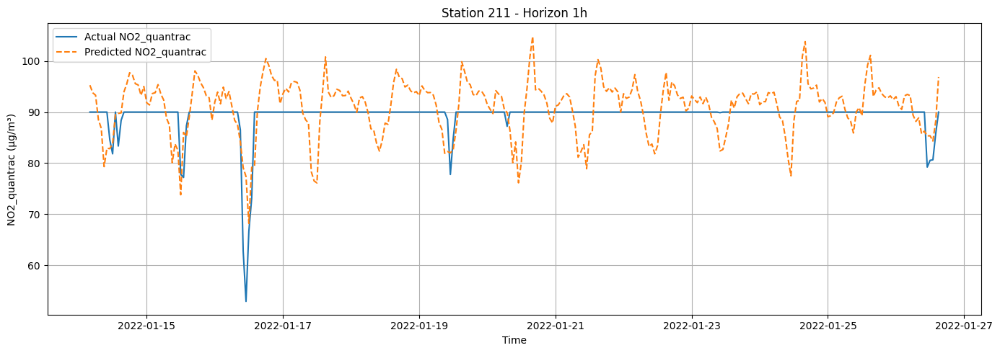

hour = 24
X_test_sid.shape: (577, 60)
y_test_sid.shape: (577, 1)
y_pred_sid.shape: (577,)


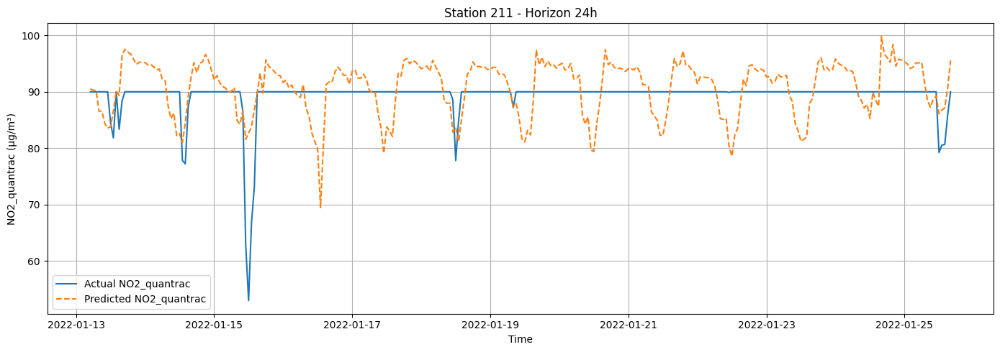

hour = 48
X_test_sid.shape: (574, 60)
y_test_sid.shape: (574, 1)
y_pred_sid.shape: (574,)


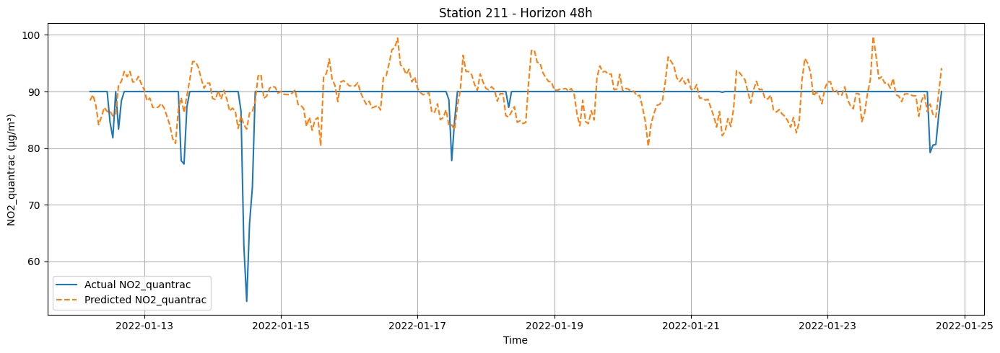

hour = 72
X_test_sid.shape: (570, 60)
y_test_sid.shape: (570, 1)
y_pred_sid.shape: (570,)


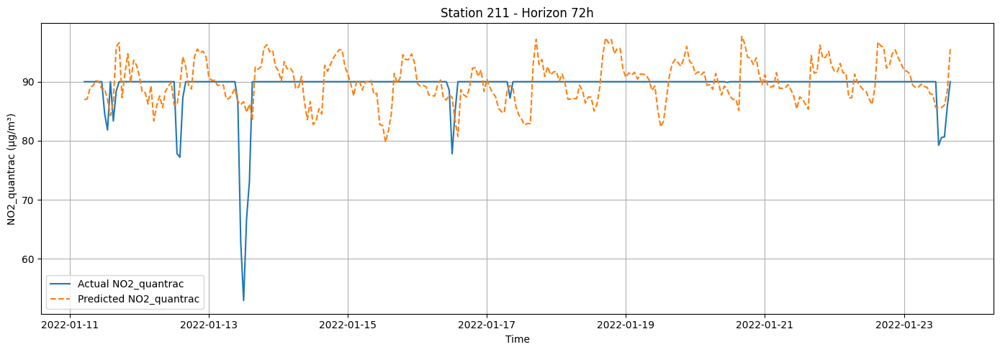

station_id = 212
hour = 1
X_test_sid.shape: (867, 60)
y_test_sid.shape: (867, 1)
y_pred_sid.shape: (867,)


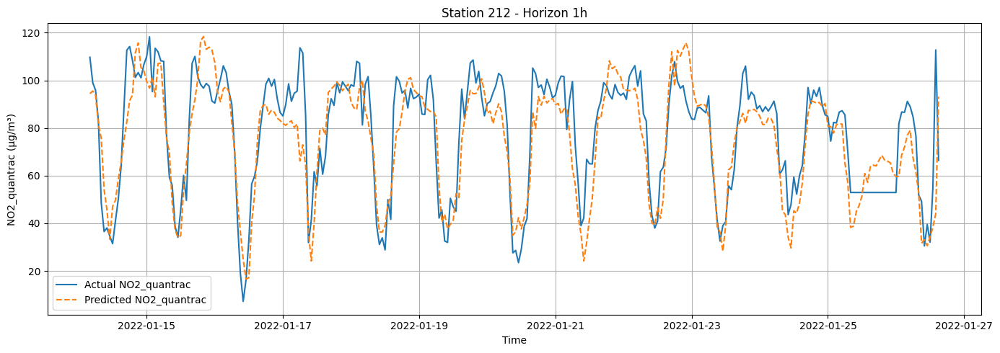

hour = 24
X_test_sid.shape: (864, 60)
y_test_sid.shape: (864, 1)
y_pred_sid.shape: (864,)


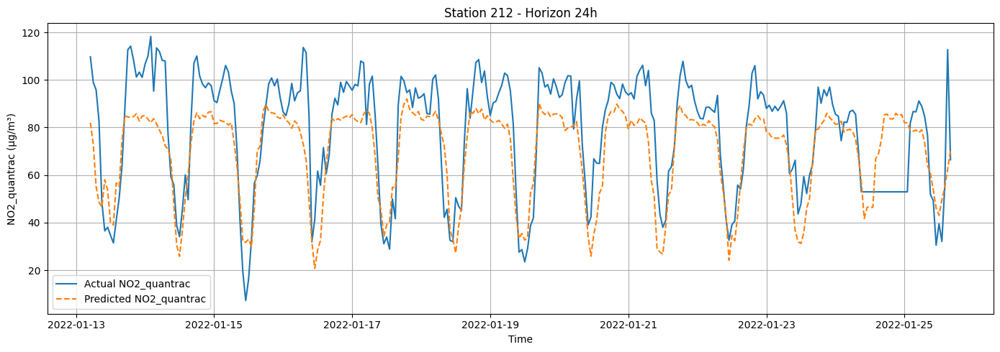

hour = 48
X_test_sid.shape: (860, 60)
y_test_sid.shape: (860, 1)
y_pred_sid.shape: (860,)


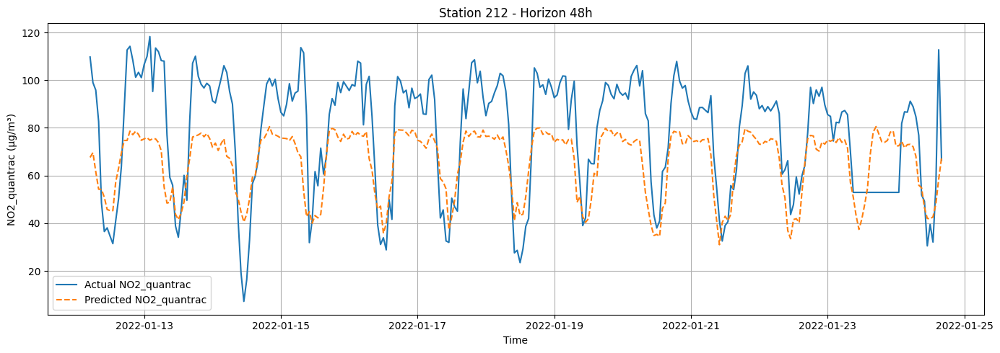

hour = 72
X_test_sid.shape: (857, 60)
y_test_sid.shape: (857, 1)
y_pred_sid.shape: (857,)


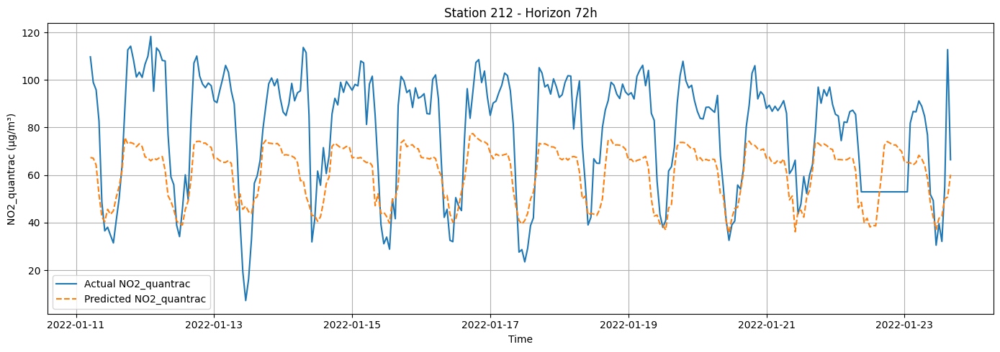

station_id = 213
hour = 1
X_test_sid.shape: (880, 60)
y_test_sid.shape: (880, 1)
y_pred_sid.shape: (880,)


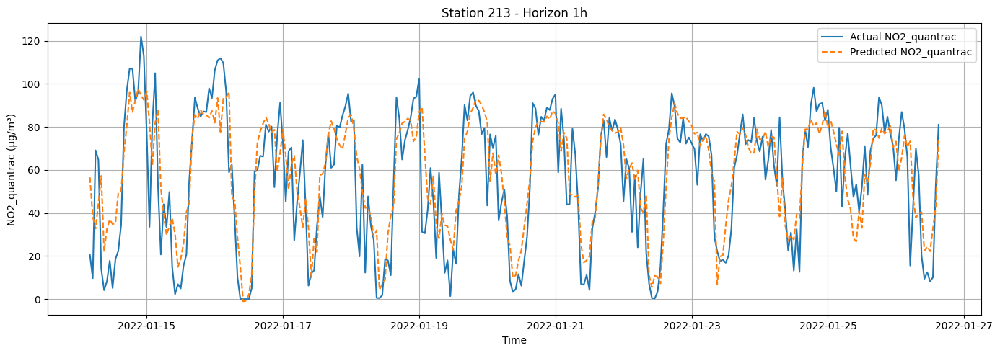

hour = 24
X_test_sid.shape: (876, 60)
y_test_sid.shape: (876, 1)
y_pred_sid.shape: (876,)


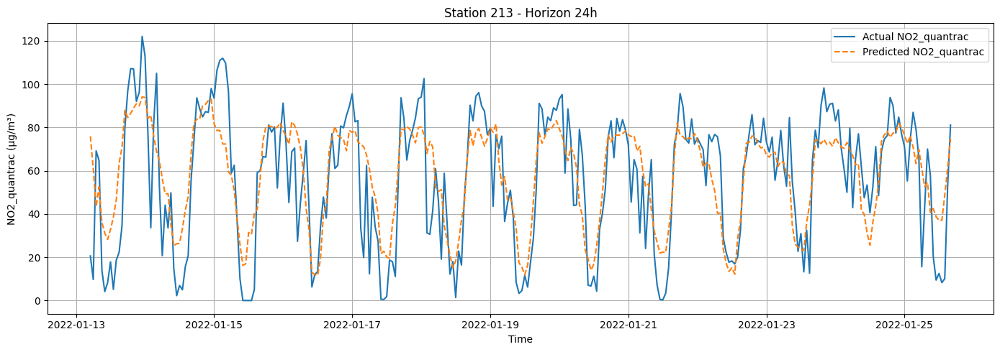

hour = 48
X_test_sid.shape: (873, 60)
y_test_sid.shape: (873, 1)
y_pred_sid.shape: (873,)


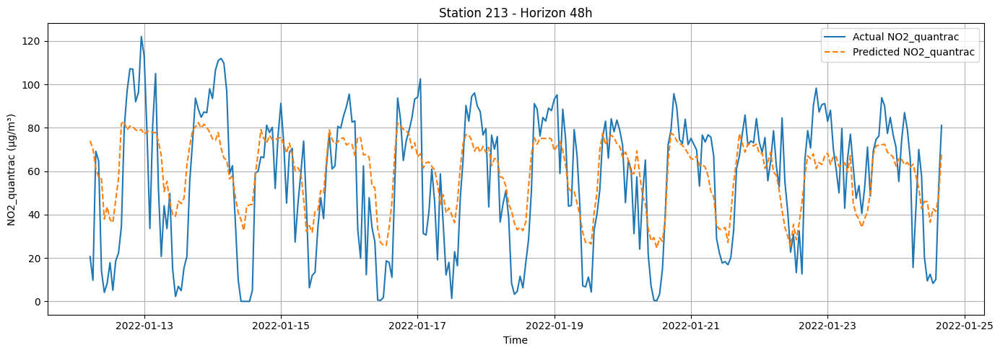

hour = 72
X_test_sid.shape: (869, 60)
y_test_sid.shape: (869, 1)
y_pred_sid.shape: (869,)


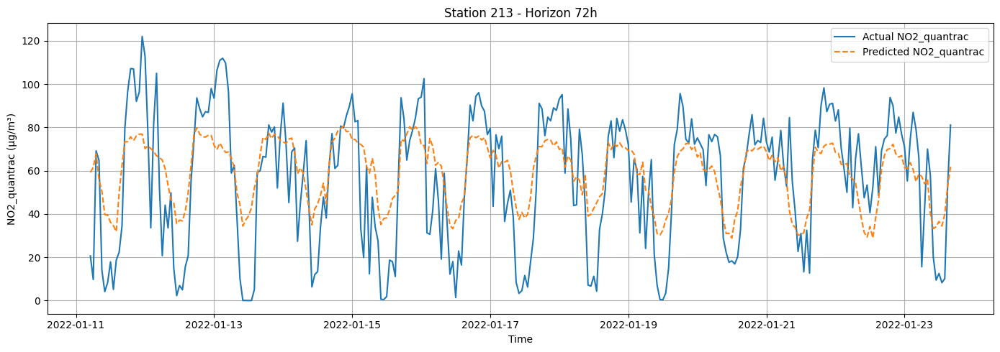

station_id = 214
hour = 1
X_test_sid.shape: (906, 60)
y_test_sid.shape: (906, 1)
y_pred_sid.shape: (906,)


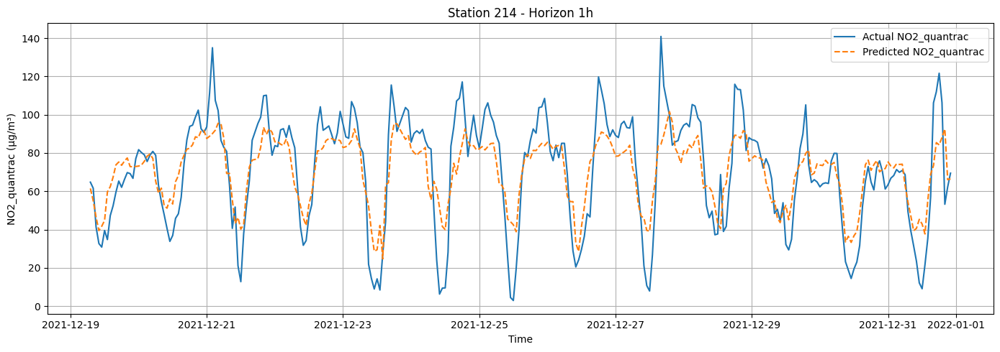

hour = 24
X_test_sid.shape: (902, 60)
y_test_sid.shape: (902, 1)
y_pred_sid.shape: (902,)


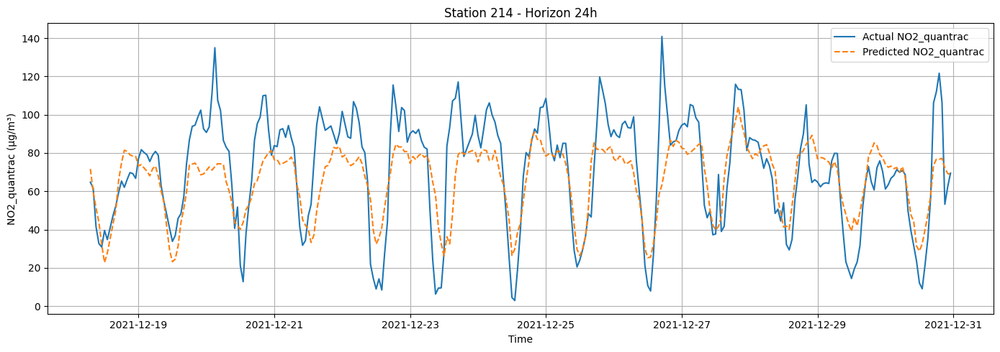

hour = 48
X_test_sid.shape: (899, 60)
y_test_sid.shape: (899, 1)
y_pred_sid.shape: (899,)


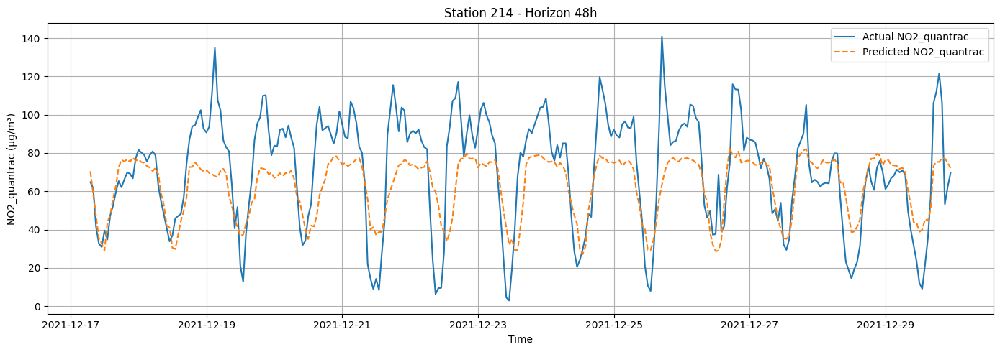

hour = 72
X_test_sid.shape: (895, 60)
y_test_sid.shape: (895, 1)
y_pred_sid.shape: (895,)


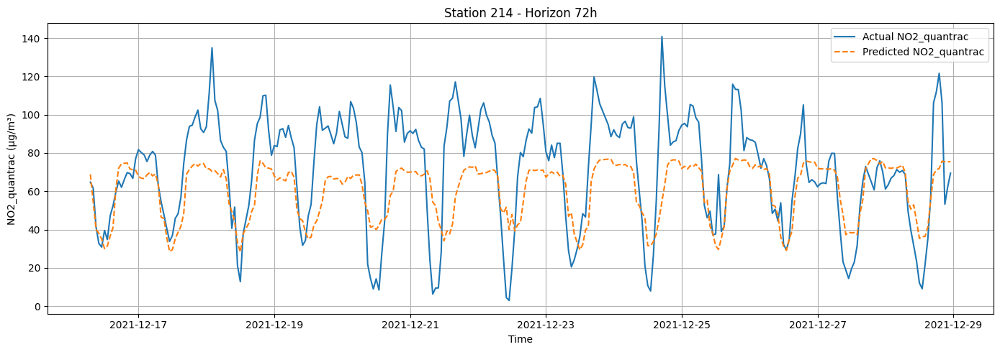

station_id = 215
hour = 1
X_test_sid.shape: (461, 60)
y_test_sid.shape: (461, 1)
y_pred_sid.shape: (461,)


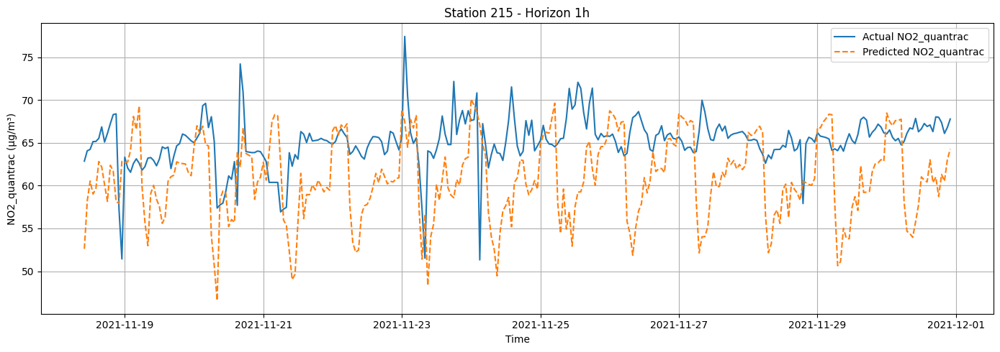

hour = 24
X_test_sid.shape: (458, 60)
y_test_sid.shape: (458, 1)
y_pred_sid.shape: (458,)


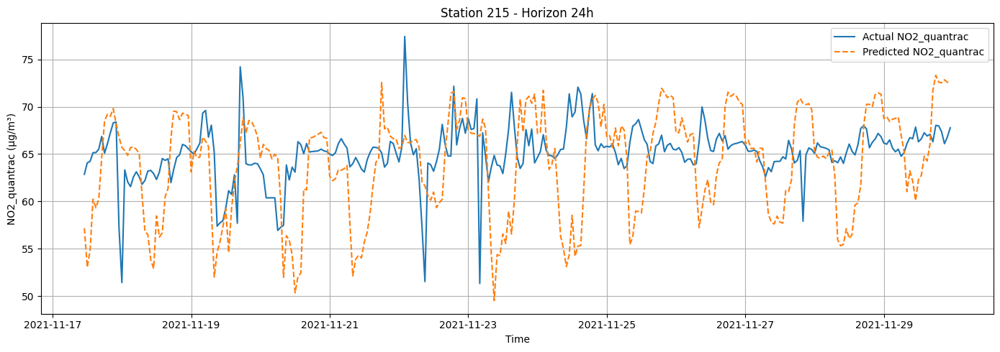

hour = 48
X_test_sid.shape: (454, 60)
y_test_sid.shape: (454, 1)
y_pred_sid.shape: (454,)


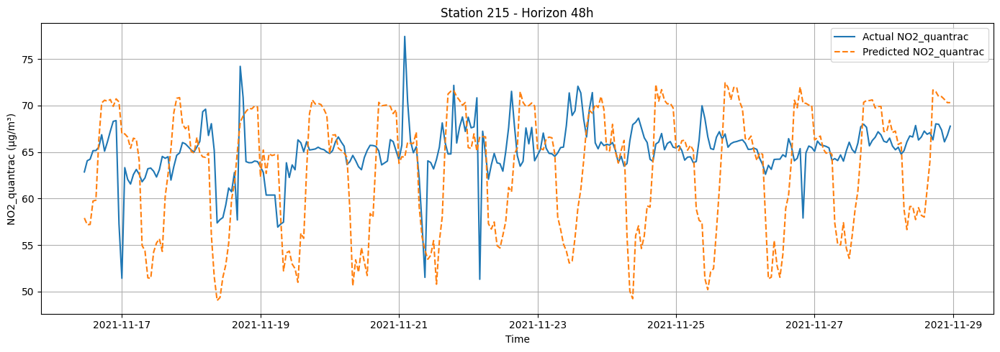

hour = 72
X_test_sid.shape: (450, 60)
y_test_sid.shape: (450, 1)
y_pred_sid.shape: (450,)


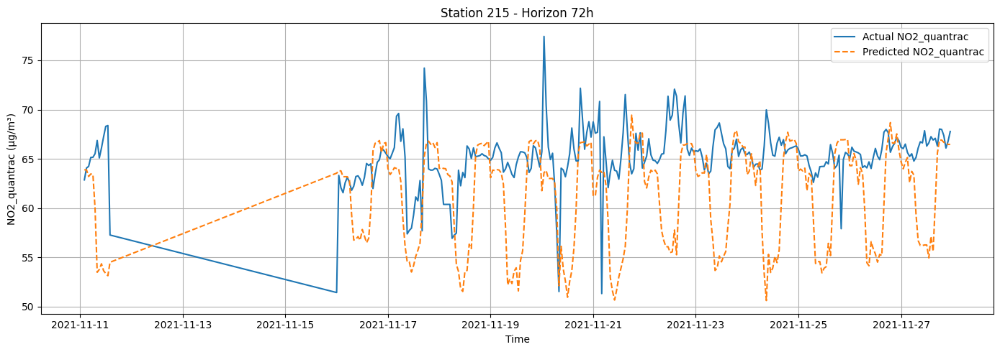

station_id = 216
hour = 1
X_test_sid.shape: (2046, 60)
y_test_sid.shape: (2046, 1)
y_pred_sid.shape: (2046,)


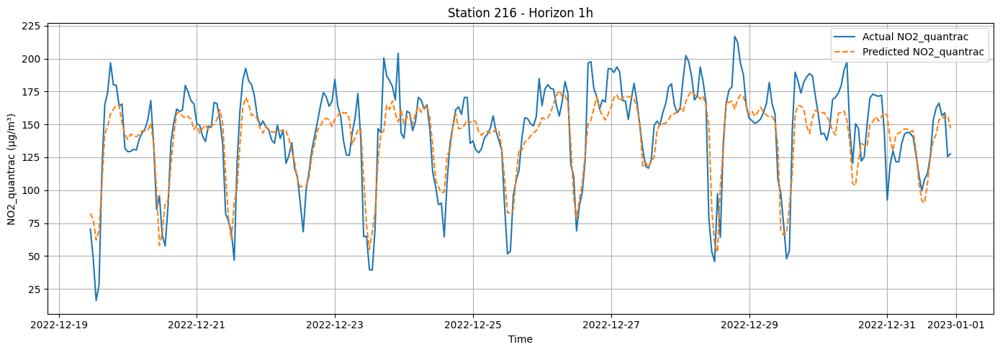

hour = 24
X_test_sid.shape: (2043, 60)
y_test_sid.shape: (2043, 1)
y_pred_sid.shape: (2043,)


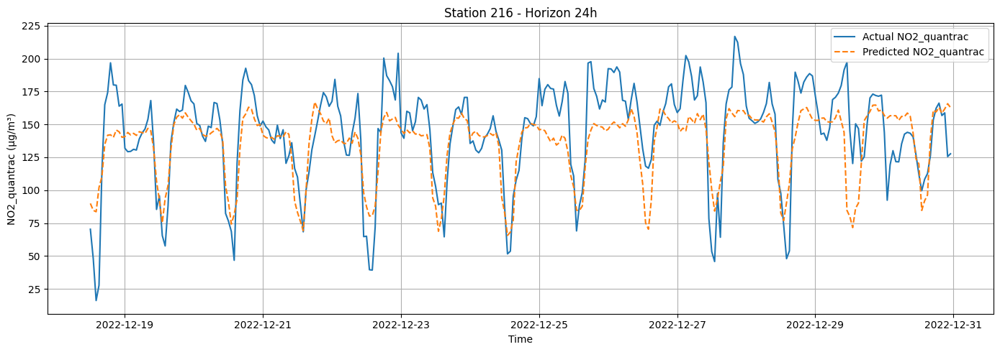

hour = 48
X_test_sid.shape: (2039, 60)
y_test_sid.shape: (2039, 1)
y_pred_sid.shape: (2039,)


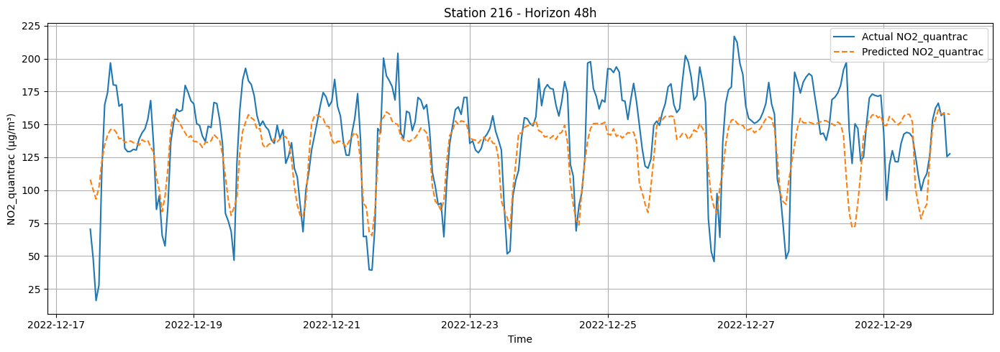

hour = 72
X_test_sid.shape: (2036, 60)
y_test_sid.shape: (2036, 1)
y_pred_sid.shape: (2036,)


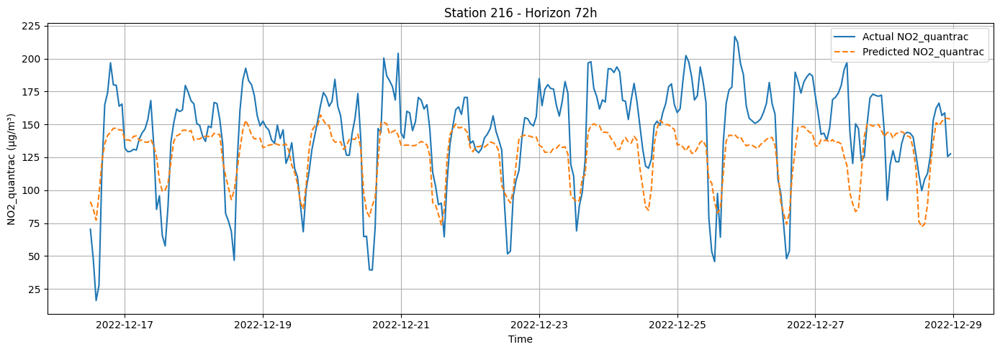

In [16]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in HORIZONS:
        print(f"hour = {hour}")
        plot_timeseries_example(df_no2, no2_models_by_h[hour], horizon_h=hour, station_id=station_id, target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for O3

In [17]:
label = "O3_quantrac"

# Add rolling features for LABEL
df_o3 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
o3_station_to_embedding, _ = learn_station_embeddings(df_o3, target_col=label, station_col="station_id", embed_dim=4, LIGHTGBM_DIR=LIGHTGBM_DIR)
df_o3, _ = attach_station_embedding(df_o3, o3_station_to_embedding, station_col="station_id")

# Print dataset
display(df_o3)

# Start running model
o3_all_metrics = []
o3_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_o3, horizon_h=h, target_col=label)
    o3_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    o3_all_metrics.append(metrics_by_station)

o3_df_metrics_all = pd.concat(o3_all_metrics, ignore_index=True)
o3_df_metrics_all = o3_df_metrics_all.sort_values(["station", "horizon_h"])
o3_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
o3_df_metrics_all

[Embed] epoch 001 | train MSE=7205.8838 | val MSE=7192.1496
[Embed] epoch 010 | train MSE=4982.4207 | val MSE=4729.6205
[Embed] epoch 020 | train MSE=1154.7580 | val MSE=1087.1925
[Embed] epoch 030 | train MSE=849.5183 | val MSE=845.7694
[Embed] epoch 040 | train MSE=842.5061 | val MSE=841.4683
[Embed] epoch 050 | train MSE=842.2304 | val MSE=841.3656


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,O3_quantrac_roll24_mean,O3_quantrac_roll24_std,O3_quantrac_roll48_mean,O3_quantrac_roll48_std,O3_quantrac_roll72_mean,O3_quantrac_roll72_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,55.4313809500,NaN,55.4313809500,NaN,55.4313809500,NaN,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,56.8142787100,1.9557127676,56.8142787100,1.9557127676,56.8142787100,1.9557127676,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,56.2193302500,1.7246150947,56.2193302500,1.7246150947,56.2193302500,1.7246150947,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,55.8564226875,1.5841945626,55.8564226875,1.5841945626,55.8564226875,1.5841945626,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,64.9380388157,15.0927718072,70.0763352689,14.5078761517,75.2320403501,17.3306904910,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,64.6470665934,14.7958230928,69.8784186022,14.3581777465,75.0463922020,17.2494537645,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,64.2442888157,14.6098932113,69.6353630467,14.3202126589,74.3403736835,16.5357222760,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,63.5192888157,14.6124020919,69.2311963800,14.4521933678,73.4371329427,15.7550163747,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316



===== Training LightGBM for horizon = 1h, target_col = O3_quantrac =====

X.shape = (38254, 62)
y.shape = (38254, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
Humid_quantrac_lag48
Humid_quantrac_lag72
O3_quantr

,date,target
0,2022-01-02,65.8253263628
1,2022-01-03,64.1066013632
2,2022-01-04,63.3546871825
3,2022-01-05,63.4765405011
4,2022-01-06,68.2799443737
5,2022-01-07,72.1538949321
6,2022-01-08,63.3488775178
7,2022-01-09,57.5133219784
8,2022-01-10,63.0326053276
9,2022-01-11,57.2614426830


,date,target
0,2022-01-02,67.0959123984
1,2022-01-03,62.4791416927
2,2022-01-04,65.8821117459
3,2022-01-05,64.8270829083
4,2022-01-06,67.5658609015
5,2022-01-07,71.3969687475
6,2022-01-08,66.5699113850
7,2022-01-09,59.8444498081
8,2022-01-10,63.6017345176
9,2022-01-11,61.0116168460


sid = 212, grp =                     date  station_id       y_true          y_pred
8781 2021-11-19 17:00:00         212  177.6187833  132.6826039553
8782 2021-11-19 18:00:00         212  121.8041500  116.3001019221
8783 2021-11-19 19:00:00         212  126.8425167  116.9997035837
8784 2021-11-19 20:00:00         212  125.2394000  113.0057657615
8785 2021-11-19 21:00:00         212  124.4214833  111.1556811727
...                  ...         ...          ...             ...
9643 2022-01-26 11:00:00         212  157.6943333   92.0928227178
9644 2022-01-26 12:00:00         212  153.5393167  106.9344827260
9645 2022-01-26 13:00:00         212   90.0000000  115.7832811162
9646 2022-01-26 14:00:00         212   90.0000000  128.9870521608
9647 2022-01-26 15:00:00         212   90.0000000  125.9532662576

[867 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.

,date,target
0,2021-11-20,123.1921100792
1,2021-11-21,91.9526792167
2,2021-11-23,107.6771365650
3,2021-11-24,108.8908823737
4,2021-11-25,115.8518667772
5,2021-11-26,136.1765371542
6,2021-11-27,137.6372774167
7,2021-11-28,124.0690740708
8,2021-11-29,117.9339469600
9,2021-11-30,119.6860278792


,date,target
0,2021-11-20,112.9981006150
1,2021-11-21,89.9147330313
2,2021-11-23,113.8793782829
3,2021-11-24,117.4780000554
4,2021-11-25,113.6233745403
5,2021-11-26,121.2994259561
6,2021-11-27,126.1023967604
7,2021-11-28,124.5035105115
8,2021-11-29,112.3923110988
9,2021-11-30,110.3736878597


sid = 213, grp =                      date  station_id         y_true          y_pred
14631 2021-12-20 20:00:00         213  156.974566700   91.5366085491
14632 2021-12-20 21:00:00         213  141.761316700   91.6104610145
14633 2021-12-20 22:00:00         213  130.997533300   93.4884748863
14634 2021-12-20 23:00:00         213  129.099966700  100.1578526734
14635 2021-12-21 00:00:00         213  144.629847500  101.0903825577
...                   ...         ...            ...             ...
15506 2022-01-26 11:00:00         213   98.706183330   74.5671340640
15507 2022-01-26 12:00:00         213   91.770250000   81.2625310399
15508 2022-01-26 13:00:00         213   95.074633330   92.9123808002
15509 2022-01-26 14:00:00         213   86.239958374   92.5127834514
15510 2022-01-26 15:00:00         213   90.000000000   97.0708527413

[880 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), da

,date,target
0,2021-12-21,91.4311149525
1,2021-12-22,84.0918608962
2,2021-12-23,63.4550147250
3,2021-12-24,78.1384747489
4,2021-12-25,94.9470475775
5,2021-12-26,83.8008535404
6,2021-12-27,94.9922750987
7,2021-12-28,95.8774333104
8,2021-12-29,77.8941320146
9,2021-12-30,64.1645227771


,date,target
0,2021-12-21,93.0173331189
1,2021-12-22,91.4744874220
2,2021-12-23,73.5898770651
3,2021-12-24,71.1190018086
4,2021-12-25,85.8488121563
5,2021-12-26,90.7258335432
6,2021-12-27,88.1881962616
7,2021-12-28,95.9548952338
8,2021-12-29,91.6289768516
9,2021-12-30,75.7567904413


sid = 214, grp =                      date  station_id        y_true          y_pred
20640 2021-11-23 16:00:00         214   90.00000000  106.9496292512
20641 2021-11-23 17:00:00         214   90.00000000  116.8451028416
20642 2021-11-23 18:00:00         214   90.00000000  111.0543365199
20643 2021-11-23 19:00:00         214   90.00000000   99.1503771484
20644 2021-11-23 20:00:00         214  119.67756670  105.1814292626
...                   ...         ...           ...             ...
21541 2021-12-31 18:00:00         214  132.43706670  117.6253984781
21542 2021-12-31 19:00:00         214  107.80141670  113.3040641425
21543 2021-12-31 20:00:00         214   61.21651852  114.3574911587
21544 2021-12-31 21:00:00         214   73.80880000   99.4243985761
21545 2021-12-31 22:00:00         214   82.64230000   82.8764969888

[906 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26), datetime.date(

,date,target
0,2021-11-24,93.3443932779
1,2021-11-25,91.6623921200
2,2021-11-26,102.2618008508
3,2021-11-27,101.2890797825
4,2021-11-28,91.3355579367
5,2021-11-29,84.2368115154
6,2021-11-30,81.4905561046
7,2021-12-01,95.4026808217
8,2021-12-02,113.8599750875
9,2021-12-03,112.6866467000


,date,target
0,2021-11-24,91.4489298431
1,2021-11-25,89.5904460234
2,2021-11-26,97.5989667588
3,2021-11-27,98.0679925769
4,2021-11-28,89.5129208837
5,2021-11-29,85.8873642337
6,2021-11-30,79.3159613416
7,2021-12-01,89.1698050557
8,2021-12-02,111.3688190613
9,2021-12-03,117.6090774321


sid = 215, grp =                      date  station_id  y_true         y_pred
24155 2021-11-07 08:00:00         215    90.0  91.6533608106
24156 2021-11-07 09:00:00         215    90.0  92.2385594785
24157 2021-11-07 10:00:00         215    90.0  93.7016587386
24158 2021-11-07 11:00:00         215    90.0  91.2602195645
24159 2021-11-07 12:00:00         215    90.0  93.3623864156
...                   ...         ...     ...            ...
24611 2021-11-30 18:00:00         215    90.0  85.8704834338
24612 2021-11-30 19:00:00         215    90.0  86.9468922992
24613 2021-11-30 20:00:00         215    90.0  84.4671663397
24614 2021-11-30 21:00:00         215    90.0  87.4397445179
24615 2021-11-30 22:00:00         215    90.0  86.8872254333

[461 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(2021, 11, 16), datetime.date(2021, 11, 17), datetime.date(

,date,target
0,2021-11-07,90.0
1,2021-11-08,90.0
2,2021-11-09,90.0
3,2021-11-10,90.0
4,2021-11-11,90.0
5,2021-11-16,90.0
6,2021-11-17,90.0
7,2021-11-18,90.0
8,2021-11-19,90.0
9,2021-11-20,90.0


,date,target
0,2021-11-07,90.9988391236
1,2021-11-08,87.4926813021
2,2021-11-09,92.8107888565
3,2021-11-10,88.3206818105
4,2021-11-11,92.7445036123
5,2021-11-16,89.1493304318
6,2021-11-17,91.1811077570
7,2021-11-18,91.2284697535
8,2021-11-19,91.7302410907
9,2021-11-20,90.4801743875


sid = 216, grp =                      date  station_id         y_true         y_pred
36208 2022-09-20 19:00:00         216  60.8833333333  53.8214978067
36209 2022-09-20 20:00:00         216  71.8166666667  55.3055277150
36210 2022-09-20 21:00:00         216  57.4333333333  54.3235697378
36211 2022-09-20 22:00:00         216  45.9000000000  52.2142021845
36212 2022-09-20 23:00:00         216  40.3461538462  48.4641574035
...                   ...         ...            ...            ...
38249 2022-12-31 18:00:00         216  75.9166666667  86.8878380720
38250 2022-12-31 19:00:00         216  66.1166666667  84.2950449035
38251 2022-12-31 20:00:00         216  55.1333333333  75.6448237455
38252 2022-12-31 21:00:00         216  46.7500000000  70.1221097882
38253 2022-12-31 22:00:00         216  50.0166666667  62.6667137092

[2046 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(2022, 9, 23), datetime.date(202

,date,target
0,2022-09-21,46.4844863732
1,2022-09-22,44.4186975891
2,2022-09-23,46.1901836158
3,2022-09-24,44.8116193061
4,2022-09-25,48.7034016008
...,...,...
82,2022-12-27,75.4105341479
83,2022-12-28,78.1382022913
84,2022-12-29,80.2899782904
85,2022-12-30,72.2750483888


,date,target
0,2022-09-21,46.7872718142
1,2022-09-22,45.9767303837
2,2022-09-23,46.7195760890
3,2022-09-24,46.2078314463
4,2022-09-25,47.2840423853
...,...,...
82,2022-12-27,79.4548199143
83,2022-12-28,79.4877936654
84,2022-12-29,83.5994916101
85,2022-12-30,81.8479992974


Overall test metrics: {'rmse': 18.74, 'mae': 12.71, 'mape': 21.62, 'mnbe': -9.73, 'r': 0.83, 'n_samples': 5741}

===== Training LightGBM for horizon = 24h, target_col = O3_quantrac =====

X.shape = (38116, 62)
y.shape = (38116, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3


,date,target
0,2022-01-02,63.9786230323
1,2022-01-03,63.1137688130
2,2022-01-04,63.4686794529
3,2022-01-05,67.9858535225
4,2022-01-06,72.5380178614
5,2022-01-07,63.8443269909
6,2022-01-08,57.1622116777
7,2022-01-09,63.0906289113
8,2022-01-10,57.4374054710
9,2022-01-11,54.3523164387


,date,target
0,2022-01-02,56.3301411726
1,2022-01-03,62.6478351702
2,2022-01-04,66.7034668571
3,2022-01-05,66.1638123524
4,2022-01-06,67.7865362877
5,2022-01-07,70.1212712497
6,2022-01-08,67.7891504457
7,2022-01-09,63.3298544623
8,2022-01-10,65.8210566399
9,2022-01-11,64.3064026177


sid = 212, grp =                     date  station_id       y_true          y_pred
8738 2021-11-18 21:00:00         212  125.2394000  110.7311636481
8739 2021-11-18 22:00:00         212  124.4214833  105.6697215605
8740 2021-11-18 23:00:00         212  122.7856500  105.9444479110
8741 2021-11-19 00:00:00         212  120.4627667   99.3836774281
8742 2021-11-19 01:00:00         212  115.1062586   95.0302827770
...                  ...         ...          ...             ...
9597 2022-01-25 12:00:00         212  157.6943333  112.6105672456
9598 2022-01-25 13:00:00         212  153.5393167  106.9936361533
9599 2022-01-25 14:00:00         212   90.0000000  112.6439930785
9600 2022-01-25 15:00:00         212   90.0000000  113.6653260803
9601 2022-01-25 16:00:00         212   90.0000000  118.0606516184

[864 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.

,date,target
0,2021-11-19,123.7673781375
1,2021-11-20,91.7454736583
2,2021-11-21,108.1419858721
3,2021-11-23,108.6632289000
4,2021-11-24,115.2207077522
5,2021-11-25,135.8657288208
6,2021-11-26,137.9330906083
7,2021-11-27,124.9660560167
8,2021-11-28,117.9925643212
9,2021-11-29,118.8394841304


,date,target
0,2021-11-19,102.5698204517
1,2021-11-20,104.4778545922
2,2021-11-21,103.6768555147
3,2021-11-23,108.2161899094
4,2021-11-24,103.7409855067
5,2021-11-25,106.3525575425
6,2021-11-26,111.2740129764
7,2021-11-27,122.7827167754
8,2021-11-28,115.1061566198
9,2021-11-29,115.9388662013


sid = 213, grp =                      date  station_id         y_true          y_pred
14566 2021-12-20 01:00:00         213  144.629847500   84.7213887432
14567 2021-12-20 02:00:00         213   40.324677970   86.9388273881
14568 2021-12-20 03:00:00         213   50.808983330   79.5661831492
14569 2021-12-20 04:00:00         213   38.605666670   79.2740997170
14570 2021-12-20 05:00:00         213   66.643850000   82.8203819234
...                   ...         ...            ...             ...
15437 2022-01-25 12:00:00         213   98.706183330   78.0506877700
15438 2022-01-25 13:00:00         213   91.770250000   82.6078704496
15439 2022-01-25 14:00:00         213   95.074633330   93.8586912625
15440 2022-01-25 15:00:00         213   86.239958374  103.1641654485
15441 2022-01-25 16:00:00         213   90.000000000  103.5337705576

[876 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), da

,date,target
0,2021-12-20,91.6766808200
1,2021-12-21,84.8743345075
2,2021-12-22,64.3656286138
3,2021-12-23,76.2128137177
4,2021-12-24,96.3391904745
5,2021-12-25,84.0898507629
6,2021-12-26,94.6767191917
7,2021-12-27,95.8774333104
8,2021-12-28,78.6706123922
9,2021-12-29,64.8106769438


,date,target
0,2021-12-20,86.2643252009
1,2021-12-21,89.0015250661
2,2021-12-22,92.4930182859
3,2021-12-23,83.5159982026
4,2021-12-24,75.8139623615
5,2021-12-25,79.3152850837
6,2021-12-26,91.1537794106
7,2021-12-27,94.4778833382
8,2021-12-28,96.7732554070
9,2021-12-29,99.1692503865


sid = 214, grp =                      date  station_id        y_true         y_pred
20552 2021-11-22 21:00:00         214  119.67756670  88.8342199386
20553 2021-11-22 22:00:00         214   96.03884906  83.1848565924
20554 2021-11-22 23:00:00         214   79.39633929  83.2059811542
20555 2021-11-23 00:00:00         214   71.91123333  81.9447560586
20556 2021-11-23 01:00:00         214   78.09468333  80.1730027465
...                   ...         ...           ...            ...
21449 2021-12-30 19:00:00         214  132.43706670  99.6517264534
21450 2021-12-30 20:00:00         214  107.80141670  91.7596459748
21451 2021-12-30 21:00:00         214   61.21651852  80.6211470929
21452 2021-12-30 22:00:00         214   73.80880000  79.5555504505
21453 2021-12-30 23:00:00         214   82.64230000  77.3299633116

[902 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26

,date,target
0,2021-11-23,92.4992127221
1,2021-11-24,91.8123435092
2,2021-11-25,102.1691036283
3,2021-11-26,101.3504235325
4,2021-11-27,92.0730461312
5,2021-11-28,84.5258087375
6,2021-11-29,80.8866609658
7,2021-11-30,94.8464974883
8,2021-12-01,113.6614730042
9,2021-12-02,112.5797932279


,date,target
0,2021-11-23,85.8453477607
1,2021-11-24,89.7629723433
2,2021-11-25,87.5117005967
3,2021-11-26,95.5944917052
4,2021-11-27,100.4459580627
5,2021-11-28,96.1068356721
6,2021-11-29,96.1353429021
7,2021-11-30,87.7359051467
8,2021-12-01,87.6030763711
9,2021-12-02,100.6648991304


sid = 215, grp =                      date  station_id  y_true         y_pred
24043 2021-11-06 12:00:00         215    90.0  87.6290124208
24044 2021-11-06 13:00:00         215    90.0  85.7345849159
24045 2021-11-06 14:00:00         215    90.0  86.7799280682
24046 2021-11-06 15:00:00         215    90.0  87.2763188633
24047 2021-11-06 16:00:00         215    90.0  87.9731488482
...                   ...         ...     ...            ...
24496 2021-11-29 19:00:00         215    90.0  88.0627027560
24497 2021-11-29 20:00:00         215    90.0  85.7779129950
24498 2021-11-29 21:00:00         215    90.0  85.4363826595
24499 2021-11-29 22:00:00         215    90.0  85.1000457777
24500 2021-11-29 23:00:00         215    90.0  85.5433692870

[458 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(2021, 11, 16), datetime.date(2

,date,target
0,2021-11-06,90.0
1,2021-11-07,90.0
2,2021-11-08,90.0
3,2021-11-09,90.0
4,2021-11-10,90.0
5,2021-11-11,90.0
6,2021-11-16,90.0
7,2021-11-17,90.0
8,2021-11-18,90.0
9,2021-11-19,90.0


,date,target
0,2021-11-06,86.5297114523
1,2021-11-07,86.3904586321
2,2021-11-08,87.7237937858
3,2021-11-09,90.0678619158
4,2021-11-10,89.1079331735
5,2021-11-11,89.4959707111
6,2021-11-16,89.5493839677
7,2021-11-17,89.7356443681
8,2021-11-18,90.0749330391
9,2021-11-19,88.5872454873


sid = 216, grp =                      date  station_id         y_true         y_pred
36073 2022-09-19 23:00:00         216  45.9000000000  51.9607125450
36074 2022-09-20 00:00:00         216  40.3461538462  48.4733443142
36075 2022-09-20 01:00:00         216  39.0943396226  46.1298171991
36076 2022-09-20 02:00:00         216  39.0833333333  46.7783624535
36077 2022-09-20 03:00:00         216  39.6166666667  45.1696722674
...                   ...         ...            ...            ...
38111 2022-12-30 19:00:00         216  75.9166666667  86.8926480269
38112 2022-12-30 20:00:00         216  66.1166666667  82.9521940028
38113 2022-12-30 21:00:00         216  55.1333333333  87.9391189572
38114 2022-12-30 22:00:00         216  46.7500000000  81.4688421932
38115 2022-12-30 23:00:00         216  50.0166666667  79.7329467422

[2043 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(202

,date,target
0,2022-09-20,46.1065483390
1,2022-09-21,44.8909198113
2,2022-09-22,45.9874058380
3,2022-09-23,44.9275915283
4,2022-09-24,48.4547904896
...,...,...
82,2022-12-26,74.8619230368
83,2022-12-27,77.9263967357
84,2022-12-28,80.4344227349
85,2022-12-29,73.5132428332


,date,target
0,2022-09-20,51.2826128407
1,2022-09-21,51.2680226122
2,2022-09-22,49.8436487451
3,2022-09-23,49.1371851082
4,2022-09-24,49.5210708648
...,...,...
82,2022-12-26,75.6861885229
83,2022-12-27,76.7470450429
84,2022-12-28,77.4051253860
85,2022-12-29,84.5002399614


Overall test metrics: {'rmse': 22.01, 'mae': 15.91, 'mape': 27.7, 'mnbe': -13.71, 'r': 0.75, 'n_samples': 5720}

===== Training LightGBM for horizon = 48h, target_col = O3_quantrac =====

X.shape = (37972, 62)
y.shape = (37972, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3


,date,target
0,2022-01-01,63.9786230323
1,2022-01-02,63.1137688130
2,2022-01-03,63.4686794529
3,2022-01-04,67.9858535225
4,2022-01-05,72.5380178614
5,2022-01-06,63.8443269909
6,2022-01-07,57.1622116777
7,2022-01-08,63.0906289113
8,2022-01-09,57.4374054710
9,2022-01-10,54.3523164387


,date,target
0,2022-01-01,59.7856752573
1,2022-01-02,62.9704080482
2,2022-01-03,65.1598462332
3,2022-01-04,66.3321673909
4,2022-01-05,68.9481204202
5,2022-01-06,68.5074571514
6,2022-01-07,68.3126272852
7,2022-01-08,70.7299993991
8,2022-01-09,71.4984076953
9,2022-01-10,65.9832852750


sid = 212, grp =                     date  station_id        y_true          y_pred
8694 2021-11-18 01:00:00         212  115.10625860  102.1479452244
8695 2021-11-18 02:00:00         212  113.62498330  103.5119003298
8696 2021-11-18 03:00:00         212  104.92235000  101.4399868908
8697 2021-11-18 04:00:00         212   93.60238333   98.0620822002
8698 2021-11-18 05:00:00         212   82.67501667  103.4282679996
...                  ...         ...           ...             ...
9549 2022-01-24 12:00:00         212  157.69433330  104.3403006281
9550 2022-01-24 13:00:00         212  153.53931670   96.7239033892
9551 2022-01-24 14:00:00         212   90.00000000  114.8085809160
9552 2022-01-24 15:00:00         212   90.00000000  119.5416066795
9553 2022-01-24 16:00:00         212   90.00000000  124.1746694092

[860 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22

,date,target
0,2021-11-18,123.9110568957
1,2021-11-19,91.7454736583
2,2021-11-20,108.1419858721
3,2021-11-21,103.9138594583
4,2021-11-23,115.2207077522
5,2021-11-24,135.8657288208
6,2021-11-25,137.9330906083
7,2021-11-26,124.9660560167
8,2021-11-27,117.9925643212
9,2021-11-28,118.8394841304


,date,target
0,2021-11-18,101.7938770898
1,2021-11-19,101.4863070416
2,2021-11-20,110.9360092780
3,2021-11-21,108.4772032752
4,2021-11-23,105.6531025048
5,2021-11-24,103.8085749890
6,2021-11-25,103.7426326909
7,2021-11-26,101.6806472903
8,2021-11-27,111.9805365727
9,2021-11-28,115.0552444783


sid = 213, grp =                      date  station_id         y_true          y_pred
14497 2021-12-19 04:00:00         213   38.605666670   75.1997331297
14498 2021-12-19 05:00:00         213   66.643850000   72.9136427246
14499 2021-12-19 06:00:00         213   51.692333330   66.5665497948
14500 2021-12-19 07:00:00         213   77.309483330   71.3478125927
14501 2021-12-19 08:00:00         213  124.977666700   75.3925015891
...                   ...         ...            ...             ...
15365 2022-01-24 12:00:00         213   98.706183330   92.1318556433
15366 2022-01-24 13:00:00         213   91.770250000   90.3635040641
15367 2022-01-24 14:00:00         213   95.074633330   92.4724503711
15368 2022-01-24 15:00:00         213   86.239958374   93.9601692229
15369 2022-01-24 16:00:00         213   90.000000000  103.2115528859

[873 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), da

,date,target
0,2021-12-19,93.6400075030
1,2021-12-20,84.8743345075
2,2021-12-21,64.3656286138
3,2021-12-22,76.2128137177
4,2021-12-23,95.2783731425
5,2021-12-24,84.1335296968
6,2021-12-25,94.6767191917
7,2021-12-26,95.7281348887
8,2021-12-27,77.2680390070
9,2021-12-28,65.0183114487


,date,target
0,2021-12-19,81.0152358623
1,2021-12-20,82.7002415488
2,2021-12-21,90.0386564279
3,2021-12-22,93.0958938450
4,2021-12-23,81.1382862424
5,2021-12-24,73.5140280562
6,2021-12-25,83.6130670095
7,2021-12-26,94.7998176215
8,2021-12-27,91.8322816015
9,2021-12-28,103.3368087945


sid = 214, grp =                      date  station_id        y_true         y_pred
20459 2021-11-22 00:00:00         214   71.91123333  88.8915818652
20460 2021-11-22 01:00:00         214   78.09468333  90.0886763804
20461 2021-11-22 02:00:00         214   87.51708333  91.2531336571
20462 2021-11-22 03:00:00         214   88.41512245  87.6756298341
20463 2021-11-22 04:00:00         214   81.58094915  88.3254107727
...                   ...         ...           ...            ...
21353 2021-12-29 19:00:00         214  132.43706670  99.0745188103
21354 2021-12-29 20:00:00         214  107.80141670  99.0799095647
21355 2021-12-29 21:00:00         214   61.21651852  88.2461574349
21356 2021-12-29 22:00:00         214   73.80880000  86.2387270248
21357 2021-12-29 23:00:00         214   82.64230000  83.1422730057

[899 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26

,date,target
0,2021-11-22,92.4992127221
1,2021-11-23,91.8123435092
2,2021-11-24,102.1691036283
3,2021-11-25,101.3504235325
4,2021-11-26,92.0730461312
5,2021-11-27,84.5258087375
6,2021-11-28,80.8866609658
7,2021-11-29,94.8464974883
8,2021-11-30,113.6614730042
9,2021-12-01,112.5797932279


,date,target
0,2021-11-22,85.4493170261
1,2021-11-23,84.3563919349
2,2021-11-24,88.5889537284
3,2021-11-25,84.0022635119
4,2021-11-26,85.2855364143
5,2021-11-27,85.1371309185
6,2021-11-28,87.7475803906
7,2021-11-29,92.1796592560
8,2021-11-30,89.3153784791
9,2021-12-01,87.7951209790


sid = 215, grp =                      date  station_id  y_true         y_pred
23927 2021-11-05 16:00:00         215    90.0  91.1889944117
23928 2021-11-05 17:00:00         215    90.0  91.6190300241
23929 2021-11-05 18:00:00         215    90.0  91.6518768626
23930 2021-11-05 19:00:00         215    90.0  93.0495261600
23931 2021-11-05 20:00:00         215    90.0  91.9912434047
...                   ...         ...     ...            ...
24376 2021-11-28 19:00:00         215    90.0  91.8719711567
24377 2021-11-28 20:00:00         215    90.0  91.2002244154
24378 2021-11-28 21:00:00         215    90.0  89.7772342194
24379 2021-11-28 22:00:00         215    90.0  86.6956603227
24380 2021-11-28 23:00:00         215    90.0  88.1988685740

[454 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(20

,date,target
0,2021-11-06,90.0
1,2021-11-07,90.0
2,2021-11-08,90.0
3,2021-11-09,90.0
4,2021-11-10,90.0
5,2021-11-11,90.0
6,2021-11-16,90.0
7,2021-11-17,90.0
8,2021-11-18,90.0
9,2021-11-19,90.0


,date,target
0,2021-11-06,91.4105643946
1,2021-11-07,91.1093711793
2,2021-11-08,94.1775298613
3,2021-11-09,96.2109649152
4,2021-11-10,94.4942828203
5,2021-11-11,94.6358061579
6,2021-11-16,94.8151065338
7,2021-11-17,97.4718961686
8,2021-11-18,92.8353155204
9,2021-11-19,90.5783690562


sid = 216, grp =                      date  station_id         y_true         y_pred
35933 2022-09-19 03:00:00         216  39.6166666667  46.7527144476
35934 2022-09-19 04:00:00         216  39.5000000000  46.8782914746
35935 2022-09-19 05:00:00         216  38.9000000000  47.1463163275
35936 2022-09-19 06:00:00         216  38.8500000000  51.6147000208
35937 2022-09-19 07:00:00         216  39.6666666667  49.5437847906
...                   ...         ...            ...            ...
37967 2022-12-29 19:00:00         216  75.9166666667  99.6565272547
37968 2022-12-29 20:00:00         216  66.1166666667  96.1396846304
37969 2022-12-29 21:00:00         216  55.1333333333  92.8995776205
37970 2022-12-29 22:00:00         216  46.7500000000  81.1112858848
37971 2022-12-29 23:00:00         216  50.0166666667  81.7620430750

[2039 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(202

,date,target
0,2022-09-19,47.0492063492
1,2022-09-20,44.8909198113
2,2022-09-21,45.9874058380
3,2022-09-22,44.9275915283
4,2022-09-23,48.4547904896
...,...,...
82,2022-12-25,74.8619230368
83,2022-12-26,77.9263967357
84,2022-12-27,80.4344227349
85,2022-12-28,73.5132428332


,date,target
0,2022-09-19,54.1185518527
1,2022-09-20,52.2203357572
2,2022-09-21,52.8463197769
3,2022-09-22,50.9163767655
4,2022-09-23,49.5881580461
...,...,...
82,2022-12-25,66.3346517722
83,2022-12-26,73.2827150633
84,2022-12-27,79.5021281804
85,2022-12-28,84.5340576680


Overall test metrics: {'rmse': 22.87, 'mae': 16.65, 'mape': 29.54, 'mnbe': -14.61, 'r': 0.72, 'n_samples': 5699}

===== Training LightGBM for horizon = 72h, target_col = O3_quantrac =====

X.shape = (37828, 62)
y.shape = (37828, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3

,date,target
0,2021-11-30,63.9786230323
1,2022-01-01,63.1137688130
2,2022-01-02,63.4686794529
3,2022-01-03,67.9858535225
4,2022-01-04,72.5380178614
5,2022-01-05,63.8443269909
6,2022-01-06,57.1622116777
7,2022-01-07,63.0906289113
8,2022-01-08,57.4374054710
9,2022-01-09,54.3523164387


,date,target
0,2021-11-30,64.4496449659
1,2022-01-01,59.1148857975
2,2022-01-02,60.3850169423
3,2022-01-03,62.8717082846
4,2022-01-04,64.8282403066
5,2022-01-05,65.5832405351
6,2022-01-06,66.2628548099
7,2022-01-07,70.3746665869
8,2022-01-08,69.8523231181
9,2022-01-09,66.5140061320


sid = 212, grp =                     date  station_id        y_true          y_pred
8649 2021-11-17 04:00:00         212   93.60238333   95.6191727569
8650 2021-11-17 05:00:00         212   82.67501667   95.8265881221
8651 2021-11-17 06:00:00         212   94.58388333   97.3315412747
8652 2021-11-17 07:00:00         212  101.65068330   94.4998856760
8653 2021-11-17 08:00:00         212  136.91925000   83.8345164519
...                  ...         ...           ...             ...
9501 2022-01-23 12:00:00         212  157.69433330   97.4702438046
9502 2022-01-23 13:00:00         212  153.53931670   94.5052934743
9503 2022-01-23 14:00:00         212   90.00000000  111.0572620303
9504 2022-01-23 15:00:00         212   90.00000000  119.0903793712
9505 2022-01-23 16:00:00         212   90.00000000  113.4607904973

[857 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21

,date,target
0,2021-11-17,125.8150358350
1,2021-11-18,91.7454736583
2,2021-11-19,108.1419858721
3,2021-11-20,103.9138594583
4,2021-11-21,118.3478758064
5,2021-11-23,135.8657288208
6,2021-11-24,137.9330906083
7,2021-11-25,124.9660560167
8,2021-11-26,117.9925643212
9,2021-11-27,118.8394841304


,date,target
0,2021-11-17,98.6363409474
1,2021-11-18,99.2798139428
2,2021-11-19,99.4102099896
3,2021-11-20,104.9942478006
4,2021-11-21,99.0982827387
5,2021-11-23,104.6818903065
6,2021-11-24,102.3965241995
7,2021-11-25,101.6329016550
8,2021-11-26,100.9214115125
9,2021-11-27,105.5475214316


sid = 213, grp =                      date  station_id         y_true         y_pred
14429 2021-12-18 08:00:00         213  124.977666700  74.5856590648
14430 2021-12-18 09:00:00         213   95.401800000  68.0021933855
14431 2021-12-18 10:00:00         213   68.181533330  62.6572910969
14432 2021-12-18 11:00:00         213   82.413283330  59.5102456032
14433 2021-12-18 12:00:00         213   77.636650000  63.1845182109
...                   ...         ...            ...            ...
15293 2022-01-23 12:00:00         213   98.706183330  75.3066523815
15294 2022-01-23 13:00:00         213   91.770250000  72.2752156799
15295 2022-01-23 14:00:00         213   95.074633330  74.6905561209
15296 2022-01-23 15:00:00         213   86.239958374  84.5258616993
15297 2022-01-23 16:00:00         213   90.000000000  86.3334880799

[869 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(

,date,target
0,2021-12-18,102.4093010456
1,2021-12-19,84.8743345075
2,2021-12-20,64.3656286138
3,2021-12-21,76.2128137177
4,2021-12-22,95.2783731425
5,2021-12-23,84.7948302350
6,2021-12-24,94.9137721950
7,2021-12-25,95.7281348887
8,2021-12-26,76.2832520708
9,2021-12-27,64.6224084396


,date,target
0,2021-12-18,75.6387653578
1,2021-12-19,81.0615777609
2,2021-12-20,80.9522767173
3,2021-12-21,86.2581294525
4,2021-12-22,86.1673767905
5,2021-12-23,78.9133276029
6,2021-12-24,76.2096673902
7,2021-12-25,82.3727131328
8,2021-12-26,87.2530592323
9,2021-12-27,90.8153153552


sid = 214, grp =                      date  station_id        y_true          y_pred
20367 2021-11-21 04:00:00         214   81.58094915   80.9667731277
20368 2021-11-21 05:00:00         214   69.91551667   78.8660696488
20369 2021-11-21 06:00:00         214   72.46741667   77.3929670006
20370 2021-11-21 07:00:00         214   95.82711667   83.2044810157
20371 2021-11-21 08:00:00         214  119.87386670   83.3217866428
...                   ...         ...           ...             ...
21257 2021-12-28 19:00:00         214  132.43706670  106.1496245267
21258 2021-12-28 20:00:00         214  107.80141670  109.5882530874
21259 2021-12-28 21:00:00         214   61.21651852  105.9177676191
21260 2021-12-28 22:00:00         214   73.80880000  101.2594675612
21261 2021-12-28 23:00:00         214   82.64230000   97.3820175743

[895 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(

,date,target
0,2021-11-21,94.7021491445
1,2021-11-22,91.8123435092
2,2021-11-23,102.1691036283
3,2021-11-24,101.3504235325
4,2021-11-25,92.0730461312
5,2021-11-26,84.5258087375
6,2021-11-27,80.8866609658
7,2021-11-28,94.8464974883
8,2021-11-29,113.6614730042
9,2021-11-30,112.5797932279


,date,target
0,2021-11-21,85.3654381044
1,2021-11-22,81.8870981745
2,2021-11-23,82.8818096183
3,2021-11-24,81.2190434432
4,2021-11-25,77.9798128912
5,2021-11-26,81.4747976231
6,2021-11-27,85.0371584718
7,2021-11-28,90.0590219103
8,2021-11-29,87.9881795721
9,2021-11-30,85.2329153283


sid = 215, grp =                      date  station_id  y_true         y_pred
23811 2021-11-04 20:00:00         215    90.0  93.8341084866
23812 2021-11-04 21:00:00         215    90.0  93.5957666964
23813 2021-11-04 22:00:00         215    90.0  92.8094656732
23814 2021-11-04 23:00:00         215    90.0  92.8094656732
23815 2021-11-05 00:00:00         215    90.0  92.6716738879
...                   ...         ...     ...            ...
24256 2021-11-27 19:00:00         215    90.0  93.7080759635
24257 2021-11-27 20:00:00         215    90.0  94.3253742123
24258 2021-11-27 21:00:00         215    90.0  93.9648357302
24259 2021-11-27 22:00:00         215    90.0  92.9646279978
24260 2021-11-27 23:00:00         215    90.0  92.9646279978

[450 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 4), datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(202

,date,target
0,2021-11-05,90.0
1,2021-11-06,90.0
2,2021-11-07,90.0
3,2021-11-08,90.0
4,2021-11-09,90.0
5,2021-11-10,90.0
6,2021-11-11,90.0
7,2021-11-16,90.0
8,2021-11-17,90.0
9,2021-11-18,90.0


,date,target
0,2021-11-05,91.5765492662
1,2021-11-06,92.2752082934
2,2021-11-07,91.7458855670
3,2021-11-08,92.2374466171
4,2021-11-09,93.1856539272
5,2021-11-10,91.5086067392
6,2021-11-11,91.8708030045
7,2021-11-16,92.9513330789
8,2021-11-17,92.5648302198
9,2021-11-18,90.9107830256


sid = 216, grp =                      date  station_id         y_true         y_pred
35792 2022-09-18 06:00:00         216  38.8500000000  55.4428342726
35793 2022-09-18 07:00:00         216  39.6666666667  55.5518408676
35794 2022-09-18 08:00:00         216  44.6666666667  56.2982856980
35795 2022-09-18 09:00:00         216  41.7500000000  56.0336235154
35796 2022-09-18 10:00:00         216  43.1000000000  56.2012681254
...                   ...         ...            ...            ...
37823 2022-12-28 19:00:00         216  75.9166666667  88.9123817458
37824 2022-12-28 20:00:00         216  66.1166666667  84.7573172243
37825 2022-12-28 21:00:00         216  55.1333333333  83.8417189160
37826 2022-12-28 22:00:00         216  46.7500000000  85.4830150007
37827 2022-12-28 23:00:00         216  50.0166666667  79.8036526688

[2036 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(202

,date,target
0,2022-09-18,48.3342592593
1,2022-09-19,44.8909198113
2,2022-09-20,45.9874058380
3,2022-09-21,44.9275915283
4,2022-09-22,48.4547904896
...,...,...
82,2022-12-24,74.8619230368
83,2022-12-25,77.9263967357
84,2022-12-26,80.4344227349
85,2022-12-27,73.5132428332


,date,target
0,2022-09-18,58.4254782584
1,2022-09-19,58.4522445349
2,2022-09-20,59.0132231196
3,2022-09-21,58.7260472337
4,2022-09-22,56.9862843185
...,...,...
82,2022-12-24,65.4465019096
83,2022-12-25,63.2610661356
84,2022-12-26,71.5879075342
85,2022-12-27,81.5202799058


Overall test metrics: {'rmse': 23.72, 'mae': 17.61, 'mape': 31.85, 'mnbe': -16.37, 'r': 0.71, 'n_samples': 5677}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,12.58,10.71,20.46,-8.27,0.81,581,-1.75
6,211,24,13.67,11.81,23.97,-12.10,0.80,577,-4.03
12,211,48,14.48,12.44,26.71,-17.25,0.81,574,-8.07
18,211,72,16.09,14.18,28.72,-15.07,0.73,570,-4.76
1,212,1,27.51,20.80,17.96,0.25,0.34,867,4.17
7,212,24,29.07,23.41,19.69,3.13,0.23,864,7.03
13,212,48,29.80,23.93,19.97,4.10,0.18,860,8.00
19,212,72,31.03,24.80,20.10,7.59,0.19,857,11.53
2,213,1,27.25,21.46,61.72,-41.28,0.62,880,0.35
8,213,24,30.11,24.51,74.42,-54.25,0.49,876,-4.04


station_id = 211
hour = 1
X_test_sid.shape: (581, 60)
y_test_sid.shape: (581, 1)
y_pred_sid.shape: (581,)


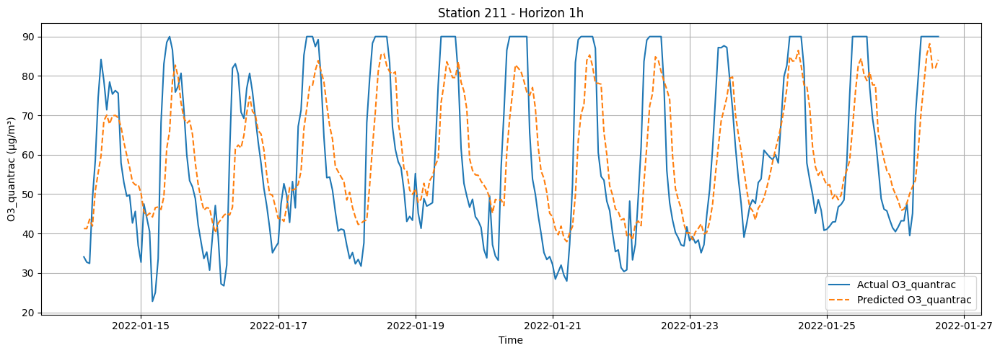

hour = 24
X_test_sid.shape: (577, 60)
y_test_sid.shape: (577, 1)
y_pred_sid.shape: (577,)


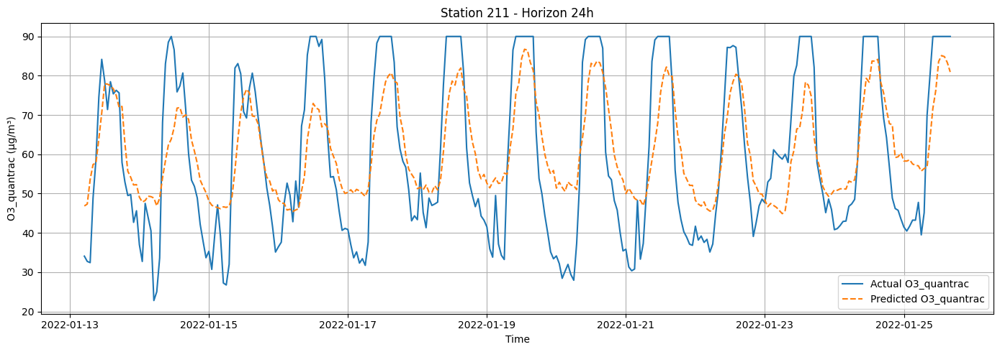

hour = 48
X_test_sid.shape: (574, 60)
y_test_sid.shape: (574, 1)
y_pred_sid.shape: (574,)


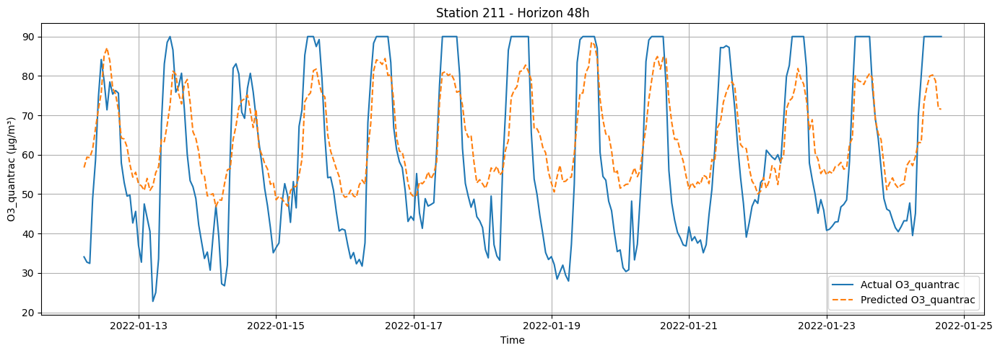

hour = 72
X_test_sid.shape: (570, 60)
y_test_sid.shape: (570, 1)
y_pred_sid.shape: (570,)


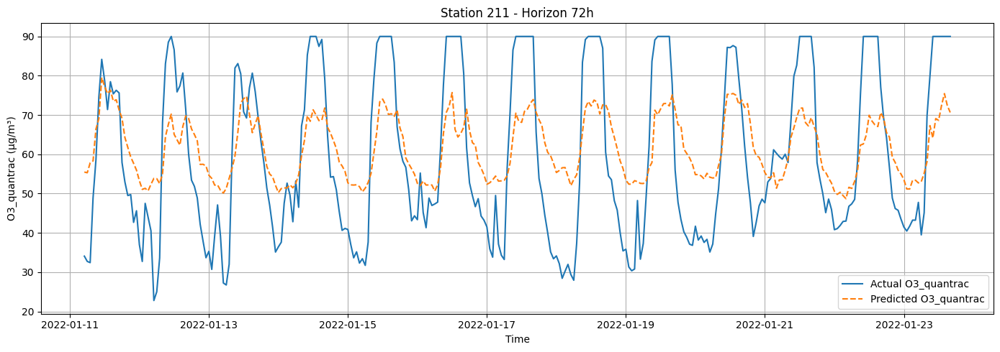

station_id = 212
hour = 1
X_test_sid.shape: (867, 60)
y_test_sid.shape: (867, 1)
y_pred_sid.shape: (867,)


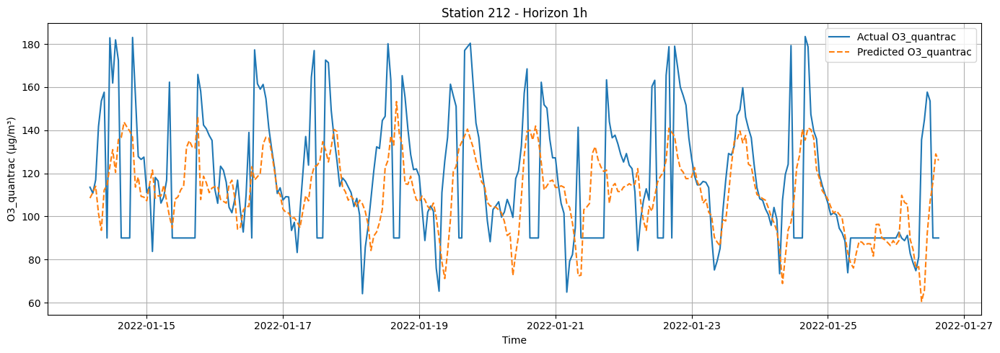

hour = 24
X_test_sid.shape: (864, 60)
y_test_sid.shape: (864, 1)
y_pred_sid.shape: (864,)


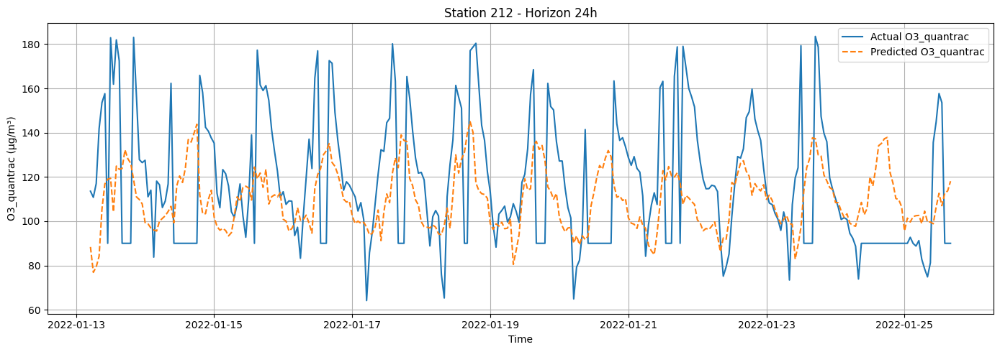

hour = 48
X_test_sid.shape: (860, 60)
y_test_sid.shape: (860, 1)
y_pred_sid.shape: (860,)


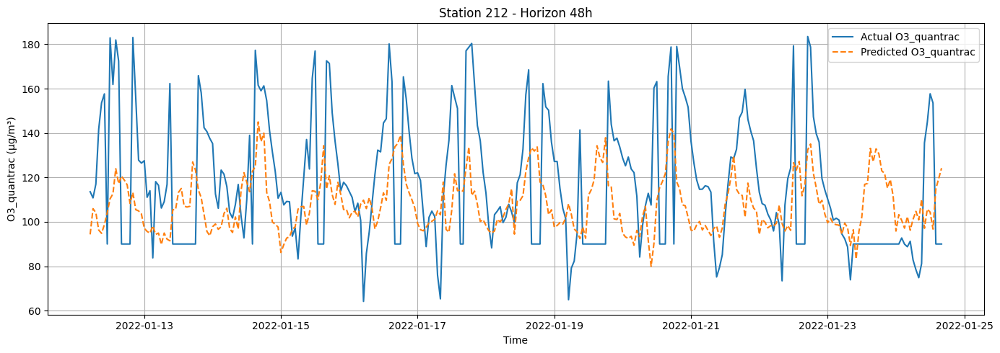

hour = 72
X_test_sid.shape: (857, 60)
y_test_sid.shape: (857, 1)
y_pred_sid.shape: (857,)


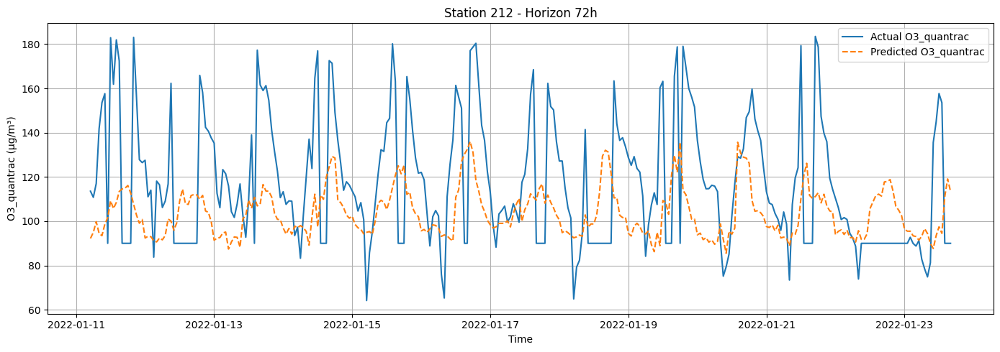

station_id = 213
hour = 1
X_test_sid.shape: (880, 60)
y_test_sid.shape: (880, 1)
y_pred_sid.shape: (880,)


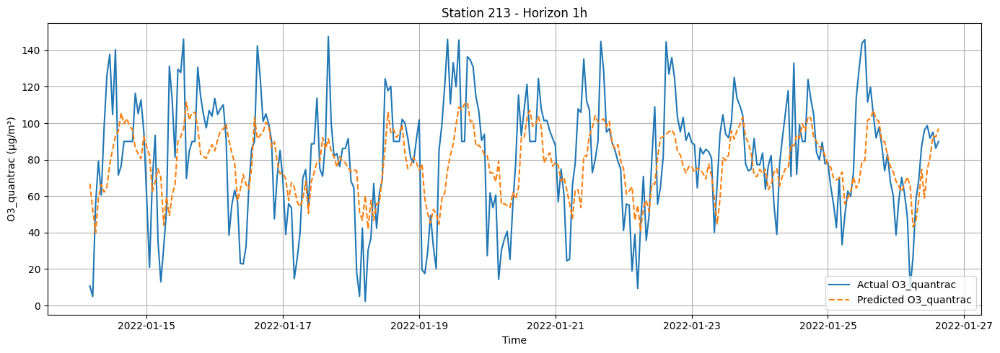

hour = 24
X_test_sid.shape: (876, 60)
y_test_sid.shape: (876, 1)
y_pred_sid.shape: (876,)


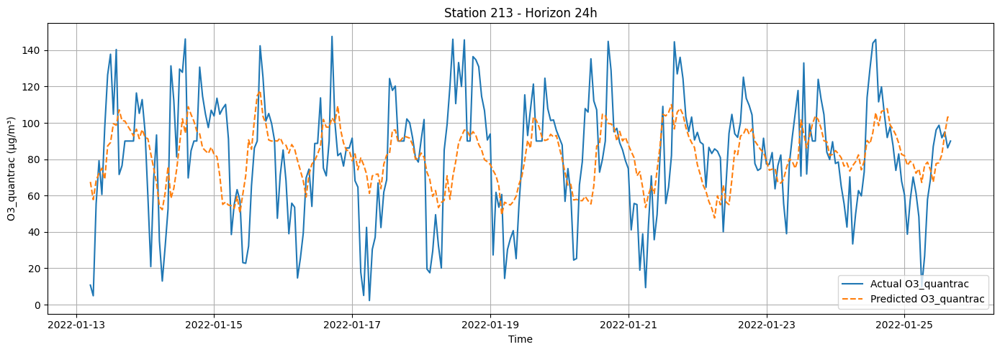

hour = 48
X_test_sid.shape: (873, 60)
y_test_sid.shape: (873, 1)
y_pred_sid.shape: (873,)


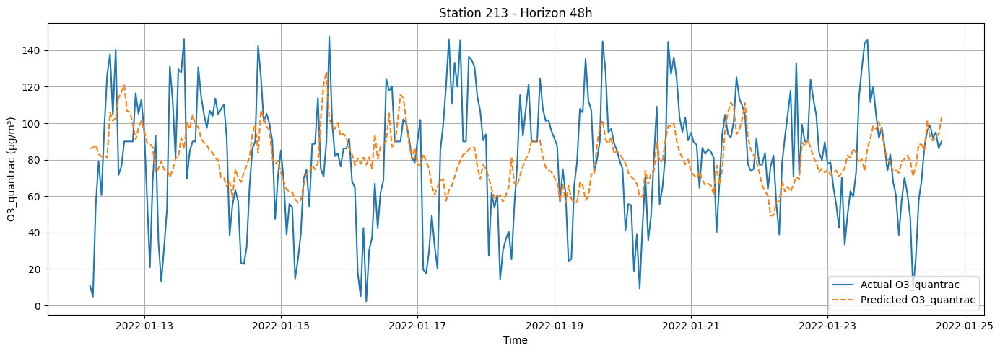

hour = 72
X_test_sid.shape: (869, 60)
y_test_sid.shape: (869, 1)
y_pred_sid.shape: (869,)


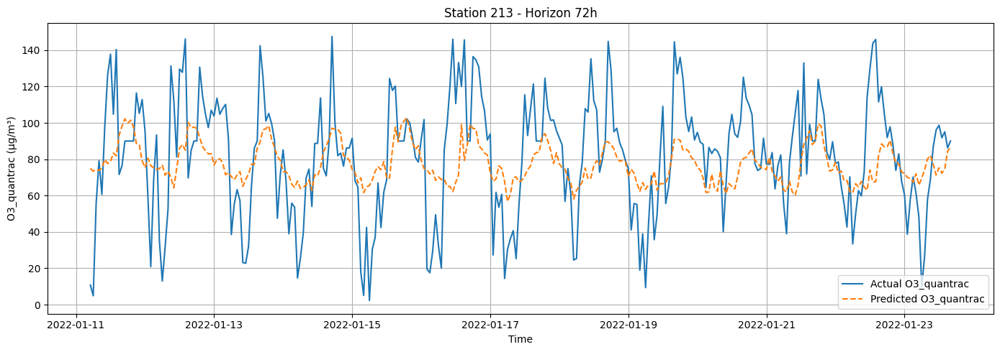

station_id = 214
hour = 1
X_test_sid.shape: (906, 60)
y_test_sid.shape: (906, 1)
y_pred_sid.shape: (906,)


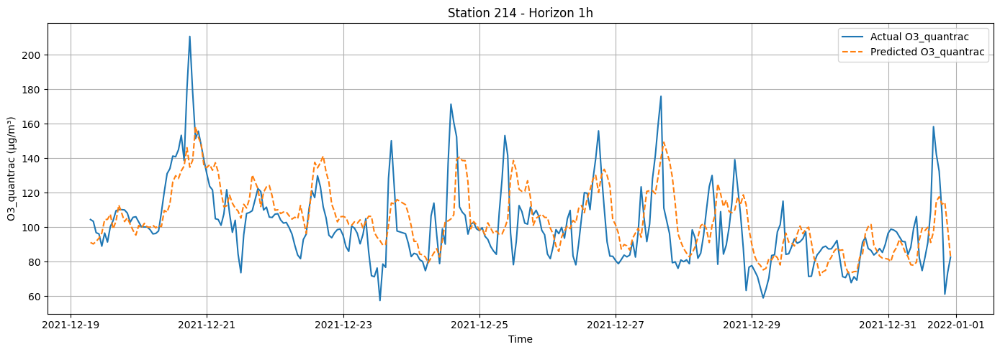

hour = 24
X_test_sid.shape: (902, 60)
y_test_sid.shape: (902, 1)
y_pred_sid.shape: (902,)


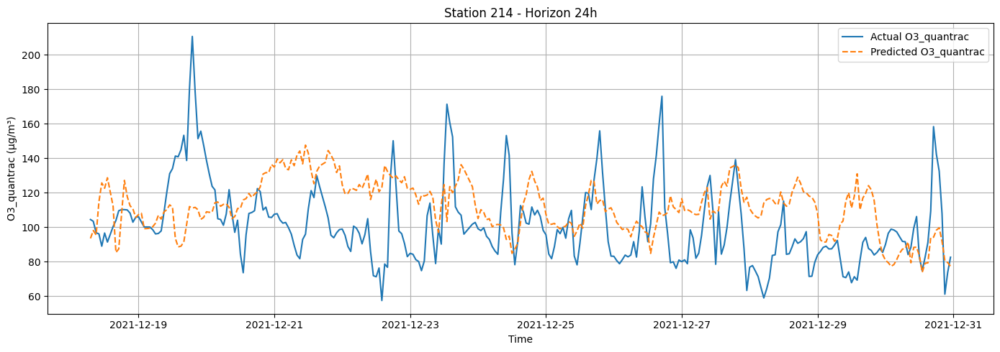

hour = 48
X_test_sid.shape: (899, 60)
y_test_sid.shape: (899, 1)
y_pred_sid.shape: (899,)


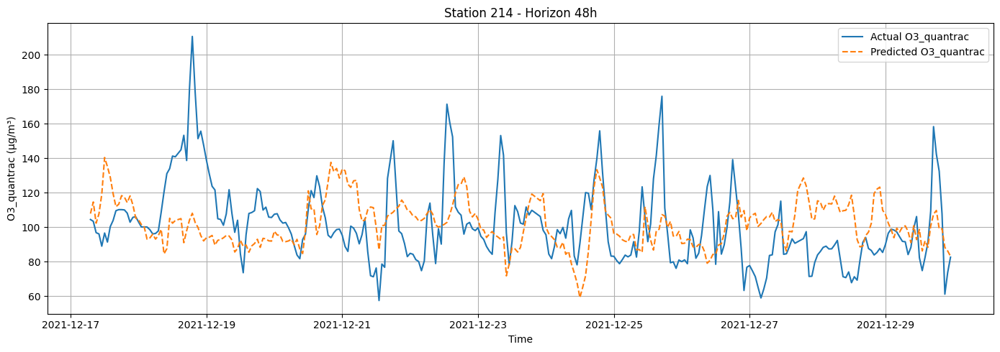

hour = 72
X_test_sid.shape: (895, 60)
y_test_sid.shape: (895, 1)
y_pred_sid.shape: (895,)


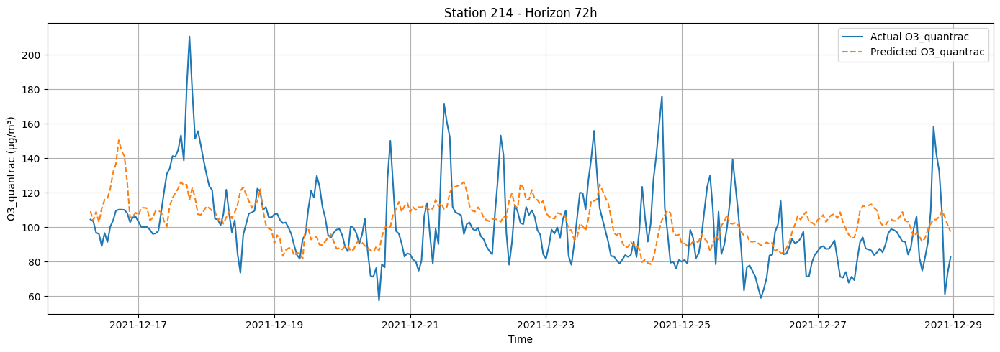

station_id = 215
hour = 1
X_test_sid.shape: (461, 60)
y_test_sid.shape: (461, 1)
y_pred_sid.shape: (461,)


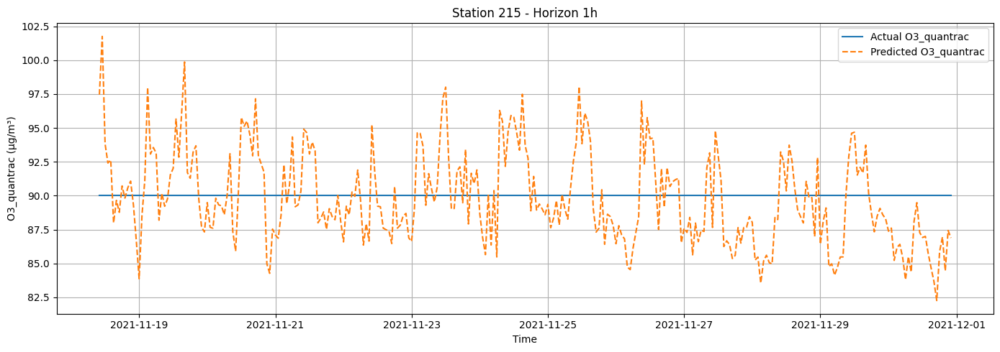

hour = 24
X_test_sid.shape: (458, 60)
y_test_sid.shape: (458, 1)
y_pred_sid.shape: (458,)


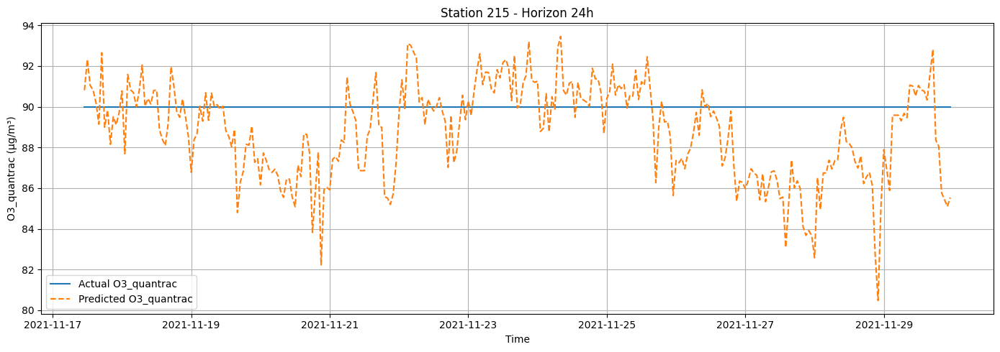

hour = 48
X_test_sid.shape: (454, 60)
y_test_sid.shape: (454, 1)
y_pred_sid.shape: (454,)


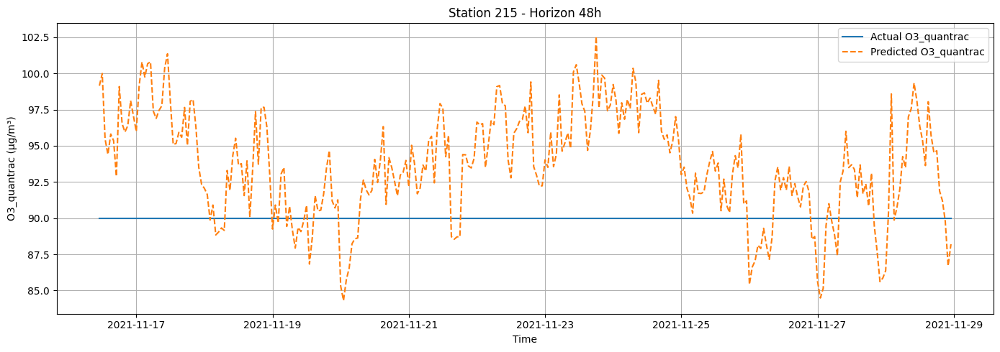

hour = 72
X_test_sid.shape: (450, 60)
y_test_sid.shape: (450, 1)
y_pred_sid.shape: (450,)


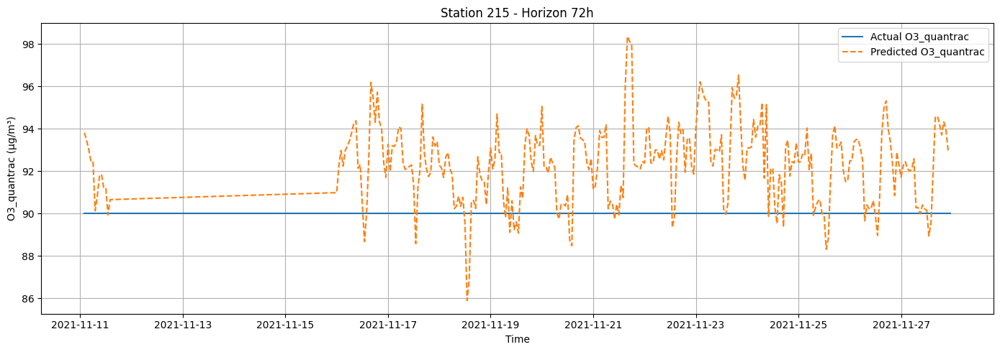

station_id = 216
hour = 1
X_test_sid.shape: (2046, 60)
y_test_sid.shape: (2046, 1)
y_pred_sid.shape: (2046,)


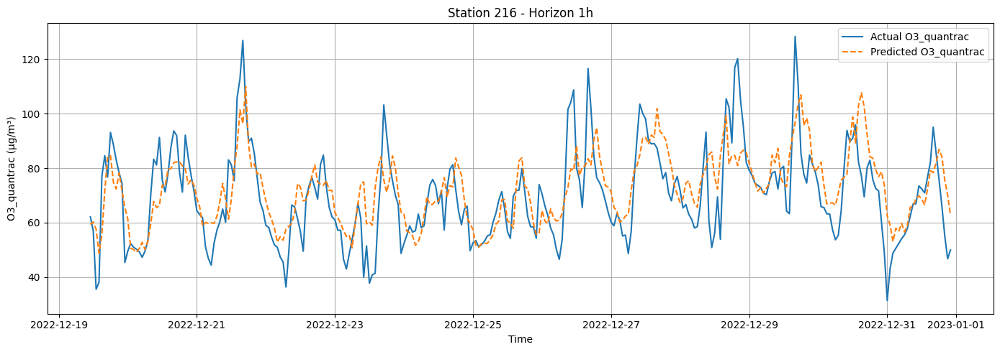

hour = 24
X_test_sid.shape: (2043, 60)
y_test_sid.shape: (2043, 1)
y_pred_sid.shape: (2043,)


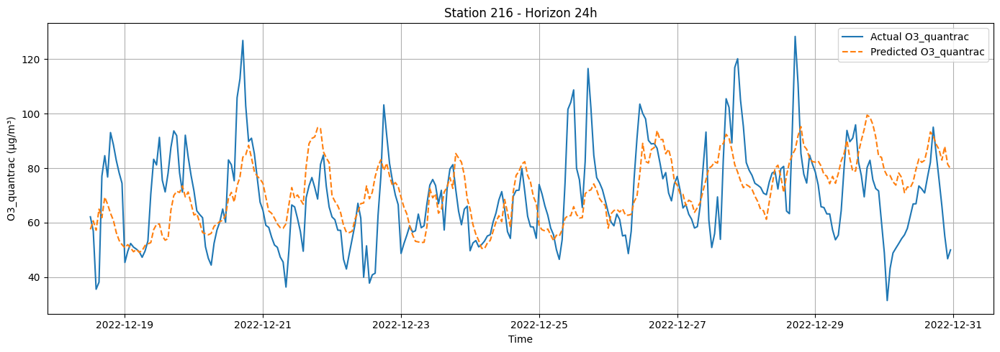

hour = 48
X_test_sid.shape: (2039, 60)
y_test_sid.shape: (2039, 1)
y_pred_sid.shape: (2039,)


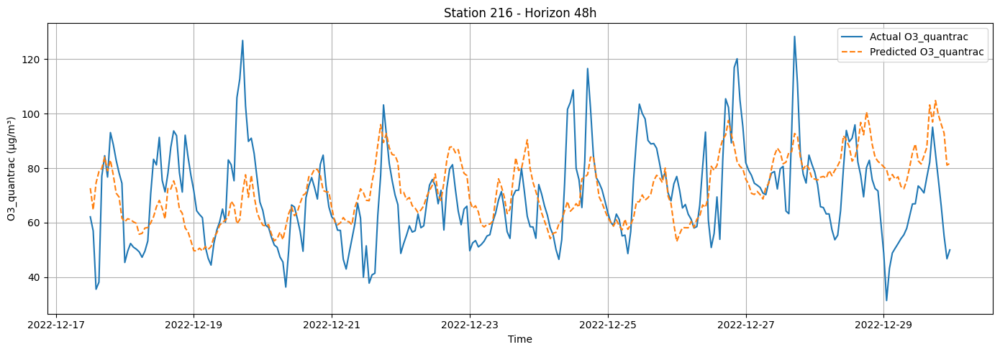

hour = 72
X_test_sid.shape: (2036, 60)
y_test_sid.shape: (2036, 1)
y_pred_sid.shape: (2036,)


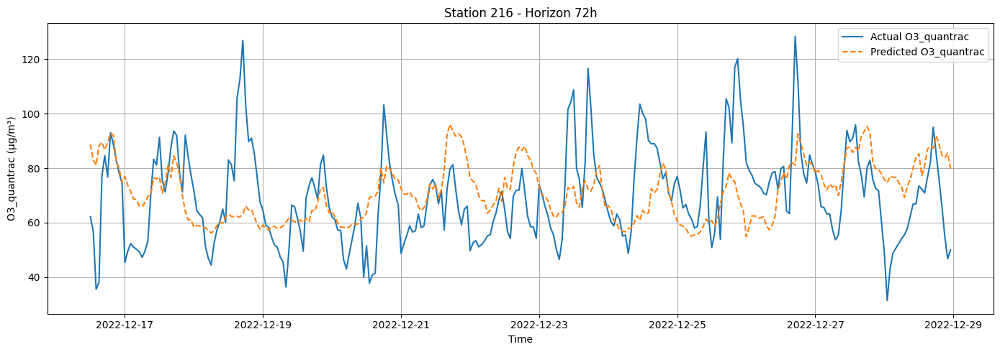

In [18]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_o3, o3_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for CO

In [19]:
label = "CO_quantrac"

# Add rolling features for LABEL
df_co = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
co_station_to_embedding, _ = learn_station_embeddings(df_co, target_col=label, station_col="station_id", embed_dim=4, LIGHTGBM_DIR=LIGHTGBM_DIR)
df_co, _ = attach_station_embedding(df_co, co_station_to_embedding, station_col="station_id")

# Print dataset
display(df_co)

# Start running model
co_all_metrics = []
co_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_co, horizon_h=h, target_col=label)
    co_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    co_all_metrics.append(metrics_by_station)

co_df_metrics_all = pd.concat(co_all_metrics, ignore_index=True)
co_df_metrics_all = co_df_metrics_all.sort_values(["station", "horizon_h"])
co_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
co_df_metrics_all

[Embed] epoch 001 | train MSE=1166936.2412 | val MSE=1140335.4564
[Embed] epoch 010 | train MSE=1133271.6681 | val MSE=1102984.0626
[Embed] epoch 020 | train MSE=1012663.1579 | val MSE=979906.9911
[Embed] epoch 030 | train MSE=839978.6087 | val MSE=808127.9540
[Embed] epoch 040 | train MSE=657308.5678 | val MSE=629350.8762
[Embed] epoch 050 | train MSE=502019.6377 | val MSE=479894.8422


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,CO_quantrac_roll24_mean,CO_quantrac_roll24_std,CO_quantrac_roll48_mean,CO_quantrac_roll48_std,CO_quantrac_roll72_mean,CO_quantrac_roll72_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,90.0000000000,NaN,90.0000000000,NaN,90.0000000000,NaN,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,645.3017645000,785.3152865656,645.3017645000,785.3152865656,645.3017645000,785.3152865656,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,822.8335096667,634.7539769726,822.8335096667,634.7539769726,822.8335096667,634.7539769726,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,639.6251322500,634.7201318253,639.6251322500,634.7201318253,639.6251322500,634.7201318253,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,1472.2937525476,516.9231499153,1674.4435738753,871.0825423549,1638.9403672351,846.4231143401,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,1485.6014108809,536.8199439348,1683.6060280420,876.3799781822,1637.2015848277,844.7171508487,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,1491.7654608809,545.5955779660,1679.6041738753,873.0368958297,1634.0107200129,841.7227222007,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,1526.4720886587,599.2656943825,1683.4985155420,877.5756900124,1644.8973561240,851.4061847858,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539



===== Training LightGBM for horizon = 1h, target_col = CO_quantrac =====

X.shape = (38254, 62)
y.shape = (38254, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
Humid_quantrac_lag48
Humid_quantrac_lag72
CO_quantr

,date,target
0,2022-01-02,727.0914538462
1,2022-01-03,756.2255041667
2,2022-01-04,753.0859416667
3,2022-01-05,749.9758250000
4,2022-01-06,767.3655791667
5,2022-01-07,756.1483083333
6,2022-01-08,759.4446500000
7,2022-01-09,727.0470708333
8,2022-01-10,735.6006875000
9,2022-01-11,731.8793708333


,date,target
0,2022-01-02,714.6232380544
1,2022-01-03,755.7835246878
2,2022-01-04,746.4519062673
3,2022-01-05,750.4160937037
4,2022-01-06,742.1943535833
5,2022-01-07,749.9061497298
6,2022-01-08,736.1103210344
7,2022-01-09,719.0171599070
8,2022-01-10,734.4345747303
9,2022-01-11,726.8366759319


sid = 212, grp =                     date  station_id  y_true          y_pred
8781 2021-11-19 17:00:00         212    90.0  112.8029096486
8782 2021-11-19 18:00:00         212    90.0  107.2801584008
8783 2021-11-19 19:00:00         212    90.0   94.0152282323
8784 2021-11-19 20:00:00         212    90.0   76.7537505497
8785 2021-11-19 21:00:00         212    90.0   93.4536030772
...                  ...         ...     ...             ...
9643 2022-01-26 11:00:00         212     0.0   37.0886273706
9644 2022-01-26 12:00:00         212     0.0   40.2721845521
9645 2022-01-26 13:00:00         212    90.0   42.5732986365
9646 2022-01-26 14:00:00         212    90.0   80.9182310236
9647 2022-01-26 15:00:00         212    90.0  116.0459730768

[867 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.da

,date,target
0,2021-11-20,82.5000000000
1,2021-11-21,90.0000000000
2,2021-11-23,82.5000000000
3,2021-11-24,75.0000000000
4,2021-11-25,82.5000000000
5,2021-11-26,73.4045672647
6,2021-11-27,90.0000000000
7,2021-11-28,78.7500000000
8,2021-11-29,86.2500000000
9,2021-11-30,90.0000000000


,date,target
0,2021-11-20,89.2242261560
1,2021-11-21,81.8328658511
2,2021-11-23,94.0210970757
3,2021-11-24,81.8960725542
4,2021-11-25,80.9546924751
5,2021-11-26,93.6497100848
6,2021-11-27,92.5889580943
7,2021-11-28,81.9829191650
8,2021-11-29,93.4308805032
9,2021-11-30,110.9331262035


sid = 213, grp =                      date  station_id        y_true           y_pred
14631 2021-12-20 20:00:00         213  1601.1530000  1450.7886346307
14632 2021-12-20 21:00:00         213  1306.4400000  1250.9242149778
14633 2021-12-20 22:00:00         213   992.8180000  1002.0139844317
14634 2021-12-20 23:00:00         213   957.6740000   928.7108191335
14635 2021-12-21 00:00:00         213   938.9430508   872.8073949308
...                   ...         ...           ...              ...
15506 2022-01-26 11:00:00         213   829.5130000  1029.4462043024
15507 2022-01-26 12:00:00         213   732.4850000   954.4975984838
15508 2022-01-26 13:00:00         213   747.0010000   887.5101259952
15509 2022-01-26 14:00:00         213  1143.5170000   875.3530303541
15510 2022-01-26 15:00:00         213  1573.2942860   995.7628639611

[880 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), da

,date,target
0,2021-12-21,1255.2726377000
1,2021-12-22,1226.0980621458
2,2021-12-23,1124.3997344708
3,2021-12-24,1388.4261791773
4,2021-12-25,1471.1421595833
5,2021-12-26,793.1582542333
6,2021-12-27,1182.8786234348
7,2021-12-28,1278.5494959478
8,2021-12-29,1033.0129788333
9,2021-12-30,788.3413043792


,date,target
0,2021-12-21,1141.1897645781
1,2021-12-22,1005.0159200791
2,2021-12-23,1158.4486516752
3,2021-12-24,1101.7005549759
4,2021-12-25,1319.5260581619
5,2021-12-26,977.6039952740
6,2021-12-27,1062.8262988334
7,2021-12-28,1157.5091720675
8,2021-12-29,1136.5052636005
9,2021-12-30,910.9983030901


sid = 214, grp =                      date  station_id       y_true           y_pred
20640 2021-11-23 16:00:00         214    90.000000   854.6828011606
20641 2021-11-23 17:00:00         214    90.000000   798.0462391139
20642 2021-11-23 18:00:00         214    90.000000   873.1318818267
20643 2021-11-23 19:00:00         214    90.000000   829.8839680172
20644 2021-11-23 20:00:00         214    90.000000   828.5065815841
...                   ...         ...          ...              ...
21541 2021-12-31 18:00:00         214  2896.897000  1062.7192275379
21542 2021-12-31 19:00:00         214  2935.670000  1105.6288975313
21543 2021-12-31 20:00:00         214  1193.962222  1212.4650927965
21544 2021-12-31 21:00:00         214  1136.068000  1153.2192435701
21545 2021-12-31 22:00:00         214   957.101000  1132.5770725323

[906 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26), datetime.date(

,date,target
0,2021-11-24,1165.0799075542
1,2021-11-25,924.4349433917
2,2021-11-26,839.7307195375
3,2021-11-27,934.1588303542
4,2021-11-28,968.3780071917
5,2021-11-29,890.8086436167
6,2021-11-30,941.4998904292
7,2021-12-01,959.7216568125
8,2021-12-02,1142.7490615042
9,2021-12-03,937.3608743167


,date,target
0,2021-11-24,914.9758095212
1,2021-11-25,1010.2397361337
2,2021-11-26,876.6272969872
3,2021-11-27,876.8002579341
4,2021-11-28,907.3009964409
5,2021-11-29,896.9517059540
6,2021-11-30,882.0773324641
7,2021-12-01,961.8764558302
8,2021-12-02,963.4700954314
9,2021-12-03,958.4101884038


sid = 215, grp =                      date  station_id    y_true          y_pred
24155 2021-11-07 08:00:00         215  720.7385  788.5187904695
24156 2021-11-07 09:00:00         215  726.4876  767.3139022528
24157 2021-11-07 10:00:00         215  752.3108  765.8204626724
24158 2021-11-07 11:00:00         215  765.1460  787.5329002417
24159 2021-11-07 12:00:00         215  754.2972  788.5099183554
...                   ...         ...       ...             ...
24611 2021-11-30 18:00:00         215  816.5250  813.3899989699
24612 2021-11-30 19:00:00         215  787.7604  789.9343378430
24613 2021-11-30 20:00:00         215  783.7112  737.2875248261
24614 2021-11-30 21:00:00         215  739.8194  722.2306161691
24615 2021-11-30 22:00:00         215  754.7174  677.7361455925

[461 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(2021, 11, 16), datetim

,date,target
0,2021-11-07,738.6053562500
1,2021-11-08,723.7769916667
2,2021-11-09,798.0499281250
3,2021-11-10,744.9222833333
4,2021-11-11,787.2166866667
5,2021-11-16,770.7351375000
6,2021-11-17,827.5321708333
7,2021-11-18,839.7792500000
8,2021-11-19,791.3257333333
9,2021-11-20,840.2953652174


,date,target
0,2021-11-07,746.8372856262
1,2021-11-08,744.0897140967
2,2021-11-09,791.4488611741
3,2021-11-10,777.4402266987
4,2021-11-11,783.9202954322
5,2021-11-16,769.9059501978
6,2021-11-17,801.1230427470
7,2021-11-18,816.7923048428
8,2021-11-19,823.0262393011
9,2021-11-20,801.0760225674


sid = 216, grp =                      date  station_id           y_true           y_pred
36208 2022-09-20 19:00:00         216  1619.0904666667  1694.0025855029
36209 2022-09-20 20:00:00         216  1787.0966666667  1502.8882745001
36210 2022-09-20 21:00:00         216  2523.3422666667  1604.7445298027
36211 2022-09-20 22:00:00         216  1585.6421333333  1294.9552739424
36212 2022-09-20 23:00:00         216   789.5276923077  1220.5798541637
...                   ...         ...              ...              ...
38249 2022-12-31 18:00:00         216  2393.5627333333  1844.8548021882
38250 2022-12-31 19:00:00         216  2301.0542000000  1683.2664426059
38251 2022-12-31 20:00:00         216  2773.9180666667  1892.4744325155
38252 2022-12-31 21:00:00         216  1698.9842000000  1781.6400374908
38253 2022-12-31 22:00:00         216  1492.1779333333  1434.5581796880

[2046 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22

,date,target
0,2022-09-21,1000.3263524109
1,2022-09-22,1112.2177892034
2,2022-09-23,1497.8803327422
3,2022-09-24,1459.5626654960
4,2022-09-25,1405.2064474786
...,...,...
82,2022-12-27,2316.5350419382
83,2022-12-28,2149.8431217671
84,2022-12-29,1551.6000178437
85,2022-12-30,1930.1186924252


,date,target
0,2022-09-21,1142.3824905563
1,2022-09-22,1227.0661277588
2,2022-09-23,1297.7663090522
3,2022-09-24,1246.4665891751
4,2022-09-25,1410.4399319760
...,...,...
82,2022-12-27,2180.4022289299
83,2022-12-28,2274.5822576078
84,2022-12-29,2029.6535736566
85,2022-12-30,2029.0095034543


Overall test metrics: {'rmse': 392.53, 'mae': 234.73, 'mape': 29.41, 'mnbe': -12.78, 'r': 0.85, 'n_samples': 5741}

===== Training LightGBM for horizon = 24h, target_col = CO_quantrac =====

X.shape = (38116, 62)
y.shape = (38116, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_la

,date,target
0,2022-01-02,755.2617500000
1,2022-01-03,753.2976333333
2,2022-01-04,750.2822208333
3,2022-01-05,767.1594583333
4,2022-01-06,756.0671333333
5,2022-01-07,760.1601041667
6,2022-01-08,727.2762708333
7,2022-01-09,735.5497541667
8,2022-01-10,730.7214333333
9,2022-01-11,744.8777166667


,date,target
0,2022-01-02,713.7341929179
1,2022-01-03,773.2996794252
2,2022-01-04,777.0250240626
3,2022-01-05,712.1676530776
4,2022-01-06,719.2727715792
5,2022-01-07,718.7047533615
6,2022-01-08,718.5860200166
7,2022-01-09,719.2563151000
8,2022-01-10,779.9172749099
9,2022-01-11,783.3407401109


sid = 212, grp =                     date  station_id  y_true          y_pred
8738 2021-11-18 21:00:00         212    90.0  114.5395012625
8739 2021-11-18 22:00:00         212    90.0  114.5395012625
8740 2021-11-18 23:00:00         212    90.0  114.5395012625
8741 2021-11-19 00:00:00         212    90.0  114.5395012625
8742 2021-11-19 01:00:00         212    90.0  114.5395012625
...                  ...         ...     ...             ...
9597 2022-01-25 12:00:00         212     0.0  140.9486719644
9598 2022-01-25 13:00:00         212     0.0  140.9486719644
9599 2022-01-25 14:00:00         212    90.0  140.9486719644
9600 2022-01-25 15:00:00         212    90.0  131.6966119468
9601 2022-01-25 16:00:00         212    90.0  131.6966119468

[864 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.da

,date,target
0,2021-11-19,82.5000000000
1,2021-11-20,90.0000000000
2,2021-11-21,82.5000000000
3,2021-11-23,75.0000000000
4,2021-11-24,82.5000000000
5,2021-11-25,73.4045672647
6,2021-11-26,90.0000000000
7,2021-11-27,78.7500000000
8,2021-11-28,86.2500000000
9,2021-11-29,90.0000000000


,date,target
0,2021-11-19,111.0105131815
1,2021-11-20,113.1733853020
2,2021-11-21,116.0791650819
3,2021-11-23,118.8643925468
4,2021-11-24,111.6519206557
5,2021-11-25,112.7746661764
6,2021-11-26,111.2337296986
7,2021-11-27,115.4179146191
8,2021-11-28,113.9042836834
9,2021-11-29,113.1272845039


sid = 213, grp =                      date  station_id        y_true          y_pred
14566 2021-12-20 01:00:00         213   938.9430508  792.9230840381
14567 2021-12-20 02:00:00         213  1497.3752540  768.0252985663
14568 2021-12-20 03:00:00         213  1953.3570000  776.7079345201
14569 2021-12-20 04:00:00         213  1948.7730000  820.5441430653
14570 2021-12-20 05:00:00         213  2270.0350000  853.9139655166
...                   ...         ...           ...             ...
15437 2022-01-25 12:00:00         213   829.5130000  977.5173647936
15438 2022-01-25 13:00:00         213   732.4850000  979.7084468279
15439 2022-01-25 14:00:00         213   747.0010000  927.3980071407
15440 2022-01-25 15:00:00         213  1143.5170000  904.9419013115
15441 2022-01-25 16:00:00         213  1573.2942860  919.3320821348

[876 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), datetime.date(

,date,target
0,2021-12-20,1284.8370132522
1,2021-12-21,1195.2436038125
2,2021-12-22,1144.2716928042
3,2021-12-23,1405.1436501208
4,2021-12-24,1443.5384167727
5,2021-12-25,818.6249209000
6,2021-12-26,1158.5573057917
7,2021-12-27,1278.5494959478
8,2021-12-28,1058.9677605217
9,2021-12-29,785.7946377125


,date,target
0,2021-12-20,886.1196323619
1,2021-12-21,1044.0208608358
2,2021-12-22,989.4561301860
3,2021-12-23,937.2234108369
4,2021-12-24,1035.2281445536
5,2021-12-25,944.1613103513
6,2021-12-26,834.0361195808
7,2021-12-27,944.5586965059
8,2021-12-28,1170.1224255904
9,2021-12-29,960.4346385216


sid = 214, grp =                      date  station_id        y_true           y_pred
20552 2021-11-22 21:00:00         214    90.0000000   774.1172874676
20553 2021-11-22 22:00:00         214  1624.7252830   927.7776720443
20554 2021-11-22 23:00:00         214   954.2496429   826.8237403685
20555 2021-11-23 00:00:00         214   650.3550000   734.6988600002
20556 2021-11-23 01:00:00         214   625.9070000   690.4540463115
...                   ...         ...           ...              ...
21449 2021-12-30 19:00:00         214  2896.8970000  1189.8195847233
21450 2021-12-30 20:00:00         214  2935.6700000  1159.7689562515
21451 2021-12-30 21:00:00         214  1193.9622220  1056.4061379165
21452 2021-12-30 22:00:00         214  1136.0680000   910.9762890660
21453 2021-12-30 23:00:00         214   957.1010000   906.8665477635

[902 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), da

,date,target
0,2021-11-23,1145.2795742208
1,2021-11-24,949.0102767250
2,2021-11-25,834.8522612042
3,2021-11-26,926.0970386875
4,2021-11-27,972.0149655250
5,2021-11-28,900.5416852833
6,2021-11-29,927.0953070958
7,2021-11-30,959.1088651458
8,2021-12-01,1143.2871672750
9,2021-12-02,946.0703518792


,date,target
0,2021-11-23,850.5851604009
1,2021-11-24,831.0616620699
2,2021-11-25,866.4126389753
3,2021-11-26,846.8278752971
4,2021-11-27,818.1139857156
5,2021-11-28,819.4495767914
6,2021-11-29,870.6291959481
7,2021-11-30,872.8785718088
8,2021-12-01,824.2628135661
9,2021-12-02,859.1935440860


sid = 215, grp =                      date  station_id    y_true          y_pred
24043 2021-11-06 12:00:00         215  765.1460  718.1864392537
24044 2021-11-06 13:00:00         215  754.2972  718.1864392537
24045 2021-11-06 14:00:00         215  739.5329  720.1344327480
24046 2021-11-06 15:00:00         215  733.9939  722.3223130629
24047 2021-11-06 16:00:00         215  734.9489  728.1512346162
...                   ...         ...       ...             ...
24496 2021-11-29 19:00:00         215  816.5250  837.7117118956
24497 2021-11-29 20:00:00         215  787.7604  784.7328800789
24498 2021-11-29 21:00:00         215  783.7112  775.2292036352
24499 2021-11-29 22:00:00         215  739.8194  787.6381698591
24500 2021-11-29 23:00:00         215  754.7174  778.6190464681

[458 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime

,date,target
0,2021-11-06,744.1773833333
1,2021-11-07,723.1013291667
2,2021-11-08,797.6798656250
3,2021-11-09,744.9732166667
4,2021-11-10,776.1213375000
5,2021-11-11,776.8784933333
6,2021-11-16,827.4358750000
7,2021-11-17,835.3440708333
8,2021-11-18,796.6140458333
9,2021-11-19,835.2636916667


,date,target
0,2021-11-06,725.7147612577
1,2021-11-07,717.9390186472
2,2021-11-08,775.3612739021
3,2021-11-09,773.3286885847
4,2021-11-10,724.8673235442
5,2021-11-11,726.3612748019
6,2021-11-16,796.5212210656
7,2021-11-17,732.1024200684
8,2021-11-18,752.1306321395
9,2021-11-19,754.2165467299


sid = 216, grp =                      date  station_id           y_true           y_pred
36073 2022-09-19 23:00:00         216  1585.6421333333  1545.0225261436
36074 2022-09-20 00:00:00         216   789.5276923077  1029.3598663683
36075 2022-09-20 01:00:00         216   623.8159245283   925.4108500168
36076 2022-09-20 02:00:00         216   529.0570666667   869.8452087050
36077 2022-09-20 03:00:00         216   574.7379333333   796.0987507157
...                   ...         ...              ...              ...
38111 2022-12-30 19:00:00         216  2393.5627333333  1674.4354753256
38112 2022-12-30 20:00:00         216  2301.0542000000  1825.5207695886
38113 2022-12-30 21:00:00         216  2773.9180666667  1867.5403157772
38114 2022-12-30 22:00:00         216  1698.9842000000  1668.3457076789
38115 2022-12-30 23:00:00         216  1492.1779333333  1689.2623706789

[2043 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21

,date,target
0,2022-09-20,1004.9674618126
1,2022-09-21,1110.1471780922
2,2022-09-22,1428.8971271866
3,2022-09-23,1517.5716321626
4,2022-09-24,1382.7482808119
...,...,...
82,2022-12-26,2373.7316919382
83,2022-12-27,2158.1972412116
84,2022-12-28,1552.5238289548
85,2022-12-29,1900.4054229807


,date,target
0,2022-09-20,1336.2328901184
1,2022-09-21,1388.0583595119
2,2022-09-22,1313.3726748790
3,2022-09-23,1267.8047479528
4,2022-09-24,1318.9869098997
...,...,...
82,2022-12-26,1856.3072509228
83,2022-12-27,1958.0433538340
84,2022-12-28,1944.0613866276
85,2022-12-29,1771.8083098658


Overall test metrics: {'rmse': 475.64, 'mae': 286.35, 'mape': 34.85, 'mnbe': -16.17, 'r': 0.77, 'n_samples': 5720}

===== Training LightGBM for horizon = 48h, target_col = CO_quantrac =====

X.shape = (37972, 62)
y.shape = (37972, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_la

,date,target
0,2022-01-01,755.2617500000
1,2022-01-02,753.2976333333
2,2022-01-03,750.2822208333
3,2022-01-04,767.1594583333
4,2022-01-05,756.0671333333
5,2022-01-06,760.1601041667
6,2022-01-07,727.2762708333
7,2022-01-08,735.5497541667
8,2022-01-09,730.7214333333
9,2022-01-10,744.8777166667


,date,target
0,2022-01-01,740.1240655667
1,2022-01-02,767.9849075581
2,2022-01-03,751.4539243666
3,2022-01-04,717.9057316813
4,2022-01-05,721.0849861056
5,2022-01-06,719.5847773192
6,2022-01-07,720.6003061089
7,2022-01-08,730.2463916340
8,2022-01-09,783.4793293939
9,2022-01-10,759.1639441714


sid = 212, grp =                     date  station_id  y_true          y_pred
8694 2021-11-18 01:00:00         212    90.0  111.1137366986
8695 2021-11-18 02:00:00         212    90.0  111.1137366986
8696 2021-11-18 03:00:00         212    90.0  111.1137366986
8697 2021-11-18 04:00:00         212    90.0  111.1137366986
8698 2021-11-18 05:00:00         212    90.0  111.1137366986
...                  ...         ...     ...             ...
9549 2022-01-24 12:00:00         212     0.0  167.2853082747
9550 2022-01-24 13:00:00         212     0.0  167.2853082747
9551 2022-01-24 14:00:00         212    90.0  172.7054337045
9552 2022-01-24 15:00:00         212    90.0  170.6546606888
9553 2022-01-24 16:00:00         212    90.0  170.6546606888

[860 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.da

,date,target
0,2021-11-18,82.1739130435
1,2021-11-19,90.0000000000
2,2021-11-20,82.5000000000
3,2021-11-21,75.0000000000
4,2021-11-23,82.5000000000
5,2021-11-24,73.4045672647
6,2021-11-25,90.0000000000
7,2021-11-26,78.7500000000
8,2021-11-27,86.2500000000
9,2021-11-28,90.0000000000


,date,target
0,2021-11-18,110.5189423367
1,2021-11-19,110.9709698133
2,2021-11-20,111.1137366986
3,2021-11-21,113.8200551389
4,2021-11-23,130.0233750076
5,2021-11-24,119.3387538473
6,2021-11-25,110.9711810688
7,2021-11-26,110.5437254351
8,2021-11-27,113.3690020655
9,2021-11-28,113.2525218441


sid = 213, grp =                      date  station_id       y_true           y_pred
14497 2021-12-19 04:00:00         213  1948.773000   759.5344819260
14498 2021-12-19 05:00:00         213  2270.035000   874.1909697897
14499 2021-12-19 06:00:00         213  2631.598000   941.8543063710
14500 2021-12-19 07:00:00         213  3180.341000   939.1636636604
14501 2021-12-19 08:00:00         213  2380.433000   917.4145035962
...                   ...         ...          ...              ...
15365 2022-01-24 12:00:00         213   829.513000   972.2412158185
15366 2022-01-24 13:00:00         213   732.485000  1004.7952250292
15367 2022-01-24 14:00:00         213   747.001000   901.8926646250
15368 2022-01-24 15:00:00         213  1143.517000   932.2061097282
15369 2022-01-24 16:00:00         213  1573.294286   944.2136381883

[873 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(

,date,target
0,2021-12-19,1258.0788000000
1,2021-12-20,1195.2436038125
2,2021-12-21,1144.2716928042
3,2021-12-22,1405.1436501208
4,2021-12-23,1423.3112273750
5,2021-12-24,783.8806278909
6,2021-12-25,1158.5573057917
7,2021-12-26,1272.0877867417
8,2021-12-27,1029.0801311739
9,2021-12-28,801.0007958739


,date,target
0,2021-12-19,875.2978427402
1,2021-12-20,839.1966019763
2,2021-12-21,967.9817554043
3,2021-12-22,946.4420884240
4,2021-12-23,972.7272421861
5,2021-12-24,956.7040421574
6,2021-12-25,1084.8929970362
7,2021-12-26,979.7199591500
8,2021-12-27,955.4051061443
9,2021-12-28,1121.2511192332


sid = 214, grp =                      date  station_id       y_true           y_pred
20459 2021-11-22 00:00:00         214   650.355000   733.4168098774
20460 2021-11-22 01:00:00         214   625.907000   720.5971467126
20461 2021-11-22 02:00:00         214   774.887000   719.3434370335
20462 2021-11-22 03:00:00         214  1242.123673   751.7255540357
20463 2021-11-22 04:00:00         214  1351.114576   711.5607757425
...                   ...         ...          ...              ...
21353 2021-12-29 19:00:00         214  2896.897000  1196.9253229169
21354 2021-12-29 20:00:00         214  2935.670000  1126.1032747824
21355 2021-12-29 21:00:00         214  1193.962222  1102.5411769318
21356 2021-12-29 22:00:00         214  1136.068000   935.7636205097
21357 2021-12-29 23:00:00         214   957.101000   911.0331937264

[899 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(

,date,target
0,2021-11-22,1145.2795742208
1,2021-11-23,949.0102767250
2,2021-11-24,834.8522612042
3,2021-11-25,926.0970386875
4,2021-11-26,972.0149655250
5,2021-11-27,900.5416852833
6,2021-11-28,927.0953070958
7,2021-11-29,959.1088651458
8,2021-11-30,1143.2871672750
9,2021-12-01,946.0703518792


,date,target
0,2021-11-22,813.9347327291
1,2021-11-23,780.9060310532
2,2021-11-24,817.2478157780
3,2021-11-25,831.5018541533
4,2021-11-26,831.9617471476
5,2021-11-27,793.7742126411
6,2021-11-28,826.4734381092
7,2021-11-29,859.7959757786
8,2021-11-30,816.5128599185
9,2021-12-01,799.4197957435


sid = 215, grp =                      date  station_id    y_true          y_pred
23927 2021-11-05 16:00:00         215  734.9489  736.0363698441
23928 2021-11-05 17:00:00         215  768.0301  742.9311275729
23929 2021-11-05 18:00:00         215  770.3030  742.4199318981
23930 2021-11-05 19:00:00         215  780.8080  728.2994466864
23931 2021-11-05 20:00:00         215  757.5824  745.2853528627
...                   ...         ...       ...             ...
24376 2021-11-28 19:00:00         215  816.5250  786.0332084664
24377 2021-11-28 20:00:00         215  787.7604  751.7826739594
24378 2021-11-28 21:00:00         215  783.7112  743.1255484715
24379 2021-11-28 22:00:00         215  739.8194  735.1870448045
24380 2021-11-28 23:00:00         215  754.7174  732.2158084973

[454 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.

,date,target
0,2021-11-06,723.1013291667
1,2021-11-07,797.6798656250
2,2021-11-08,744.9732166667
3,2021-11-09,776.1213375000
4,2021-11-10,788.1575208333
5,2021-11-11,839.7238600000
6,2021-11-16,835.3440708333
7,2021-11-17,796.6140458333
8,2021-11-18,835.2636916667
9,2021-11-19,677.3822844583


,date,target
0,2021-11-06,730.9175994621
1,2021-11-07,757.9482877090
2,2021-11-08,740.9966034756
3,2021-11-09,717.3035037160
4,2021-11-10,728.6680170090
5,2021-11-11,739.9370337992
6,2021-11-16,739.3607066997
7,2021-11-17,743.7214936885
8,2021-11-18,750.3631961390
9,2021-11-19,753.7625664492


sid = 216, grp =                      date  station_id           y_true           y_pred
35933 2022-09-19 03:00:00         216   574.7379333333   955.0261704916
35934 2022-09-19 04:00:00         216   592.5133333333   902.1916949557
35935 2022-09-19 05:00:00         216   684.2573333333  1029.3249735980
35936 2022-09-19 06:00:00         216   847.8674666667  1349.3743108658
35937 2022-09-19 07:00:00         216  1299.8978000000  1730.3555977643
...                   ...         ...              ...              ...
37967 2022-12-29 19:00:00         216  2393.5627333333  1679.5671490785
37968 2022-12-29 20:00:00         216  2301.0542000000  1855.8878083410
37969 2022-12-29 21:00:00         216  2773.9180666667  1904.4375631815
37970 2022-12-29 22:00:00         216  1698.9842000000  1838.7131523090
37971 2022-12-29 23:00:00         216  1492.1779333333  1569.1548384984

[2039 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21

,date,target
0,2022-09-19,1056.0389714286
1,2022-09-20,1110.1471780922
2,2022-09-21,1428.8971271866
3,2022-09-22,1517.5716321626
4,2022-09-23,1382.7482808119
...,...,...
82,2022-12-25,2373.7316919382
83,2022-12-26,2158.1972412116
84,2022-12-27,1552.5238289548
85,2022-12-28,1900.4054229807


,date,target
0,2022-09-19,1485.1430206411
1,2022-09-20,1356.7329110491
2,2022-09-21,1321.9760832735
3,2022-09-22,1254.6906005154
4,2022-09-23,1364.7563204758
...,...,...
82,2022-12-25,1667.3593124868
83,2022-12-26,1742.0673607122
84,2022-12-27,1844.7783298469
85,2022-12-28,1755.0716114738


Overall test metrics: {'rmse': 485.41, 'mae': 293.38, 'mape': 35.55, 'mnbe': -15.48, 'r': 0.77, 'n_samples': 5699}

===== Training LightGBM for horizon = 72h, target_col = CO_quantrac =====

X.shape = (37828, 62)
y.shape = (37828, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_la

,date,target
0,2021-11-30,755.2617500000
1,2022-01-01,753.2976333333
2,2022-01-02,750.2822208333
3,2022-01-03,767.1594583333
4,2022-01-04,756.0671333333
5,2022-01-05,760.1601041667
6,2022-01-06,727.2762708333
7,2022-01-07,735.5497541667
8,2022-01-08,730.7214333333
9,2022-01-09,744.8777166667


,date,target
0,2021-11-30,724.4926136297
1,2022-01-01,793.8581628012
2,2022-01-02,800.9086475092
3,2022-01-03,771.9379141886
4,2022-01-04,773.5437947088
5,2022-01-05,761.0987216784
6,2022-01-06,771.1358993977
7,2022-01-07,785.1075288302
8,2022-01-08,803.4601775479
9,2022-01-09,782.4310426665


sid = 212, grp =                     date  station_id  y_true          y_pred
8649 2021-11-17 04:00:00         212    90.0  202.4726138025
8650 2021-11-17 05:00:00         212    90.0  202.4726138025
8651 2021-11-17 06:00:00         212    90.0  202.2299910453
8652 2021-11-17 07:00:00         212    90.0  202.2299910453
8653 2021-11-17 08:00:00         212    90.0  202.4726138025
...                  ...         ...     ...             ...
9501 2022-01-23 12:00:00         212     0.0  295.7620305656
9502 2022-01-23 13:00:00         212     0.0  298.4210704945
9503 2022-01-23 14:00:00         212    90.0  298.4210704945
9504 2022-01-23 15:00:00         212    90.0  318.1059920944
9505 2022-01-23 16:00:00         212    90.0  315.1442090540

[857 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.da

,date,target
0,2021-11-17,81.0000000000
1,2021-11-18,90.0000000000
2,2021-11-19,82.5000000000
3,2021-11-20,75.0000000000
4,2021-11-21,82.5000000000
5,2021-11-23,73.4045672647
6,2021-11-24,90.0000000000
7,2021-11-25,78.7500000000
8,2021-11-26,86.2500000000
9,2021-11-27,90.0000000000


,date,target
0,2021-11-17,130.0399651852
1,2021-11-18,106.7911095601
2,2021-11-19,106.7405631523
3,2021-11-20,107.6766154193
4,2021-11-21,113.5007035438
5,2021-11-23,181.6785040525
6,2021-11-24,144.0567356850
7,2021-11-25,107.6665061377
8,2021-11-26,107.1234895512
9,2021-11-27,112.5067739332


sid = 213, grp =                      date  station_id       y_true           y_pred
14429 2021-12-18 08:00:00         213  2380.433000  1041.4202061977
14430 2021-12-18 09:00:00         213  1467.071000  1032.6397499729
14431 2021-12-18 10:00:00         213   838.872000  1027.4809856448
14432 2021-12-18 11:00:00         213   810.795000   987.2677401029
14433 2021-12-18 12:00:00         213   546.451000  1112.3172763921
...                   ...         ...          ...              ...
15293 2022-01-23 12:00:00         213   829.513000   981.6802463539
15294 2022-01-23 13:00:00         213   732.485000   961.3301761938
15295 2022-01-23 14:00:00         213   747.001000   883.2480727059
15296 2022-01-23 15:00:00         213  1143.517000   916.9838797879
15297 2022-01-23 16:00:00         213  1573.294286   943.3576762977

[869 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(

,date,target
0,2021-12-18,945.6768125000
1,2021-12-19,1195.2436038125
2,2021-12-20,1144.2716928042
3,2021-12-21,1405.1436501208
4,2021-12-22,1423.3112273750
5,2021-12-23,766.1835508500
6,2021-12-24,1211.9247241909
7,2021-12-25,1272.0877867417
8,2021-12-26,1005.2127669500
9,2021-12-27,802.7794745783


,date,target
0,2021-12-18,974.3127479927
1,2021-12-19,815.6870714842
2,2021-12-20,834.2012787954
3,2021-12-21,949.9462276898
4,2021-12-22,916.6051244520
5,2021-12-23,955.9009222898
6,2021-12-24,1055.7224072541
7,2021-12-25,1074.5592236269
8,2021-12-26,984.1633583589
9,2021-12-27,1088.9448707036


sid = 214, grp =                      date  station_id       y_true           y_pred
20367 2021-11-21 04:00:00         214  1351.114576   792.8001948513
20368 2021-11-21 05:00:00         214  1330.888000   953.0820036537
20369 2021-11-21 06:00:00         214  1201.008000   995.9124469737
20370 2021-11-21 07:00:00         214  1462.105000   992.4766256934
20371 2021-11-21 08:00:00         214  1564.099000   885.4390439050
...                   ...         ...          ...              ...
21257 2021-12-28 19:00:00         214  2896.897000  1449.2157009195
21258 2021-12-28 20:00:00         214  2935.670000  1257.0774098030
21259 2021-12-28 21:00:00         214  1193.962222  1244.6324530240
21260 2021-12-28 22:00:00         214  1136.068000  1048.3425683806
21261 2021-12-28 23:00:00         214   957.101000  1028.2386134358

[895 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(

,date,target
0,2021-11-21,1209.6718554150
1,2021-11-22,949.0102767250
2,2021-11-23,834.8522612042
3,2021-11-24,926.0970386875
4,2021-11-25,972.0149655250
5,2021-11-26,900.5416852833
6,2021-11-27,927.0953070958
7,2021-11-28,959.1088651458
8,2021-11-29,1143.2871672750
9,2021-11-30,946.0703518792


,date,target
0,2021-11-21,886.3048624056
1,2021-11-22,779.4298075282
2,2021-11-23,794.5058253023
3,2021-11-24,803.2592709903
4,2021-11-25,825.1651996252
5,2021-11-26,822.1501176984
6,2021-11-27,841.6327526564
7,2021-11-28,826.3201768658
8,2021-11-29,789.4750404593
9,2021-11-30,792.9585311908


sid = 215, grp =                      date  station_id    y_true          y_pred
23811 2021-11-04 20:00:00         215  757.5824  633.7342027910
23812 2021-11-04 21:00:00         215  721.3115  630.6009070370
23813 2021-11-04 22:00:00         215  712.3918  627.3756739715
23814 2021-11-04 23:00:00         215  691.7829  630.1844980914
23815 2021-11-05 00:00:00         215  688.0202  665.8109815117
...                   ...         ...       ...             ...
24256 2021-11-27 19:00:00         215  816.5250  719.9163511212
24257 2021-11-27 20:00:00         215  787.7604  673.9889477415
24258 2021-11-27 21:00:00         215  783.7112  668.8004928145
24259 2021-11-27 22:00:00         215  739.8194  667.2859240269
24260 2021-11-27 23:00:00         215  754.7174  668.6486092956

[450 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 4), datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.d

,date,target
0,2021-11-05,723.1013291667
1,2021-11-06,797.6798656250
2,2021-11-07,744.9732166667
3,2021-11-08,776.1213375000
4,2021-11-09,788.1575208333
5,2021-11-10,808.5388125000
6,2021-11-11,882.6122733333
7,2021-11-16,796.6140458333
8,2021-11-17,835.2636916667
9,2021-11-18,677.3822844583


,date,target
0,2021-11-05,669.2875848473
1,2021-11-06,697.0669706035
2,2021-11-07,690.5927202540
3,2021-11-08,649.5737553394
4,2021-11-09,648.6148761752
5,2021-11-10,658.2177817827
6,2021-11-11,665.8423723596
7,2021-11-16,650.4426011217
8,2021-11-17,662.5404579381
9,2021-11-18,705.6759231953


sid = 216, grp =                      date  station_id           y_true           y_pred
35792 2022-09-18 06:00:00         216   847.8674666667  1297.3910842183
35793 2022-09-18 07:00:00         216  1299.8978000000  1696.1541609520
35794 2022-09-18 08:00:00         216  1441.7187333333  1654.7812589868
35795 2022-09-18 09:00:00         216  1350.5481333333  1672.0774171048
35796 2022-09-18 10:00:00         216  1094.8117333333  1349.2179230764
...                   ...         ...              ...              ...
37823 2022-12-28 19:00:00         216  2393.5627333333  1804.6277418531
37824 2022-12-28 20:00:00         216  2301.0542000000  1836.2251407940
37825 2022-12-28 21:00:00         216  2773.9180666667  1743.1661133826
37826 2022-12-28 22:00:00         216  1698.9842000000  1486.3478683770
37827 2022-12-28 23:00:00         216  1492.1779333333  1219.7107160090

[2036 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9, 20

,date,target
0,2022-09-18,1129.1838777778
1,2022-09-19,1110.1471780922
2,2022-09-20,1428.8971271866
3,2022-09-21,1517.5716321626
4,2022-09-22,1382.7482808119
...,...,...
82,2022-12-24,2373.7316919382
83,2022-12-25,2158.1972412116
84,2022-12-26,1552.5238289548
85,2022-12-27,1900.4054229807


,date,target
0,2022-09-18,1385.2993769690
1,2022-09-19,1362.2844495942
2,2022-09-20,1421.6334790506
3,2022-09-21,1424.8034948641
4,2022-09-22,1422.6624490251
...,...,...
82,2022-12-24,1680.7433840613
83,2022-12-25,1682.1546980840
84,2022-12-26,1798.3839650418
85,2022-12-27,1802.8240674406


Overall test metrics: {'rmse': 500.97, 'mae': 313.98, 'mape': 45.76, 'mnbe': -25.53, 'r': 0.74, 'n_samples': 5677}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,41.80,34.41,4.61,0.94,0.55,581,0.94
6,211,24,45.90,35.19,4.63,1.07,0.08,577,1.10
12,211,48,43.22,31.85,4.18,1.02,0.06,574,1.08
18,211,72,55.21,45.57,6.12,-3.69,-0.09,570,-3.60
1,212,1,23.11,16.56,15.78,6.16,0.43,867,1.75
7,212,24,46.00,38.30,38.68,-38.68,0.12,864,-47.62
13,212,48,53.63,42.85,43.22,-43.22,-0.01,860,-53.44
19,212,72,126.32,94.45,102.06,-102.06,-0.00,857,-116.83
2,213,1,401.32,291.99,71.09,-48.01,0.49,880,3.88
8,213,24,479.55,352.93,71.69,-38.50,0.13,876,11.04


station_id = 211
hour = 1
X_test_sid.shape: (581, 60)
y_test_sid.shape: (581, 1)
y_pred_sid.shape: (581,)


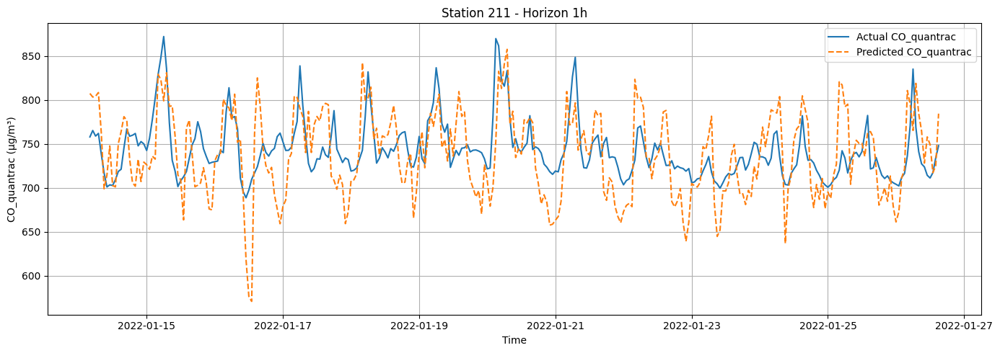

hour = 24
X_test_sid.shape: (577, 60)
y_test_sid.shape: (577, 1)
y_pred_sid.shape: (577,)


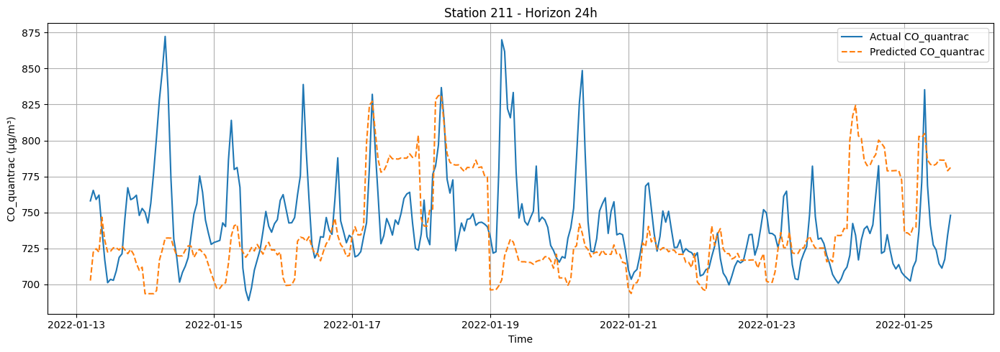

hour = 48
X_test_sid.shape: (574, 60)
y_test_sid.shape: (574, 1)
y_pred_sid.shape: (574,)


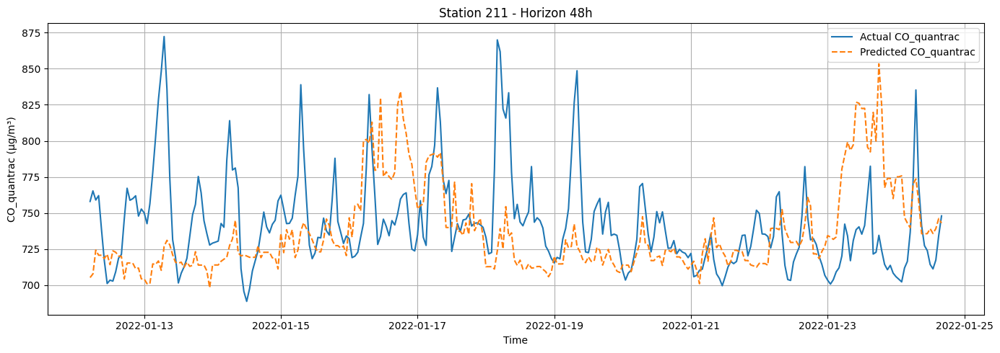

hour = 72
X_test_sid.shape: (570, 60)
y_test_sid.shape: (570, 1)
y_pred_sid.shape: (570,)


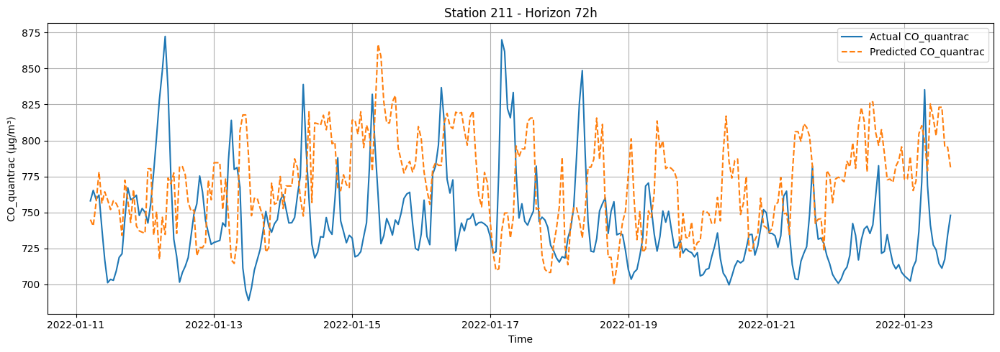

station_id = 212
hour = 1
X_test_sid.shape: (867, 60)
y_test_sid.shape: (867, 1)
y_pred_sid.shape: (867,)


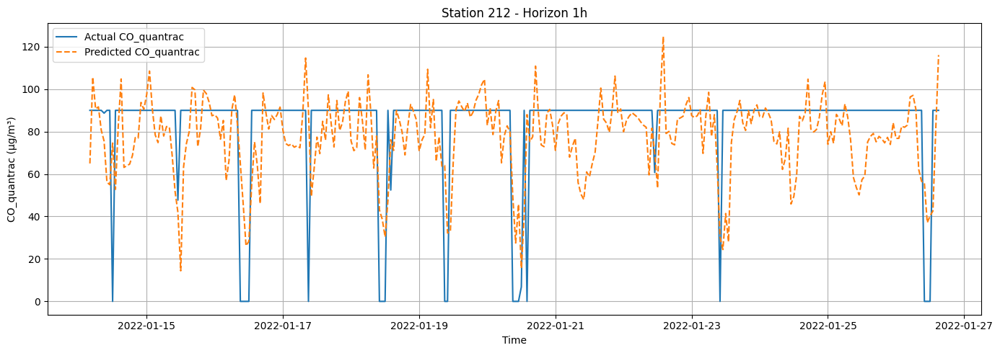

hour = 24
X_test_sid.shape: (864, 60)
y_test_sid.shape: (864, 1)
y_pred_sid.shape: (864,)


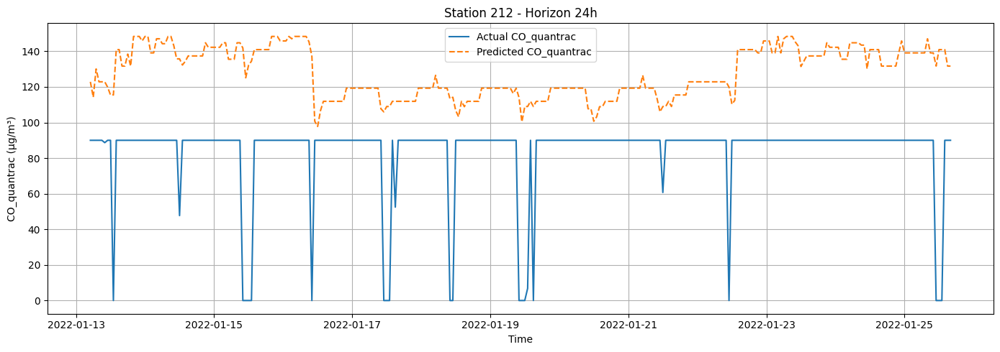

hour = 48
X_test_sid.shape: (860, 60)
y_test_sid.shape: (860, 1)
y_pred_sid.shape: (860,)


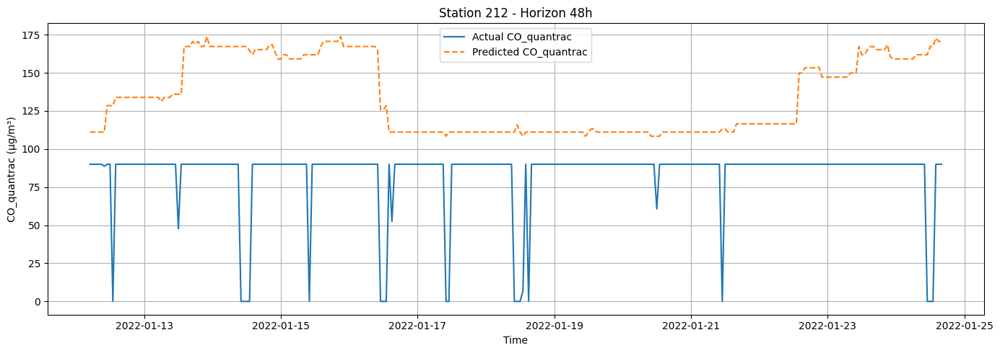

hour = 72
X_test_sid.shape: (857, 60)
y_test_sid.shape: (857, 1)
y_pred_sid.shape: (857,)


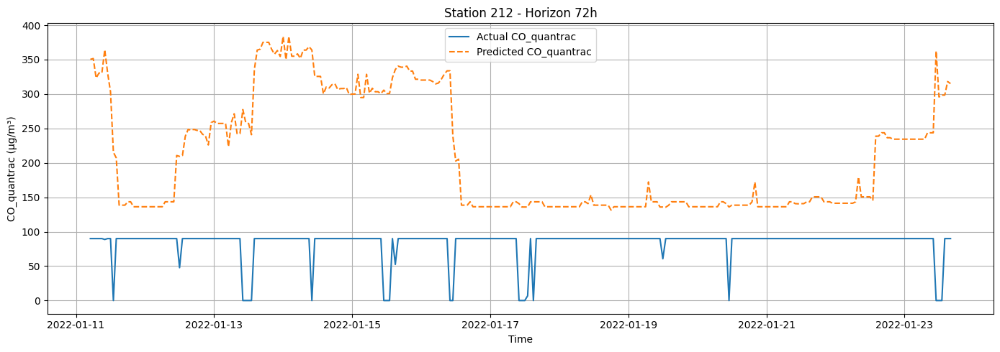

station_id = 213
hour = 1
X_test_sid.shape: (880, 60)
y_test_sid.shape: (880, 1)
y_pred_sid.shape: (880,)


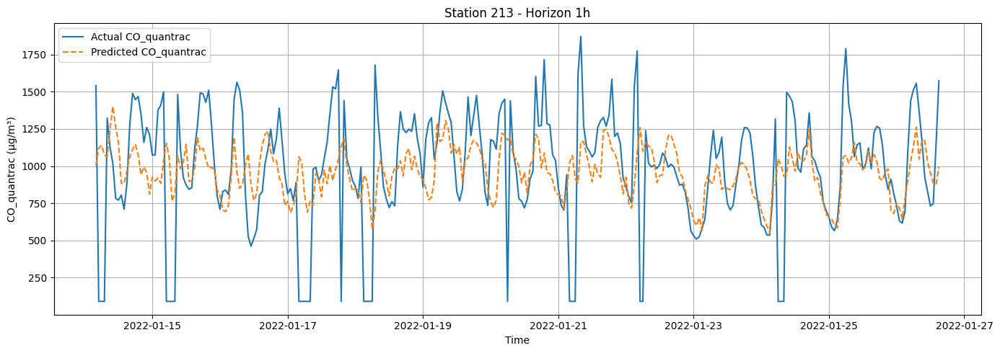

hour = 24
X_test_sid.shape: (876, 60)
y_test_sid.shape: (876, 1)
y_pred_sid.shape: (876,)


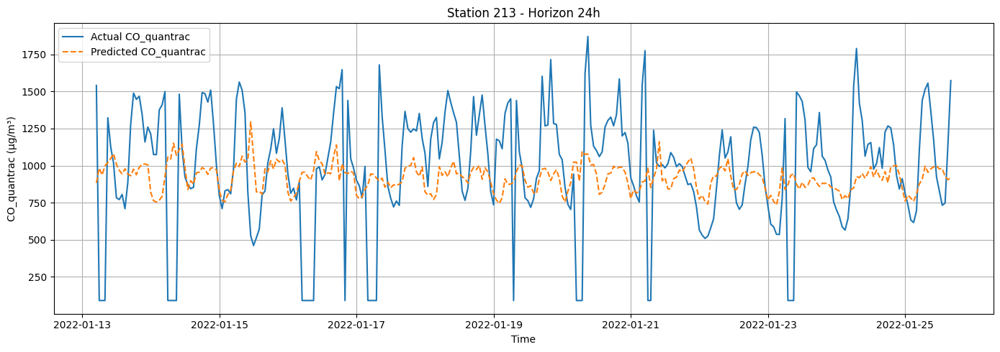

hour = 48
X_test_sid.shape: (873, 60)
y_test_sid.shape: (873, 1)
y_pred_sid.shape: (873,)


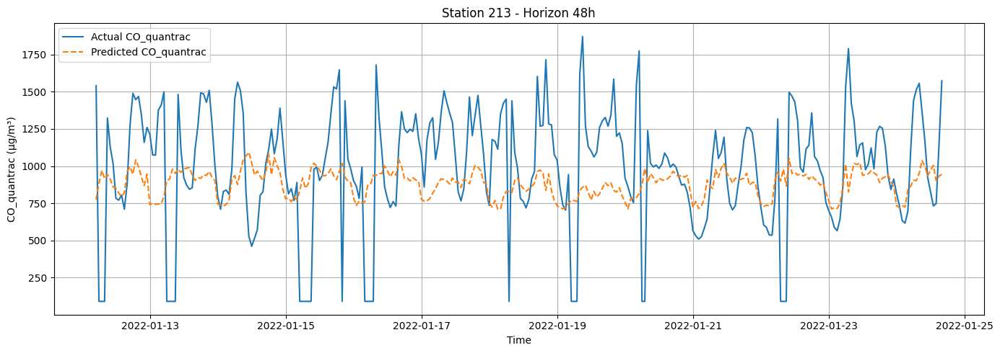

hour = 72
X_test_sid.shape: (869, 60)
y_test_sid.shape: (869, 1)
y_pred_sid.shape: (869,)


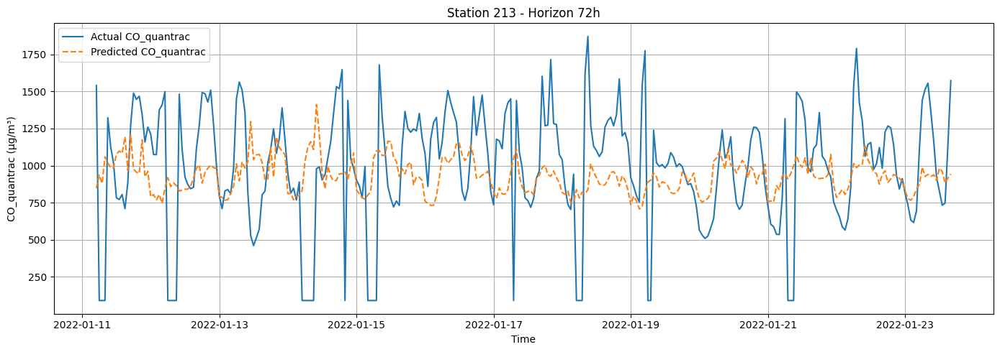

station_id = 214
hour = 1
X_test_sid.shape: (906, 60)
y_test_sid.shape: (906, 1)
y_pred_sid.shape: (906,)


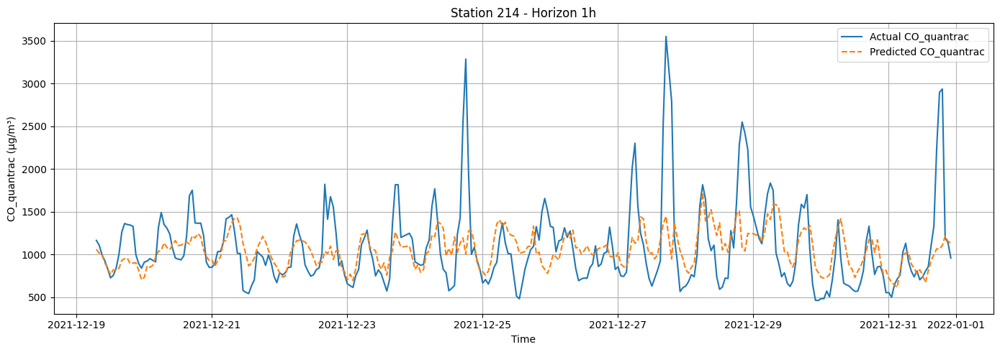

hour = 24
X_test_sid.shape: (902, 60)
y_test_sid.shape: (902, 1)
y_pred_sid.shape: (902,)


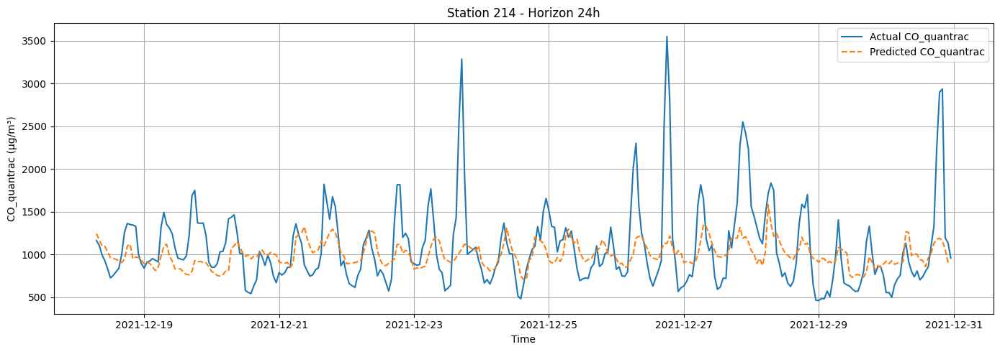

hour = 48
X_test_sid.shape: (899, 60)
y_test_sid.shape: (899, 1)
y_pred_sid.shape: (899,)


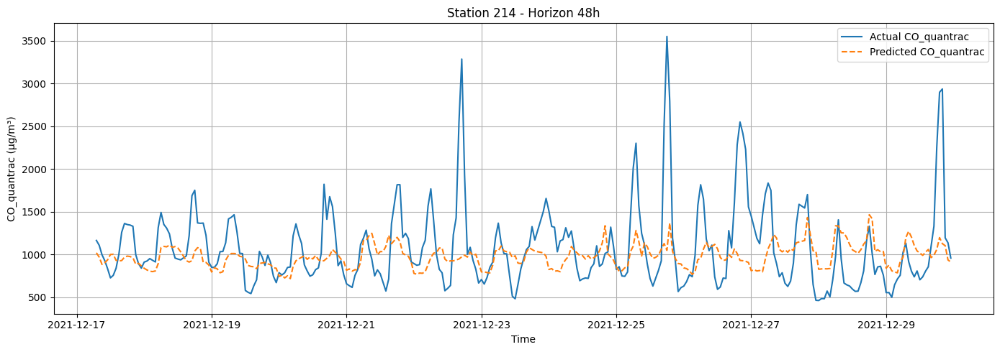

hour = 72
X_test_sid.shape: (895, 60)
y_test_sid.shape: (895, 1)
y_pred_sid.shape: (895,)


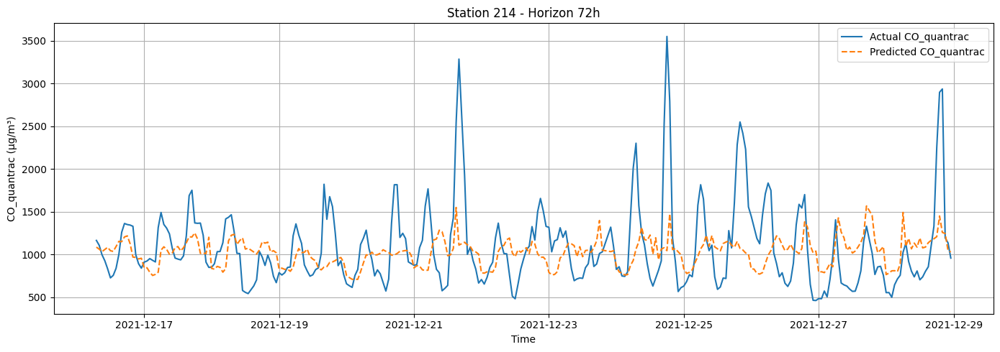

station_id = 215
hour = 1
X_test_sid.shape: (461, 60)
y_test_sid.shape: (461, 1)
y_pred_sid.shape: (461,)


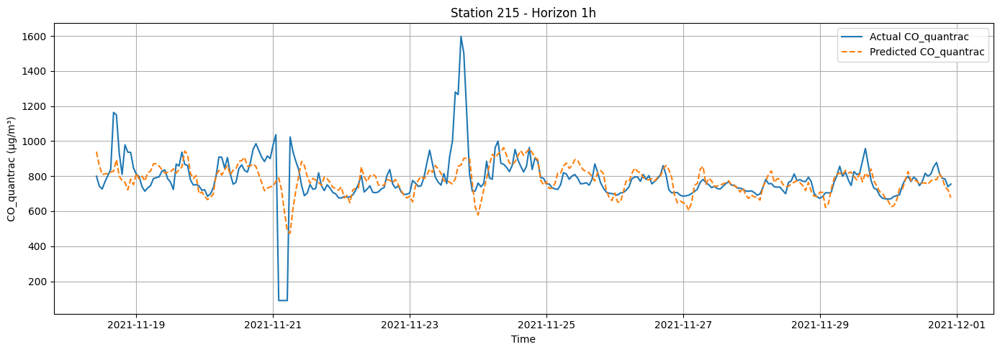

hour = 24
X_test_sid.shape: (458, 60)
y_test_sid.shape: (458, 1)
y_pred_sid.shape: (458,)


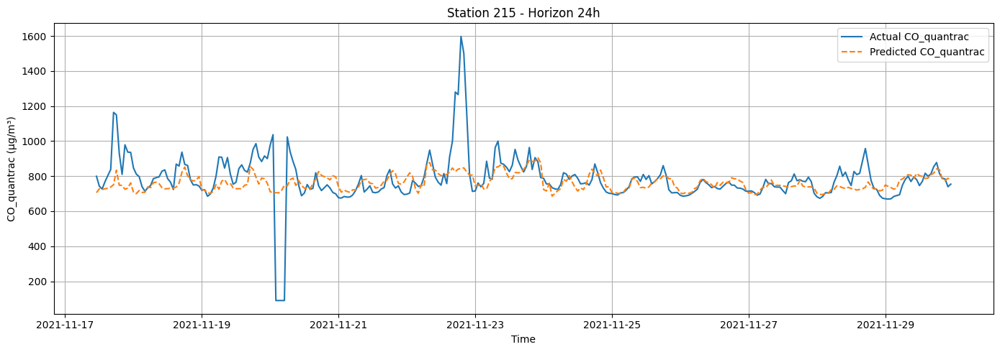

hour = 48
X_test_sid.shape: (454, 60)
y_test_sid.shape: (454, 1)
y_pred_sid.shape: (454,)


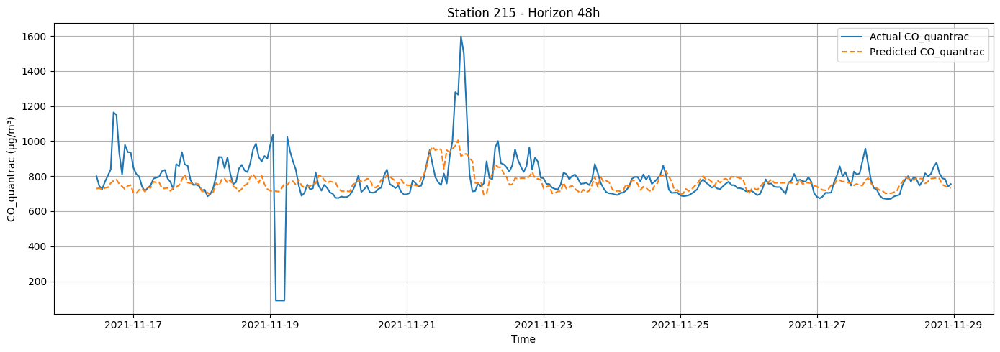

hour = 72
X_test_sid.shape: (450, 60)
y_test_sid.shape: (450, 1)
y_pred_sid.shape: (450,)


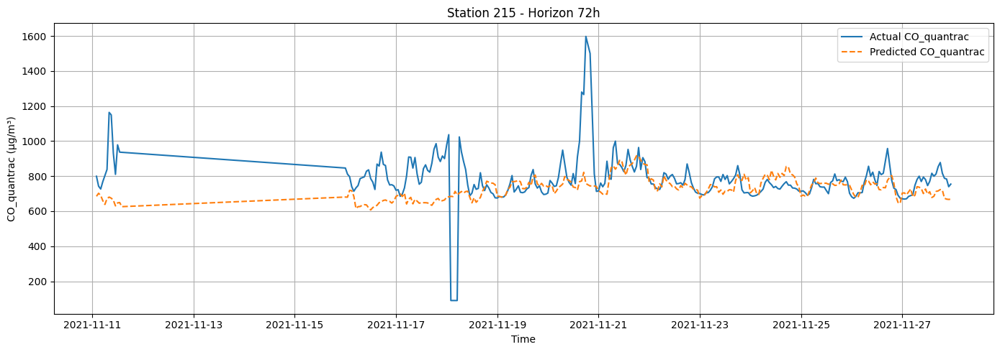

station_id = 216
hour = 1
X_test_sid.shape: (2046, 60)
y_test_sid.shape: (2046, 1)
y_pred_sid.shape: (2046,)


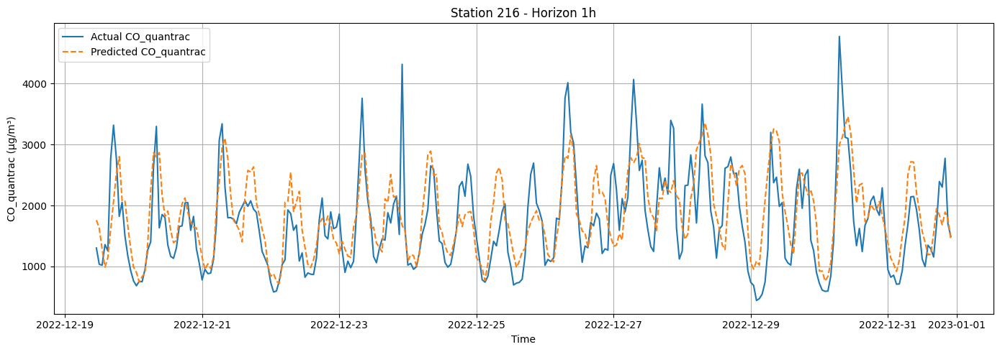

hour = 24
X_test_sid.shape: (2043, 60)
y_test_sid.shape: (2043, 1)
y_pred_sid.shape: (2043,)


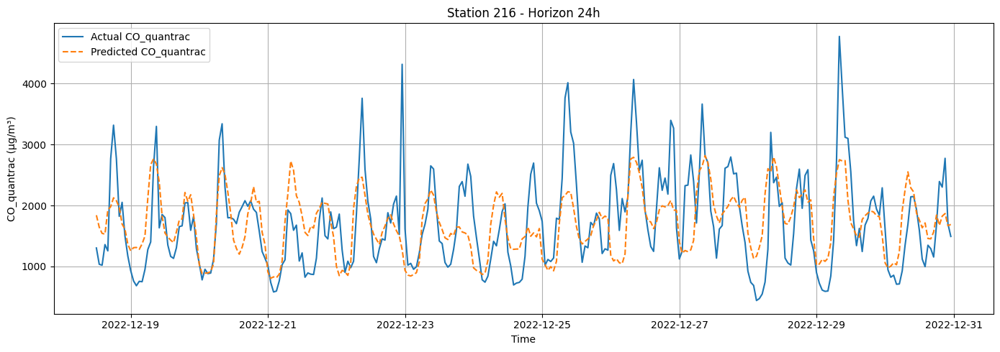

hour = 48
X_test_sid.shape: (2039, 60)
y_test_sid.shape: (2039, 1)
y_pred_sid.shape: (2039,)


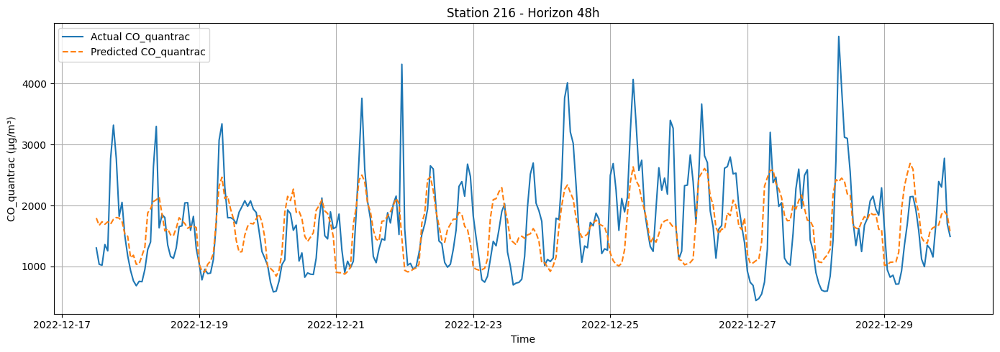

hour = 72
X_test_sid.shape: (2036, 60)
y_test_sid.shape: (2036, 1)
y_pred_sid.shape: (2036,)


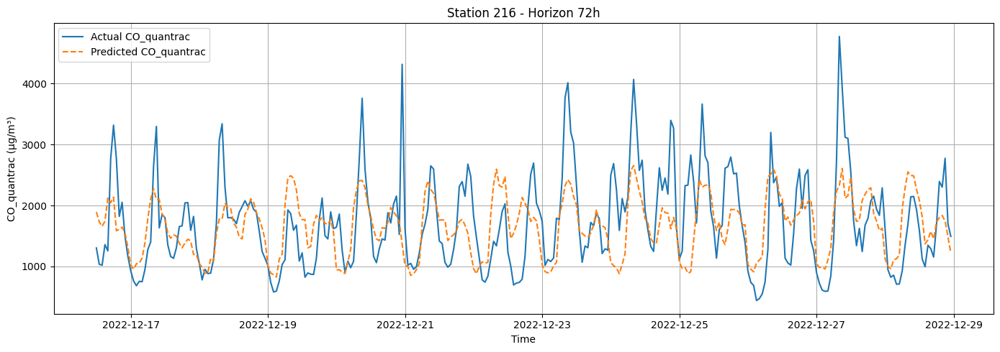

In [20]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_co, co_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)